<h1>Experiment 2</h1>
<h3>Test the robustness of each network to the undersampled data</h3>

In [1]:
import nibabel as nib
import numpy as np

from FormatData import generate_data, parser as data_parse
from Training import train_network
from utils.model import parser as model_parser
from Testing import test_model
from utils.nii_utils import mask_nii_data

2022-04-11 16:56:28.291575: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


In [2]:
train_subject = 's02_still'
# test_subjects = ['s02_still', 's03_still_reg', 's04_still_reg']
test_subjects = ['s01_still']

In [3]:
class Namespace:
    """
    a class generate parser for cmd line args
    """
    def __init__(self, **kwargs):
        self.__dict__.update(kwargs)

In [4]:
"""
packages that handle graphs
"""
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, LinearSegmentedColormap
from skimage.metrics import structural_similarity as compare_ssim
from utils import calc_ssim
%matplotlib inline
def plot_loss(cmd):
    """
    A function that used to plot the loss curve for the trained network.
    Args:
        cmd: String, the command line in the terminal
    """
    args = model_parser().parse_args(cmd.split())
    history = train_network(args)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

def show_slices(slices, grayscale=True):
    """
    Function to display the slices

    Args:
        slices (list): a list of 2d ndarray that contains the data to be displayed
        grayscale (bool, optional): True, if diplay grayscale img. Defaults to True.
    """    
    fig, axes = plt.subplots(1, len(slices), figsize=(10,10))
    cax = fig.add_axes([0, 0, .3, .3])
    for i, slice in enumerate(slices):
        # use grayscale for displaying ref and pred imgs:
        if grayscale:
            cmap = plt.get_cmap('gray')
            cmaplist = [cmap(i) for i in range(cmap.N)]
            cmap = LinearSegmentedColormap.from_list('Custom cmap', cmaplist, cmap.N)
            bounds = np.arange(0, 1.0, .01)
            idx = np.searchsorted(bounds, 0)
            bounds = np.insert(bounds, idx, 0)
            norm = BoundaryNorm(bounds, cmap.N)
            im = axes[i].imshow(slice.T, cmap=cmap, origin="lower", interpolation='none', norm=norm)
        else:
            # define the colormap
            cmap = plt.get_cmap('bwr')
            # extract all colors from the .jet map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # create the new map
            cmap = LinearSegmentedColormap.from_list('Custom cmap', cmaplist, cmap.N)
            # define the bins and normalize and forcing 0 to be part of the colorbar
            # define the min and max to be -1 and +1 respectively
            bounds = np.arange(-0.5, 0.5, .01)
            idx = np.searchsorted(bounds, 0)
            bounds = np.insert(bounds, idx, 0)
            norm = BoundaryNorm(bounds, cmap.N)
            im = axes[i].imshow(slice.T, cmap=cmap, origin="lower", interpolation='none', norm=norm)
        fig.colorbar(im, cax=cax, orientation='vertical')

def scale(img):
    # for i in range(img.shape[0]):
    #     for j in range(img.shape[1]):
    #         img[i][j] = ((img[i][j]+1)/2)*255
    return img

def compare_simi(pred, ref):
    return calc_ssim(pred, ref)

In [5]:
def visualise0(ref):
    """
    Function to visualise the ref imgs

    Args:
        ref (ndarray): the reference data
    """
    # visualise the ref imgs
    ref0 = ref[26, :, :]
    ref1 = ref[:, 30, :]
    ref2 = ref[:, :, 16]
    show_slices([ref0, ref1, ref2])
    plt.suptitle("Center slices for reference image")


def visualise1(ref_ndi, retained_vol, subject, model, layer, affine):
    """
    Function to visualise the NDI imgs and store the difference map

    Args:
        ref_ndi (ndarray): the reference NDI data
        subject (string): the subject that is examined
        model (string): the model used
        layer (int): the number of layers for the network
        retained_vol (int): the number of volumes used
    """
    patch = 3
    if model == 'fc1d':
        patch = 1

    print(patch)
    print(model)
    # visualise the ref imgs
    refNDI0 = ref_ndi[26, :, :]
    refNDI1 = ref_ndi[:, 30, :]
    refNDI2 = ref_ndi[:, :, 16]

    # visualise the pred imgs produced at varied input size
    ndi_path = '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_NDIsynthetic.nii'
    ndi_img = nib.load(ndi_path)
    ndi_data = ndi_img.get_fdata()

    ndi0 = ndi_data[26, :, :]
    ndi1 = ndi_data[:, 30, :]
    ndi2 = ndi_data[:, :, 16]
    show_slices([ndi0, ndi1, ndi2])
    plt.suptitle('Center slices for NDI predicted image by '+model+', input size='+str(retained_vol))
    (score, ndidiff) = compare_ssim(ndi_data, ref_ndi, full=True)
    print(str(retained_vol)+'input size the ssim score for ndi is: ' + str(score))

    # plot the difference map between the imgs by the lib
    ndidiff0 = scale(refNDI0 - ndi0)
    ndidiff1 = scale(refNDI1 - ndi1)
    ndidiff2 = scale(refNDI2 - ndi2)
    show_slices([ndidiff0, ndidiff1, ndidiff2], grayscale=False)
    plt.suptitle("Difference map NDI")

    diff_img_np = ref_ndi - ndi_data
    diff_img = nib.Nifti1Image(diff_img_np, affine)
    nib.save(diff_img, '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_NDI_difference_synthetic.nii')

def visualise2(ref_odi, retained_vol, subject, model, layer, affine):
    """
    Function to visualise the ODI imgs and difference maps

    Args:
        ref_odi (ndarray): the reference ODI data
        retained_vol (int): the number of volumes retained after rejection
        subject (string): the subject that is examined
        model (string): the model used
        layer (int): the number of layers for the network
    """
    patch = 3
    if model == 'fc1d':
        patch = 1

    print(patch)
    print(model)
    # visualise the ref imgs
    refODI0 = ref_odi[26, :, :]
    refODI1 = ref_odi[:, 30, :]
    refODI2 = ref_odi[:, :, 16]

    # visualise the pred imgs produced at varied input size
    odi_path = '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_ODIsynthetic.nii'
    odi_img = nib.load(odi_path)
    odi_data = odi_img.get_fdata()

    odi0 = odi_data[26, :, :]
    odi1 = odi_data[:, 30, :]
    odi2 = odi_data[:, :, 16]
    show_slices([odi0, odi1, odi2])
    plt.suptitle('Center slices for ODI predicted image by '+model+', input size='+str(retained_vol))
    (score, odidiff) = compare_ssim(odi_data, ref_odi, full=True)
    print(str(retained_vol)+'input size the ssim score for odi is: ' + str(score))

    odidiff0 = scale(refODI0 - odi0)
    odidiff1 = scale(refODI1 - odi1)
    odidiff2 = scale(refODI2 - odi2)
    show_slices([odidiff0, odidiff1, odidiff2], grayscale=False)
    plt.suptitle("Difference map ODI")

    diff_img_np = ref_odi - odi_data
    diff_img = nib.Nifti1Image(diff_img_np, affine)
    nib.save(diff_img, '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_ODI_difference_synthetic.nii')

def visualise3(ref_fwf, retained_vol, subject, model, layer, affine):
    """
    Function to visualise the fwf imgs and difference maps

    Args:
        ref_fwf (ndarray): the reference FWF data
        retained_vol (int): the number of volumes retained after rejection
        subject (string): the subject that is examined
        model (string): the model used
        layer (int): the number of layers for the network
    """
    patch = 3
    if model == 'fc1d':
        patch = 1

    print(patch)
    print(model)
    # visualise the ref imgs
    refFWF0 = ref_fwf[26, :, :]
    refFWF1 = ref_fwf[:, 30, :]
    refFWF2 = ref_fwf[:, :, 16]

    # visualise the pred imgs produced at varied input size
    fwf_path = '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_FWFsynthetic.nii'
    fwf_img = nib.load(fwf_path)
    fwf_data = fwf_img.get_fdata()

    fwf0 = fwf_data[26, :, :]
    fwf1 = fwf_data[:, 30, :]
    fwf2 = fwf_data[:, :, 16]
    show_slices([fwf0, fwf1, fwf2])
    plt.suptitle('Center slices for FWF predicted image by '+model+', input size='+str(retained_vol))
    (score, fwfdiff) = compare_ssim(fwf_data, ref_fwf, full=True)
    print(str(retained_vol)+'input size the ssim score for fwf is: ' + str(score))

    # plot the difference map between the imgs by the lib
    fwfdiff0 = scale(refFWF0 - fwf0)
    fwfdiff1 = scale(refFWF1 - fwf1)
    fwfdiff2 = scale(refFWF2 - fwf2)
    show_slices([fwfdiff0, fwfdiff1, fwfdiff2], grayscale=False)
    plt.suptitle("Difference map FWF")

    diff_img_np = ref_fwf - fwf_data
    diff_img = nib.Nifti1Image(diff_img_np, affine)
    nib.save(diff_img, '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_FWF_difference_synthetic.nii')

def visualise4(ref_ndi, ref_odi, ref_fwf, retained_vol, subject, model, layer, affine1, affine2, affine3):
    """
    Function to visualise the imgs and difference maps

    Args:
        ref_ndi (ndarray): the reference NDI data
        ref_odi (ndarray): the reference ODI data
        ref_fwf (ndarray): the reference FWF data
        retained_vol (int): the number of volumes retained after rejection
        subject (string): the subject that is examined
        model (string): the model used
        layer (int): the number of layers for the network
    """
    patch = 3
    if model == 'fc1d':
        patch = 1

    print(patch)
    print(model)
    # visualise the ref imgs
    refNDI0 = ref_ndi[26, :, :]
    refNDI1 = ref_ndi[:, 30, :]
    refNDI2 = ref_ndi[:, :, 16]

    refODI0 = ref_odi[26, :, :]
    refODI1 = ref_odi[:, 30, :]
    refODI2 = ref_odi[:, :, 16]

    refFWF0 = ref_fwf[26, :, :]
    refFWF1 = ref_fwf[:, 30, :]
    refFWF2 = ref_fwf[:, :, 16]

    # visualise the pred imgs produced at varied input size
    ndi_path = '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_NDIsynthetic.nii'
    odi_path = '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_ODIsynthetic.nii'
    fwf_path = '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_FWFsynthetic.nii'
    ndi_img = nib.load(ndi_path)
    ndi_data = ndi_img.get_fdata()
    odi_img = nib.load(odi_path)
    odi_data = odi_img.get_fdata()
    fwf_img = nib.load(fwf_path)
    fwf_data = fwf_img.get_fdata()

    ndi0 = ndi_data[26, :, :]
    ndi1 = ndi_data[:, 30, :]
    ndi2 = ndi_data[:, :, 16]
    show_slices([ndi0, ndi1, ndi2])
    plt.suptitle('Center slices for NDI predicted image by '+model+', input size='+str(retained_vol))
    (score, ndidiff) = compare_ssim(ndi_data, ref_ndi, full=True)
    print(str(retained_vol)+'input size the ssim score for ndi is: ' + str(score))

    odi0 = odi_data[26, :, :]
    odi1 = odi_data[:, 30, :]
    odi2 = odi_data[:, :, 16]
    show_slices([odi0, odi1, odi2])
    plt.suptitle('Center slices for ODI predicted image by '+model+', input size='+str(retained_vol))
    (score, odidiff) = compare_ssim(odi_data, ref_odi, full=True)
    print(str(retained_vol)+'input size the ssim score for odi is: ' + str(score))

    fwf0 = fwf_data[26, :, :]
    fwf1 = fwf_data[:, 30, :]
    fwf2 = fwf_data[:, :, 16]
    show_slices([fwf0, fwf1, fwf2])
    plt.suptitle('Center slices for FWF predicted image by '+model+', input size='+str(retained_vol))
    (score, fwfdiff) = compare_ssim(fwf_data, ref_fwf, full=True)
    print(str(retained_vol)+'input size the ssim score for fwf is: ' + str(score))

    # plot the difference map between the imgs by the lib
    ndidiff0 = scale(refNDI0 - ndi0)
    ndidiff1 = scale(refNDI1 - ndi1)
    ndidiff2 = scale(refNDI2 - ndi2)
    show_slices([ndidiff0, ndidiff1, ndidiff2], grayscale=False)
    plt.suptitle("Difference map NDI")

    diff_img_np = ref_ndi - ndi_data
    diff_img = nib.Nifti1Image(diff_img_np, affine1)
    nib.save(diff_img, '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_NDI_difference_synthetic.nii')

    odidiff0 = scale(refODI0 - odi0)
    odidiff1 = scale(refODI1 - odi1)
    odidiff2 = scale(refODI2 - odi2)
    show_slices([odidiff0, odidiff1, odidiff2], grayscale=False)
    plt.suptitle("Difference map ODI")

    diff_img_np = ref_odi - odi_data
    diff_img = nib.Nifti1Image(diff_img_np, affine2)
    nib.save(diff_img, '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_ODI_difference_synthetic.nii')

    fwfdiff0 = scale(refFWF0 - fwf0)
    fwfdiff1 = scale(refFWF1 - fwf1)
    fwfdiff2 = scale(refFWF2 - fwf2)
    show_slices([fwfdiff0, fwfdiff1, fwfdiff2], grayscale=False)
    plt.suptitle("Difference map FWF")

    diff_img_np = ref_fwf - fwf_data
    diff_img = nib.Nifti1Image(diff_img_np, affine3)
    nib.save(diff_img, '../Net/nii/'+subject+'-'+str(retained_vol)+'-'+model+'-patch_'+str(patch)+'-base_1-layer_'+str(layer)+'-label_FWF_difference_synthetic.nii')

___
<h3>Data Preprocessing</h3>

In [6]:
# motion-free subject path
s01_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s01_still/'
s02_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s02_still/'
s03_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s03_still_reg/'
s04_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s04_still_reg/'
# motion-free target labels
s01_NDI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s01_still/s01_still_NDI.nii'
s02_NDI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s02_still/s02_still_NDI.nii'
s03_NDI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s03_still_reg/s03_still_reg_NDI.nii'
s04_NDI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s04_still_reg/s04_still_reg_NDI.nii'

s01_ODI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s01_still/s01_still_ODI.nii'
s02_ODI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s02_still/s02_still_ODI.nii'
s03_ODI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s03_still_reg/s03_still_reg_ODI.nii'
s04_ODI_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s04_still_reg/s04_still_reg_ODI.nii'

s01_FWF_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s01_still/s01_still_FWF.nii'
s02_FWF_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s02_still/s02_still_FWF.nii'
s03_FWF_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s03_still_reg/s03_still_reg_FWF.nii'
s04_FWF_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s04_still_reg/s04_still_reg_FWF.nii'

In [7]:
def filter_mask(subpath, fwfpath, threshold=0.99):
    """
    By looking at the imgs generated, we have found out there are some regions that should not be included. Since they have values higher than 1.0
    And we have found out voxels have NDI and ODI values, while that voxel has GROUND TRUTH FWF 1.0
    This should indicate that that voxel should not even be included in the training
    Therefore we want to filter the each subject's mask first, by using their corresponding GROUND TRUTH FWF

    Args:
        subpath (string): the path of the subject folder
        fwfpath (string): the path of the corresponding fwf file
        threshold (float): the thresholds to be used to filter of the mask,
                           a stringnent threshold would be 0.9, the least stringnent threshold is 1.0
                           by default, it is set to 0.99
    """
    # fetch the mask data
    img_mask = nib.load(subpath+'mask-e.nii')
    original_mask = img_mask.get_fdata()
    original_affine = img_mask.affine
    shape = original_mask.shape # retain the shape of the mask
    origin_nonzeros = np.count_nonzero(original_mask)
    print('original mask has: ' + str(origin_nonzeros) + ' of nonzero voxels')
    # fetch the FWF data
    fwf = nib.load(fwfpath).get_fdata()
    # filter
    mask = original_mask.flatten() # this makes a copy of the orginal mask
    fwf = fwf.reshape(mask.shape[0]) # reshape fwf to the corresponding shape
    for i in range(len(mask)):
        # if fwf has high value, means there is no tissue
        # therefore, the voxel should be excluded
        if fwf[i] >= threshold:
            mask[i] = 0.0
    # reshape mask back
    mask = mask.reshape(shape)
    filter_nonzeros = np.count_nonzero(mask)
    print('filtered mask has: ' +str(filter_nonzeros) + ' of nonzero voxels')
    # save the mask
    filter_img = nib.Nifti1Image(mask, original_affine)
    nib.save(filter_img, subpath+'filtered_mask.nii')

In [8]:
# Use the above code to filter each subject's mask. Store as filtered_mask.nii in each subject folder
filter_mask(s01_path, s01_FWF_path)
filter_mask(s02_path, s02_FWF_path)
filter_mask(s03_path, s04_FWF_path)
filter_mask(s04_path, s03_FWF_path)

original mask has: 82889 of nonzero voxels
filtered mask has: 81882 of nonzero voxels
original mask has: 94198 of nonzero voxels
filtered mask has: 91401 of nonzero voxels
original mask has: 91131 of nonzero voxels
filtered mask has: 89491 of nonzero voxels
original mask has: 88241 of nonzero voxels
filtered mask has: 87347 of nonzero voxels


In [9]:
# filtered mask path for each subject
s01_mask_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s01_still/filtered_mask.nii'
s02_mask_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s02_still/filtered_mask.nii'
s03_mask_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s03_still_reg/filtered_mask.nii'
s04_mask_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s04_still_reg/filtered_mask.nii'

In [10]:
"""
Generate base datasets for each subject
"""
ltype = ['A']
for l in ltype:
    print('Generating basedataset for label: ' + l)
    cmd = '--base --label_type ' + l + ' --subjects s01_still s02_still'
    args = data_parser().parse_args(cmd.split())
    generate_data(args)

Generating basedataset for label: A
Generating for s01_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 3)
Generating for s02_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 3)


In [11]:
"""
Generate training dataset for ANN.
"""
cmd = "--subjects s01_still s02_still --fc1d --label_type A"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (352800,)
data befor masking has shape: (352800, 96)
data after masking has shape: (81882, 96) the ratio of masked voxel is: 0.23209183673469388
training dataset has shape:(81882, 96)
(84, 84, 50, 3)
mask has shape: (352800,)
data befor masking has shape: (352800, 3)
data after masking has shape: (81882, 3) the ratio of masked voxel is: 0.23209183673469388
training label has shape:(81882, 3)
Generating for s02_still ...
mask has shape: (352800,)
data befor masking has shape: (352800, 96)
data after masking has shape: (91401, 96) the ratio of masked voxel is: 0.2590731292517007
training dataset has shape:(91401, 96)
(84, 84, 50, 3)
mask has shape: (352800,)
data befor masking has shape: (352800, 3)
data after masking has shape: (91401, 3) the ratio of masked voxel is: 0.2590731292517007
training label has shape:(91401, 3)


In [12]:
# Generate the dataset for 2D CNN
cmd = "--subjects s01_still s02_still --conv2d --label_type A"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 48, 96)
label has shape: (82, 82, 48, 3)
(81634, 3, 3, 96)
saved patches has shape: (81634, 3, 3, 96)
(81634, 1, 1, 3)
svaed labels has shape: (81634, 1, 1, 3)
Generating for s02_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 48, 96)
label has shape: (82, 82, 48, 3)
(90846, 3, 3, 96)
saved patches has shape: (90846, 3, 3, 96)
(90846, 1, 1, 3)
svaed labels has shape: (90846, 1, 1, 3)


In [13]:
# Generate the dataset for 3D CNN
cmd = "--subjects s01_still s02_still --conv3d --label_type A"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 50, 96)
label has shape: (82, 82, 48, 3)
(84, 84, 50, 96) (82, 82, 48)
(81634, 3, 3, 3, 96)
saved patches has shape: (81634, 2592)
(82, 82, 48, 3) (82, 82, 48)
(81634, 1, 1, 1, 3)
svaed labels has shape: (81634, 1, 1, 1, 3)
Generating for s02_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 50, 96)
label has shape: (82, 82, 48, 3)
(84, 84, 50, 96) (82, 82, 48)
(90846, 3, 3, 3, 96)
saved patches has shape: (90846, 2592)
(82, 82, 48, 3) (82, 82, 48)
(90846, 1, 1, 1, 3)
svaed labels has shape: (90846, 1, 1, 1, 3)


In [10]:
"""
Using nib to fetch the ground truth img
"""
#load the truth data for subject 1
s01_NDI_img = nib.load(s01_NDI_path)
s01_ODI_img = nib.load(s01_ODI_path)
s01_FWF_img = nib.load(s01_FWF_path)
s01_NDI_affine = s01_NDI_img.affine
s01_ODI_affine = s01_ODI_img.affine
s01_FWF_affine = s01_FWF_img.affine
s01_NDI_img_data = s01_NDI_img.get_fdata()
s01_ODI_img_data = s01_ODI_img.get_fdata()
s01_FWF_img_data = s01_FWF_img.get_fdata()
#load the truth data for subject 2
s02_NDI_img = nib.load(s02_NDI_path)
s02_ODI_img = nib.load(s02_ODI_path)
s02_FWF_img = nib.load(s02_FWF_path)
s02_NDI_affine = s02_NDI_img.affine
s02_ODI_affine = s02_ODI_img.affine
s02_FWF_affine = s02_FWF_img.affine
s02_NDI_img_data = s02_NDI_img.get_fdata()
s02_ODI_img_data = s02_ODI_img.get_fdata()
s02_FWF_img_data = s02_FWF_img.get_fdata()
# load the truth data for subject 3
s03_NDI_img = nib.load(s03_NDI_path)
s03_ODI_img = nib.load(s03_ODI_path)
s03_FWF_img = nib.load(s03_FWF_path)
s03_NDI_affine = s03_NDI_img.affine
s03_ODI_affine = s03_ODI_img.affine
s03_FWF_affine = s03_FWF_img.affine
s03_NDI_img_data = s03_NDI_img.get_fdata()
s03_ODI_img_data = s03_ODI_img.get_fdata()
s03_FWF_img_data = s03_FWF_img.get_fdata()
# load the truth data for subject 4
s04_NDI_img = nib.load(s04_NDI_path)
s04_ODI_img = nib.load(s04_ODI_path)
s04_FWF_img = nib.load(s04_FWF_path)
s04_NDI_affine = s04_NDI_img.affine
s04_ODI_affine = s04_ODI_img.affine
s04_FWF_affine = s04_FWF_img.affine
s04_NDI_img_data = s04_NDI_img.get_fdata()
s04_ODI_img_data = s04_ODI_img.get_fdata()
s04_FWF_img_data = s04_FWF_img.get_fdata()

<h4>Test the performace of each network to generate each parameter with varied number of DWI as input size</h4>

Each network (ANN, 2D CNN and 3D CNN) should be implemented with 5 hidden layers. The choice is suggested from the obtained results from the previous experiment

DWI = 4

In [15]:
dwi = 4

4
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 4)]               0         
_________________________________________________________________
dense (Dense)                (None, 150)               750       
_________________________________________________________________
dense_1 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_2 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_3 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout (Dropout)            (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)              

2022-04-09 21:25:17.893793: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-04-09 21:25:17.924576: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-09 21:25:17.924929: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 3060 computeCapability: 8.6
coreClock: 1.777GHz coreCount: 28 deviceMemorySize: 11.76GiB deviceMemoryBandwidth: 335.32GiB/s
2022-04-09 21:25:17.924945: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-04-09 21:25:17.941792: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-04-09 21:25:17.966750: I tensorflow/stream_executor/pl

The remained data has shape: (91401, 4)
(91401, 4)
(91401, 150)
(91401, 150)
(91401, 150)
(91401, 150)
(91401, 150)
(91401, 3)
(91401, 3)
Training start ...


2022-04-09 21:25:18.420846: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:25:18.420886: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1391] Profiler found 1 GPUs
2022-04-09 21:25:18.424949: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcupti.so.10.1
2022-04-09 21:25:18.427291: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


2022-04-09 21:25:18.716724: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:25:18.719844: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:25:18.721407: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:25:18.723805: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_25_18
2022-04-09 21:25:18.724379: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_25_18/vw.trace.json.gz
2022-04-09 21:25:18.724453: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:25:18.727009: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

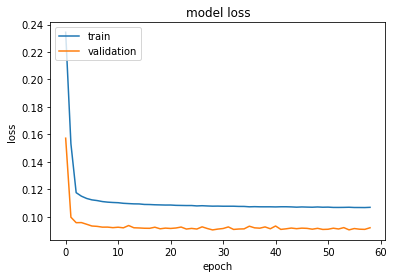

4-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 4)
Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 4)]               0         
_________________________________________________________________
dense_4 (Dense)              (None, 150)               750       
_________________________________________________________________
dense_5 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_6 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_7 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout_1 (Dropout)          (None, 150)               0         
_____________________________________________________

/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/nipy/io/files.py:145: FutureWarning: Default `strict` currently False; this will change to True in a future version of nipy
  ni_img = nipy2nifti(img, data_dtype = io_dtype)


In [16]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

4
Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 3, 3, 4)]         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 1, 1, 150)         5550      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 1, 3)        

2022-04-09 21:25:46.455572: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:25:46.455658: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:25:46.732297: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:25:46.757105: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:25:46.757384: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:25:46.758755: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_25_46
2022-04-09 21:25:46.759347: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_25_46/vw.trace.json.gz
2022-04-09 21:25:46.759430: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:25:46.760529: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

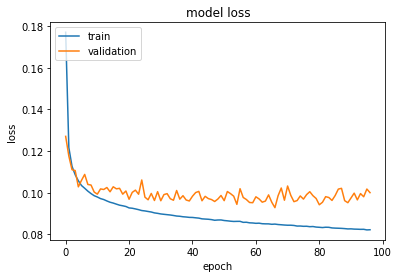

4-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 4)
Model: "functional_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 84, 84, 4)]       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 82, 82, 150)       5550      
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_3 (Dropout)          (None, 82, 82, 150)       0         
__________________________________________________

In [17]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

4
Model: "functional_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 3, 3, 3, 4)]      0         
_________________________________________________________________
conv3d (Conv3D)              (None, 1, 1, 1, 150)      16350     
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_3 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_4 (Dropout)          (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_4 (Conv3D)            (None, 1, 1, 1, 3)    

2022-04-09 21:27:06.415089: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:27:06.415227: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:27:06.682714: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:27:06.703288: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:27:06.703568: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:27:06.704907: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_27_06
2022-04-09 21:27:06.705478: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_27_06/vw.trace.json.gz
2022-04-09 21:27:06.705549: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:27:06.706637: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

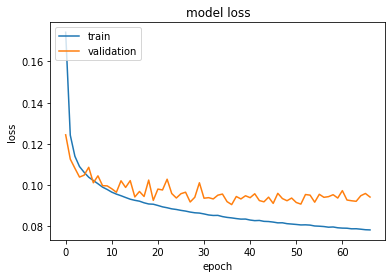

4-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 84, 84, 50, 4)]   0         
_________________________________________________________________
conv3d_5 (Conv3D)            (None, 82, 82, 48, 150)   16350     
_________________________________________________________________
conv3d_6 (Conv3D)            (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_7 (Conv3D)            (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_8 (Conv3D)            (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_5 (Dropout)          (None, 82, 82, 48, 150)   0         
_________________________________________________

In [18]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
4input size the ssim score for ndi is: 0.9450665675023139
4input size the ssim score for odi is: 0.8908307369259367
4input size the ssim score for fwf is: 0.9157506003485971
3
conv2d
4input size the ssim score for ndi is: 0.949405928761572
4input size the ssim score for odi is: 0.9097318787908377
4input size the ssim score for fwf is: 0.923938573756464
3
conv3d
4input size the ssim score for ndi is: 0.9531622591878613
4input size the ssim score for odi is: 0.9113038750415727
4input size the ssim score for fwf is: 0.9283673056922727


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


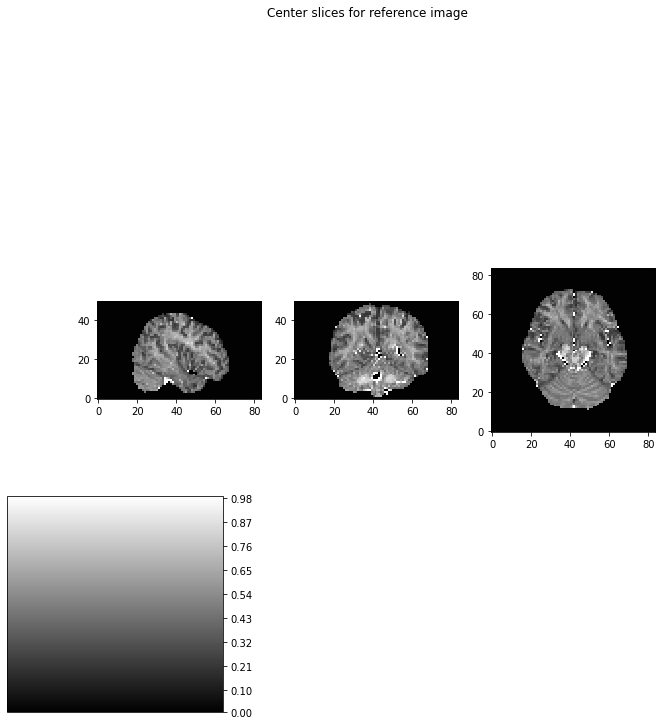

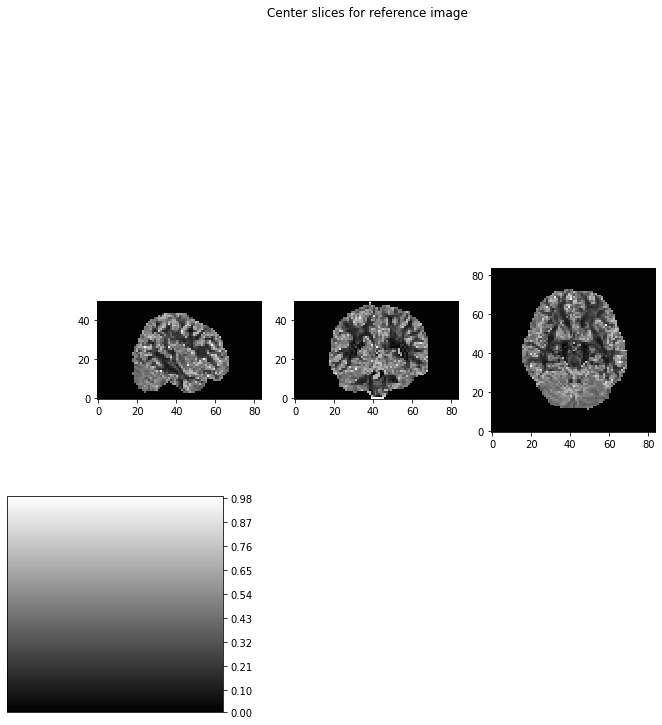

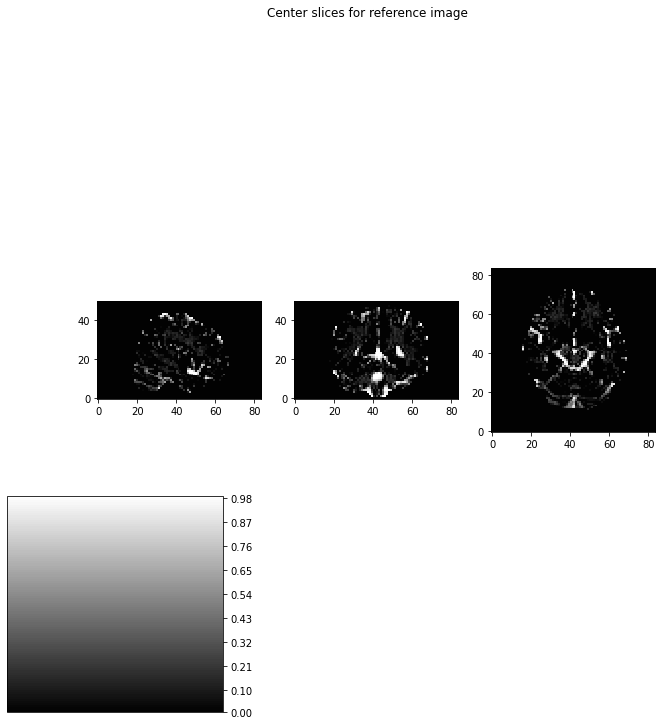

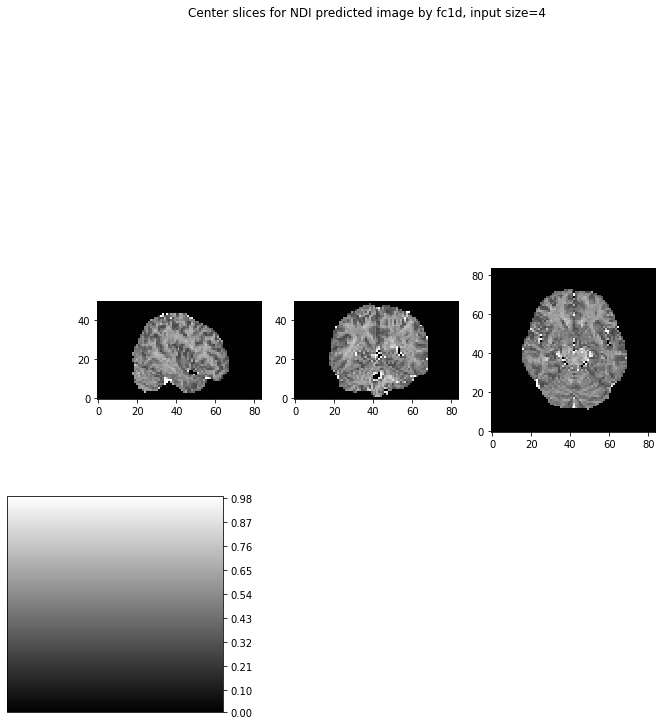

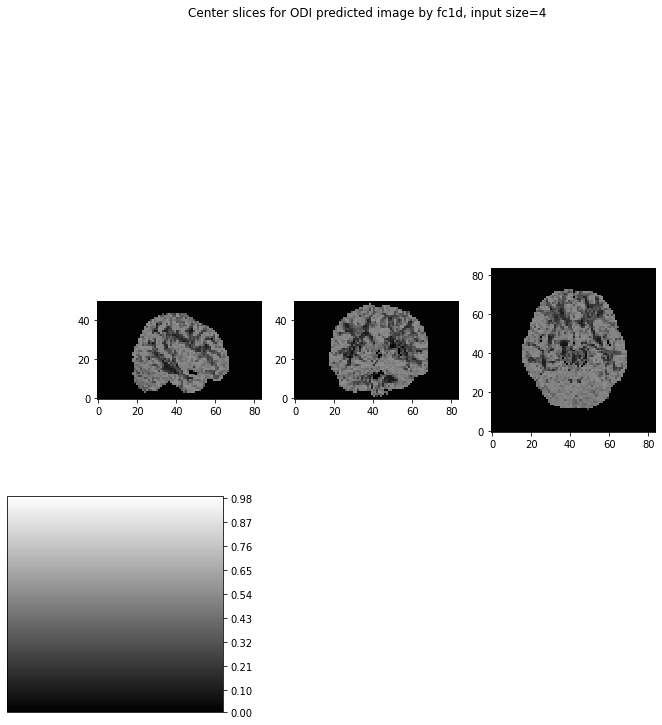

...

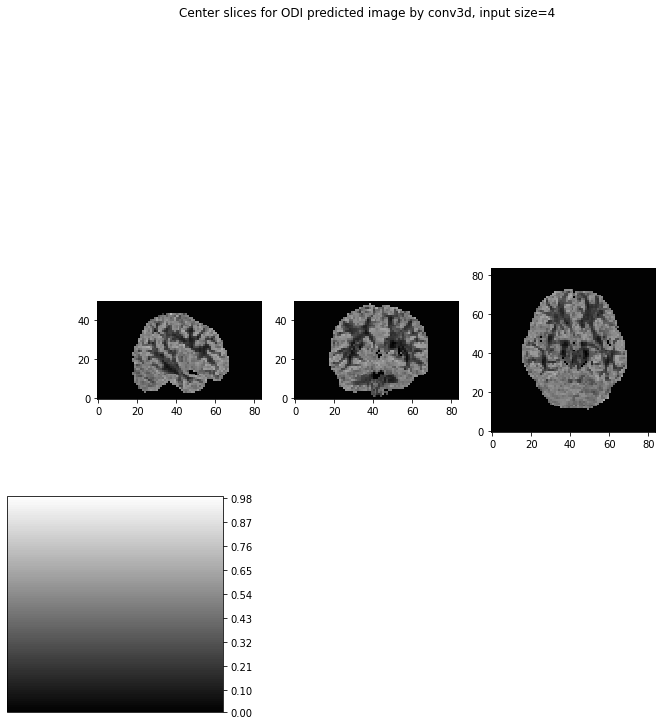

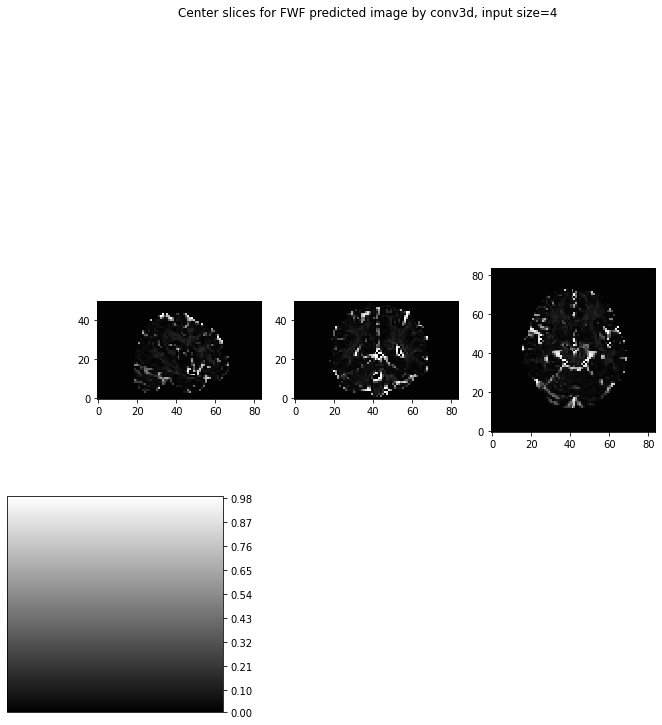

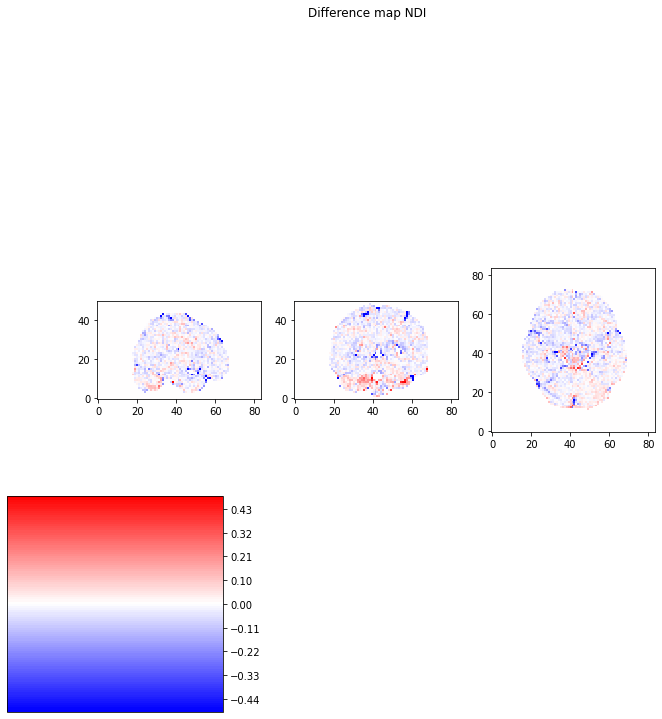

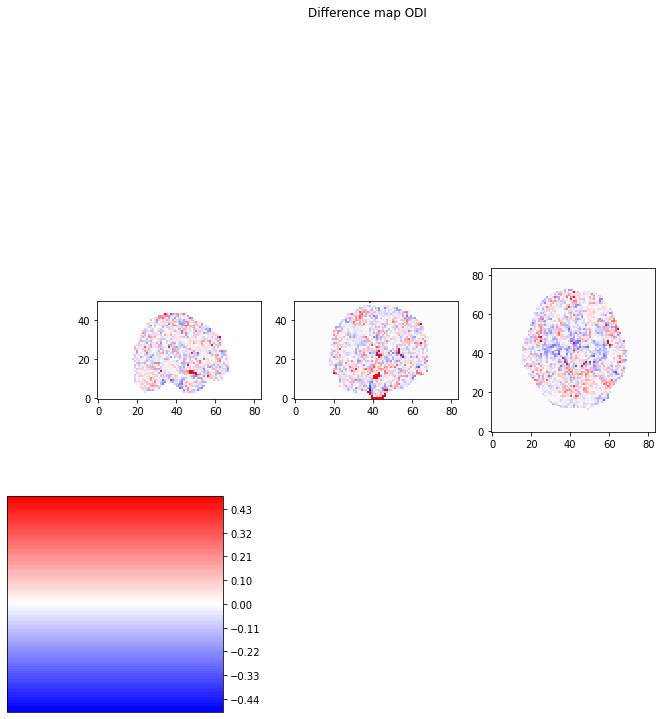

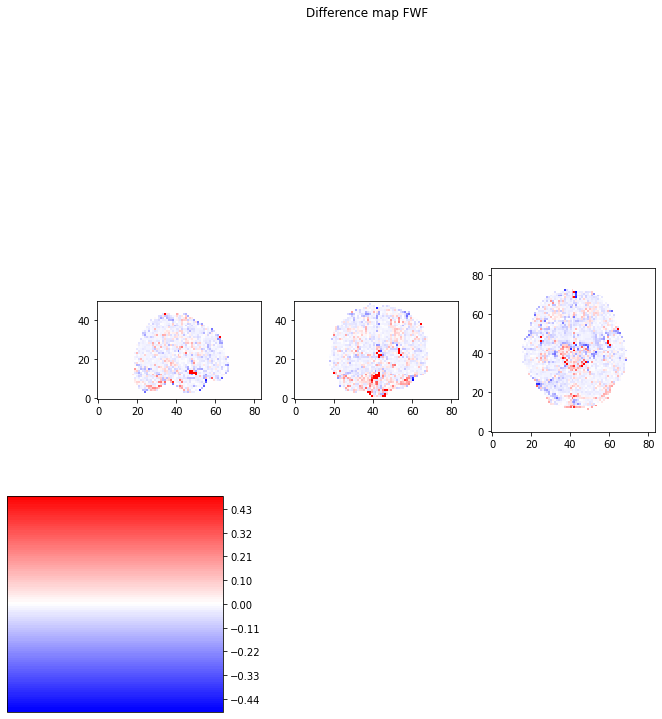

In [19]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 5

In [20]:
dwi = 5

5
Model: "functional_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 5)]               0         
_________________________________________________________________
dense_8 (Dense)              (None, 150)               900       
_________________________________________________________________
dense_9 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_10 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_11 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_6 (Dropout)          (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-04-09 21:28:06.487292: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:28:06.487378: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:28:06.744415: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:28:06.764985: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:28:06.765260: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:28:06.766691: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_28_06
2022-04-09 21:28:06.767279: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_28_06/vw.trace.json.gz
2022-04-09 21:28:06.767363: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:28:06.768475: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

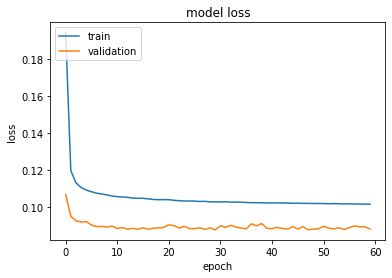

5-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 5)
Model: "functional_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 5)]               0         
_________________________________________________________________
dense_12 (Dense)             (None, 150)               900       
_________________________________________________________________
dense_13 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_14 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_15 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_7 (Dropout)          (None, 150)               0         
____________________________________________________

In [21]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

5
Model: "functional_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 3, 3, 5)]         0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 1, 1, 150)         6900      
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_8 (Dropout)          (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 1, 1, 3)       

2022-04-09 21:28:38.386073: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:28:38.386168: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:28:38.668881: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:28:38.691815: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:28:38.692097: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:28:38.693445: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_28_38
2022-04-09 21:28:38.693998: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_28_38/vw.trace.json.gz
2022-04-09 21:28:38.694074: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:28:38.695140: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

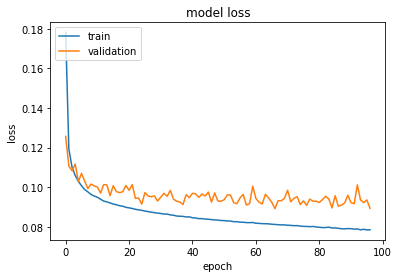

5-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 5)
Model: "functional_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 84, 84, 5)]       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 82, 82, 150)       6900      
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_9 (Dropout)          (None, 82, 82, 150)       0         
__________________________________________________

In [22]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

5
Model: "functional_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 3, 3, 3, 5)]      0         
_________________________________________________________________
conv3d_10 (Conv3D)           (None, 1, 1, 1, 150)      20400     
_________________________________________________________________
conv3d_11 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_12 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_13 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_10 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_14 (Conv3D)           (None, 1, 1, 1, 3)    

2022-04-09 21:29:59.056637: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:29:59.056792: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:29:59.328335: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:29:59.347868: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:29:59.348134: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:29:59.349423: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_29_59
2022-04-09 21:29:59.349986: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_29_59/vw.trace.json.gz
2022-04-09 21:29:59.350056: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:29:59.351110: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

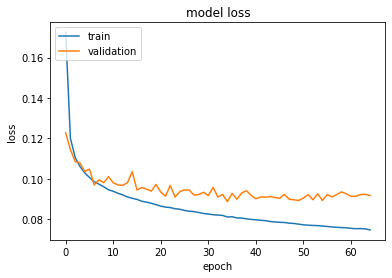

5-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 84, 84, 50, 5)]   0         
_________________________________________________________________
conv3d_15 (Conv3D)           (None, 82, 82, 48, 150)   20400     
_________________________________________________________________
conv3d_16 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_17 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_18 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_11 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________

In [23]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
5input size the ssim score for ndi is: 0.9514435601020321
5input size the ssim score for odi is: 0.8992034920172094
5input size the ssim score for fwf is: 0.9167736324371674
3
conv2d
5input size the ssim score for ndi is: 0.9582107805035278
5input size the ssim score for odi is: 0.9146588910415893
5input size the ssim score for fwf is: 0.9309188389203763
3
conv3d
5input size the ssim score for ndi is: 0.9567921164328164
5input size the ssim score for odi is: 0.9165652365175669
5input size the ssim score for fwf is: 0.9283734984409503


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


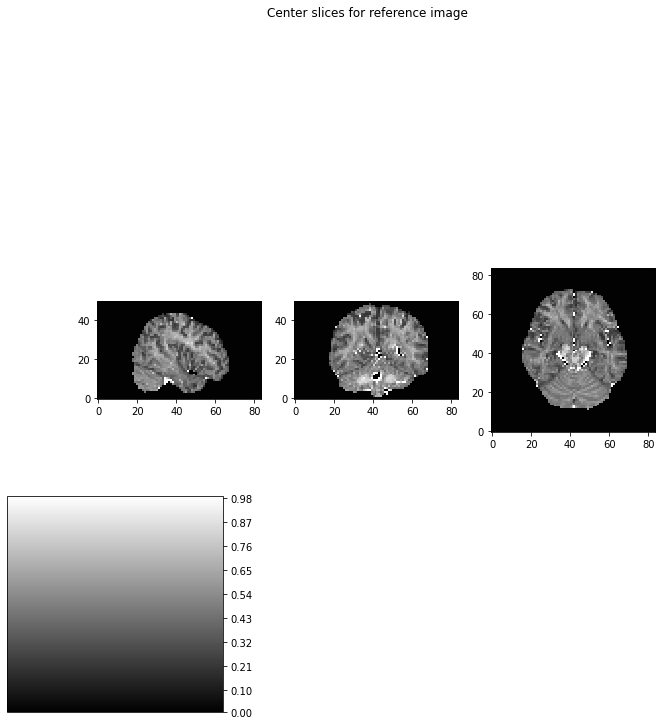

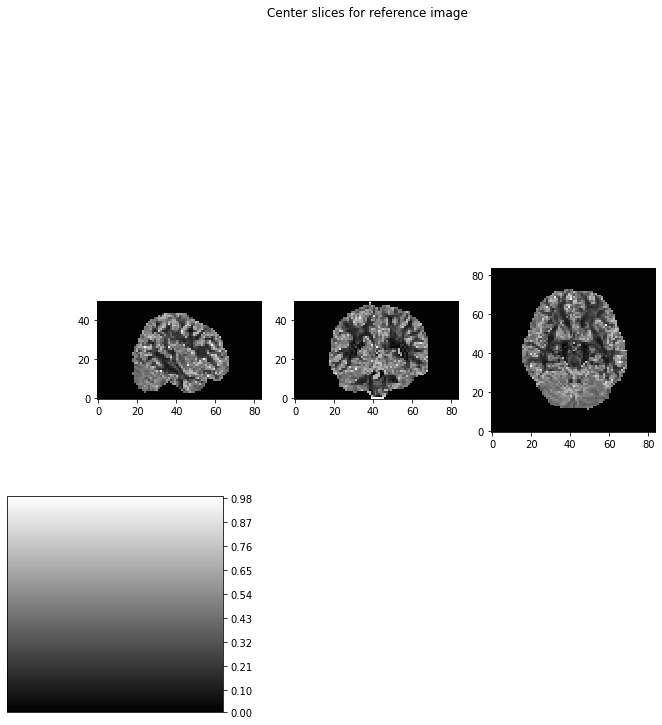

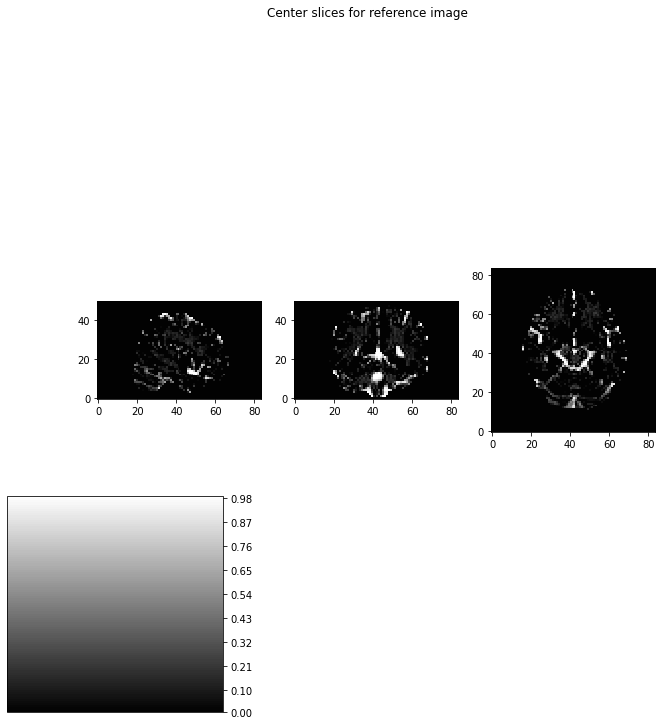

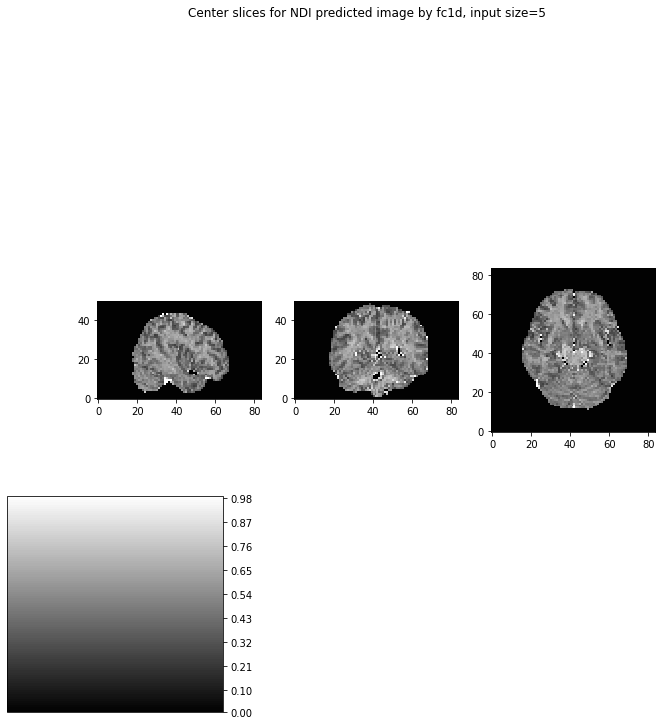

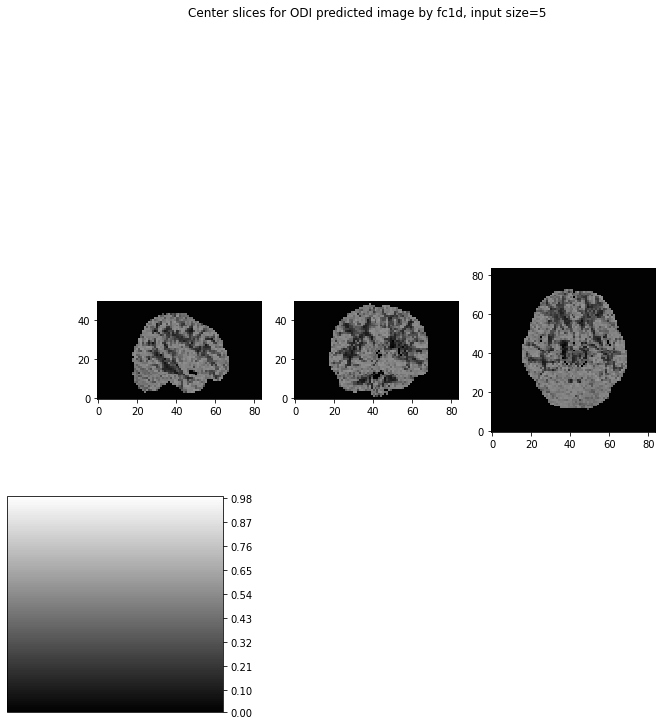

...

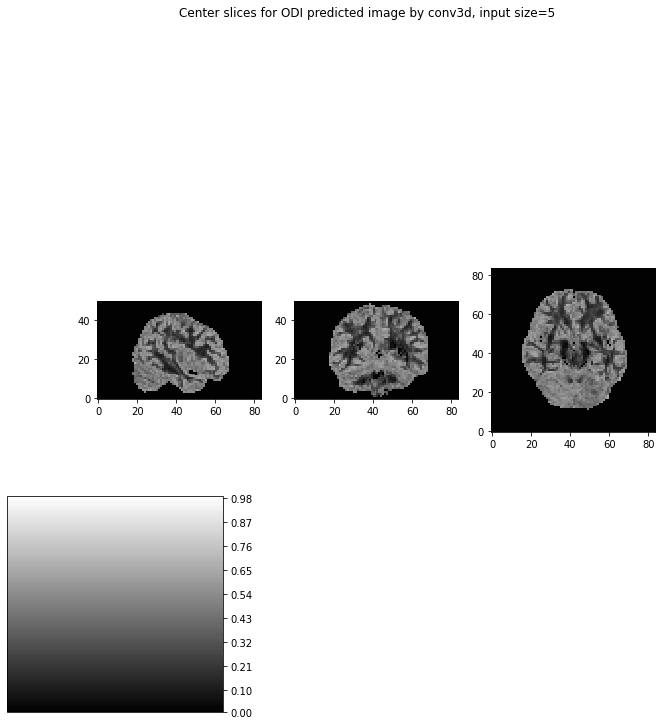

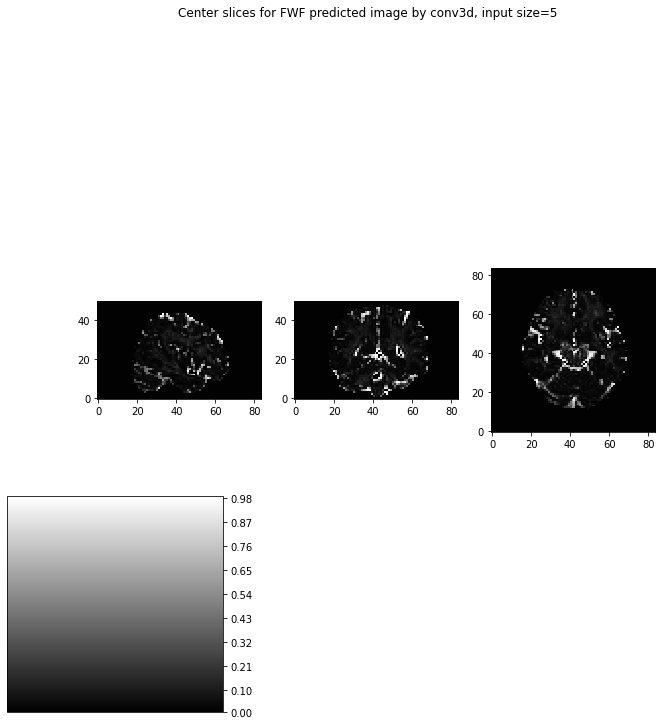

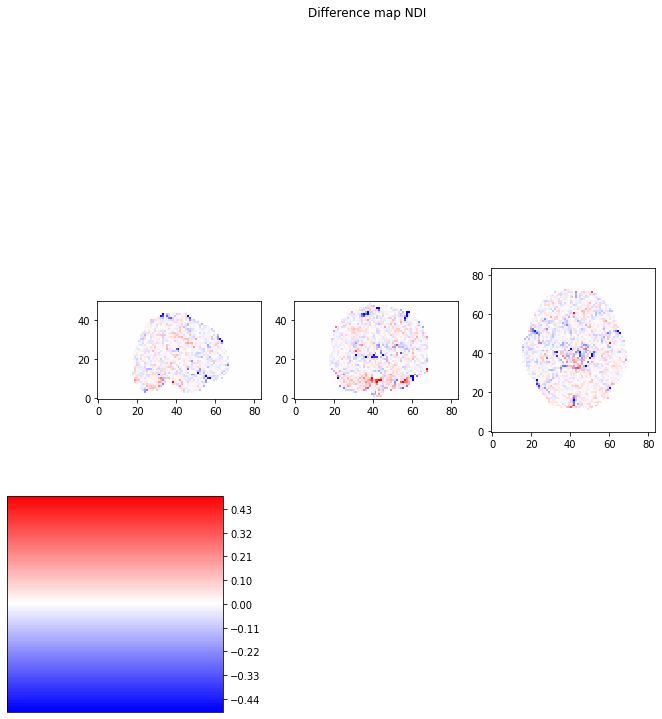

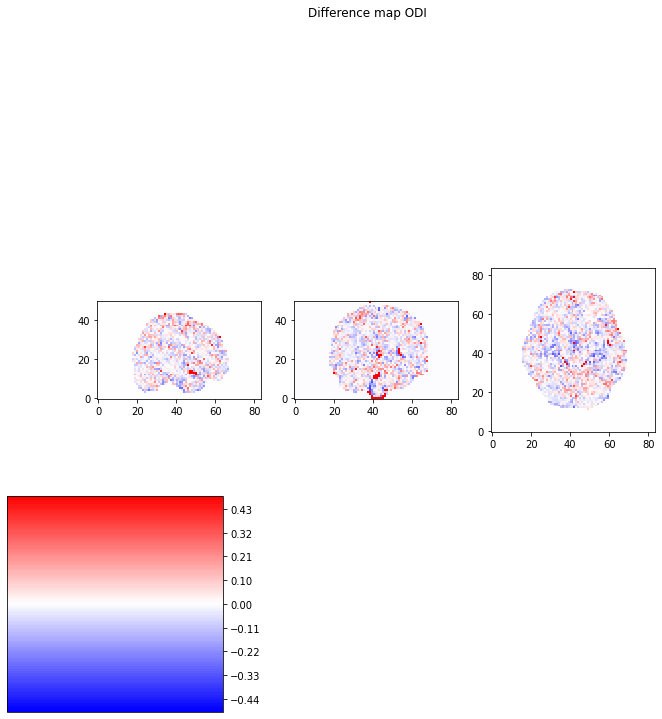

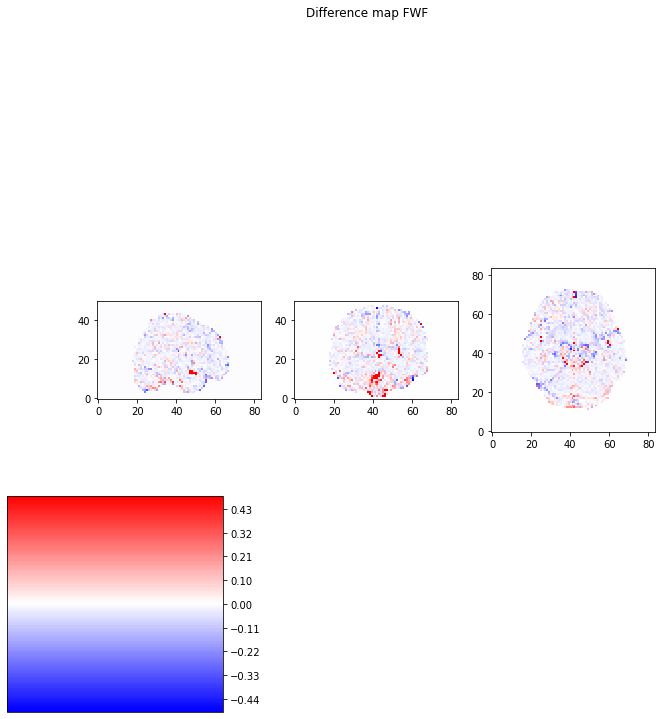

In [24]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 6

In [25]:
dwi = 6

6
Model: "functional_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 6)]               0         
_________________________________________________________________
dense_16 (Dense)             (None, 150)               1050      
_________________________________________________________________
dense_17 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_18 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_19 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_12 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-04-09 21:30:50.772432: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:30:50.772521: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:30:51.009843: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:30:51.028018: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:30:51.028273: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:30:51.029542: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_30_51
2022-04-09 21:30:51.030064: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_30_51/vw.trace.json.gz
2022-04-09 21:30:51.030132: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:30:51.031159: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

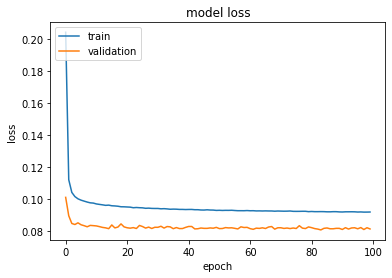

6-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 6)
Model: "functional_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        [(None, 6)]               0         
_________________________________________________________________
dense_20 (Dense)             (None, 150)               1050      
_________________________________________________________________
dense_21 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_22 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_23 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_13 (Dropout)         (None, 150)               0         
____________________________________________________

In [26]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

6
Model: "functional_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_14 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 1, 1, 3)       

2022-04-09 21:31:36.045216: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:31:36.045355: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:31:36.297014: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:31:36.318116: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:31:36.318370: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:31:36.319613: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_31_36
2022-04-09 21:31:36.320120: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_31_36/vw.trace.json.gz
2022-04-09 21:31:36.320193: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:31:36.321152: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

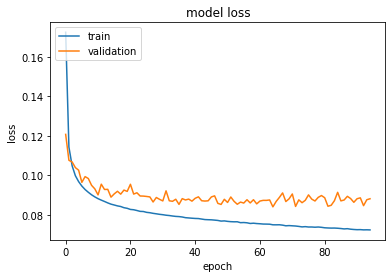

6-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 6)
Model: "functional_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 84, 84, 6)]       0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 82, 82, 150)       8250      
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_15 (Dropout)         (None, 82, 82, 150)       0         
__________________________________________________

In [27]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

6
Model: "functional_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d_20 (Conv3D)           (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_21 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_22 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_23 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_16 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_24 (Conv3D)           (None, 1, 1, 1, 3)    

2022-04-09 21:32:48.816395: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:32:48.816551: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:32:49.102639: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:32:49.122006: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:32:49.122286: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:32:49.123622: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_32_49
2022-04-09 21:32:49.124203: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_32_49/vw.trace.json.gz
2022-04-09 21:32:49.124278: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:32:49.125362: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

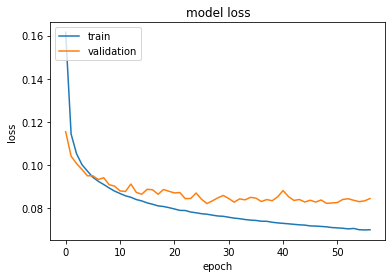

6-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 84, 84, 50, 6)]   0         
_________________________________________________________________
conv3d_25 (Conv3D)           (None, 82, 82, 48, 150)   24450     
_________________________________________________________________
conv3d_26 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_27 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_28 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_17 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________

In [28]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
6input size the ssim score for ndi is: 0.9551935766539728
6input size the ssim score for odi is: 0.9126612084724129
6input size the ssim score for fwf is: 0.9259467922373277
3
conv2d
6input size the ssim score for ndi is: 0.9593180971214521
6input size the ssim score for odi is: 0.9226424826854719
6input size the ssim score for fwf is: 0.9352377620564059
3
conv3d
6input size the ssim score for ndi is: 0.9614062351600304
6input size the ssim score for odi is: 0.9240888223277912
6input size the ssim score for fwf is: 0.9376996063203793


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


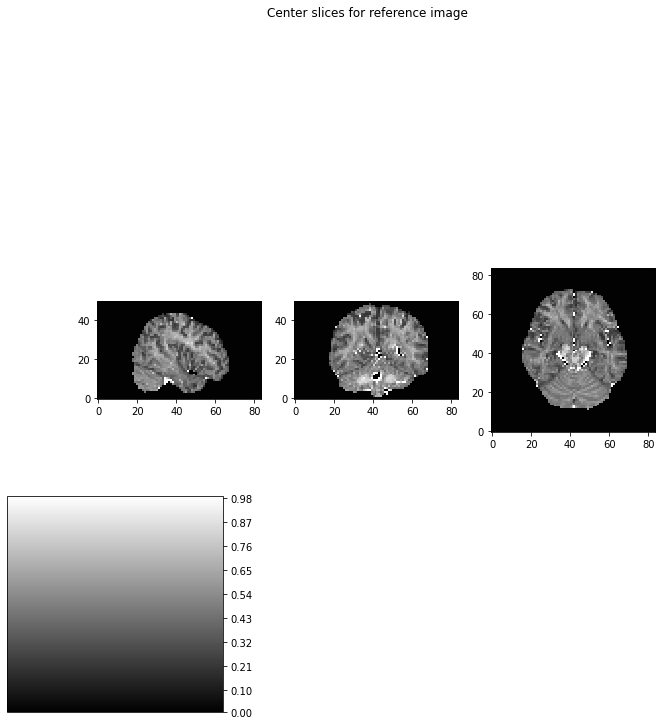

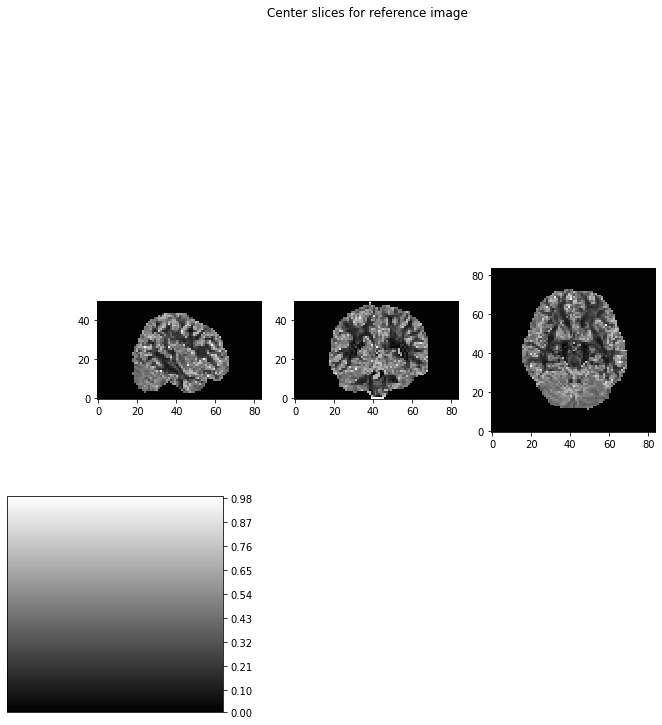

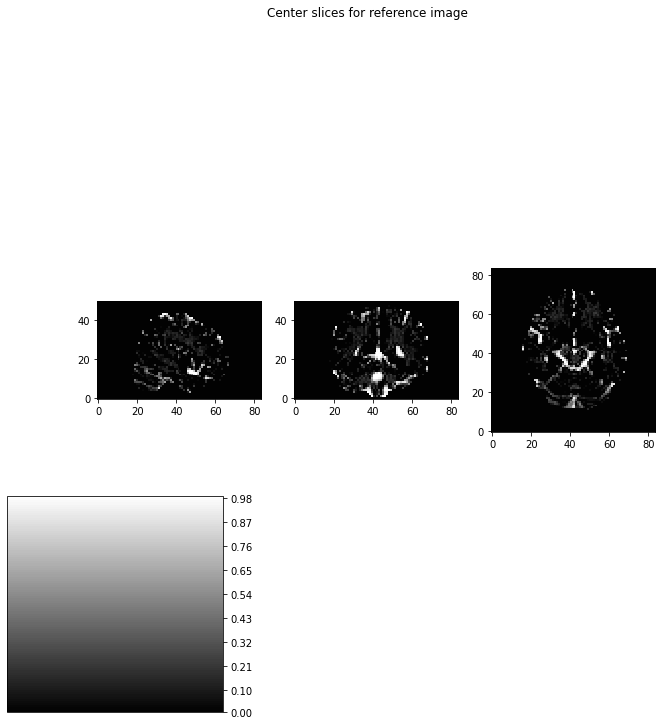

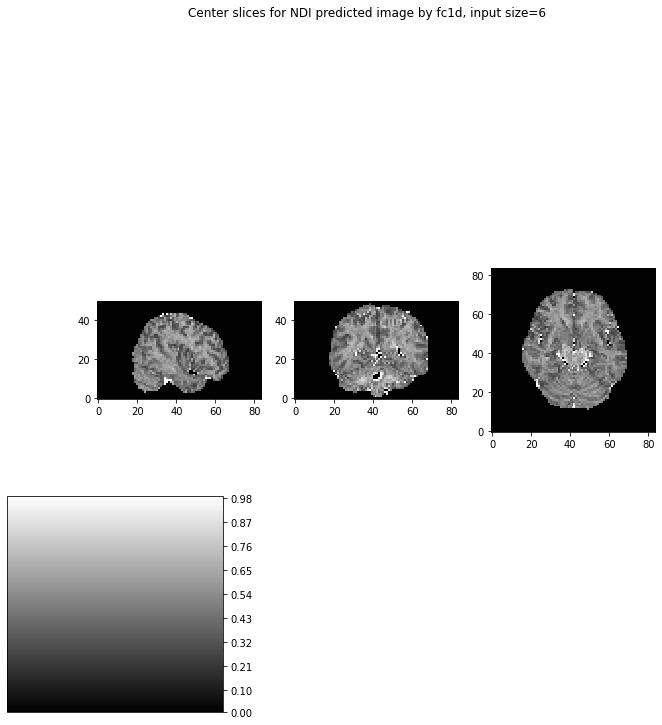

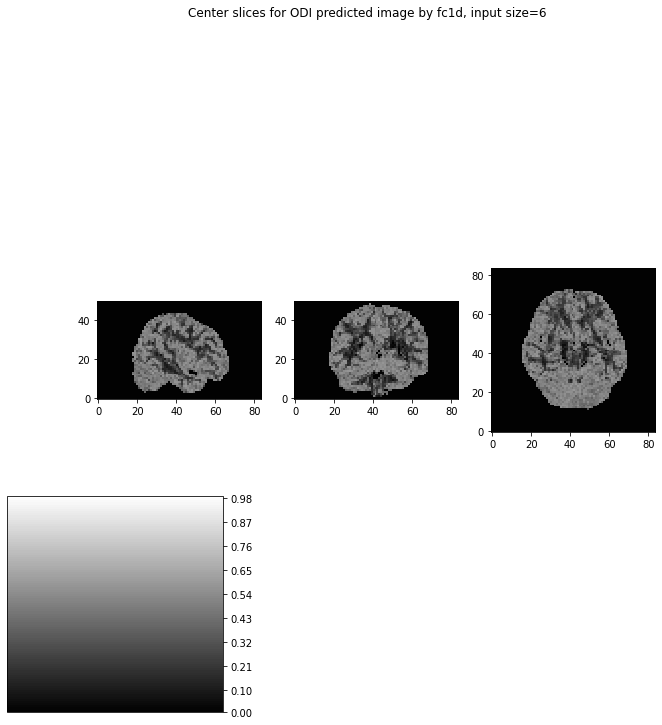

...

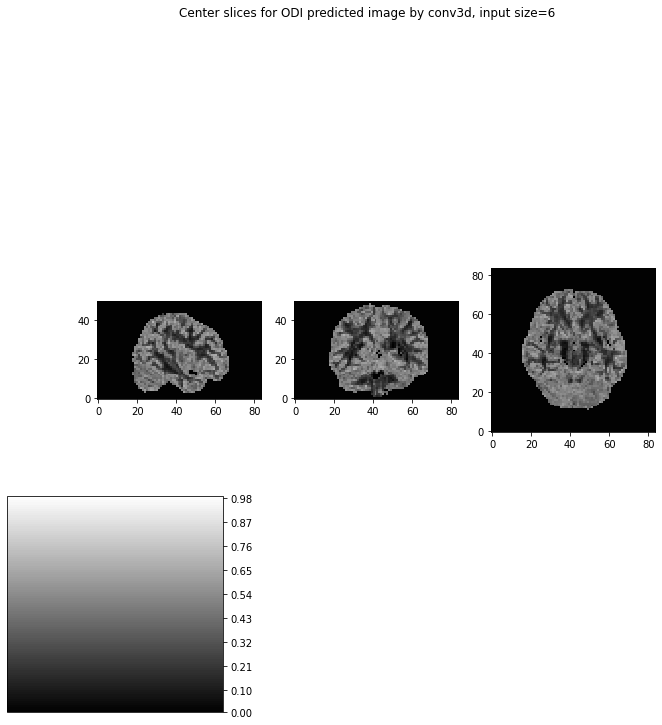

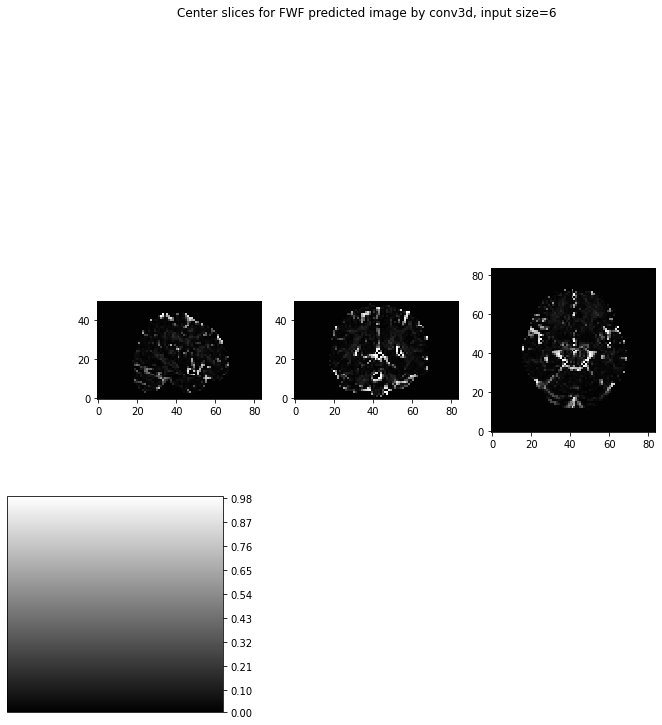

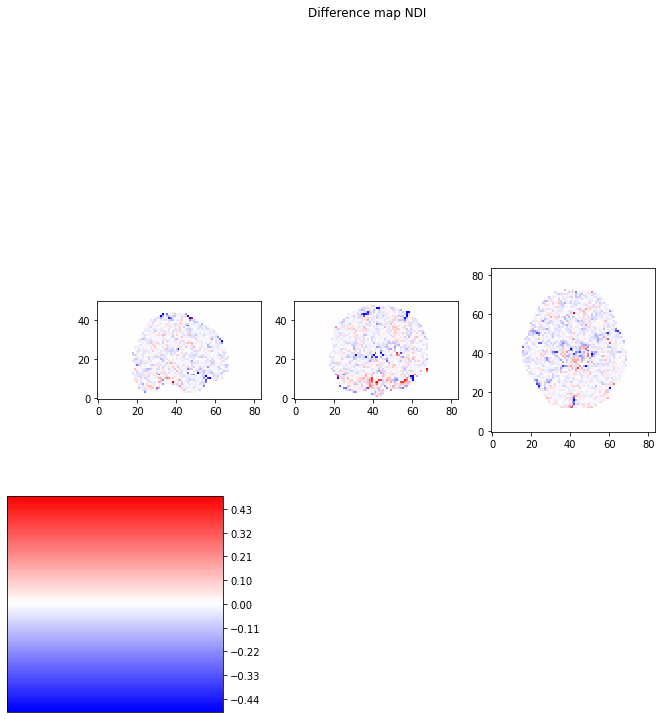

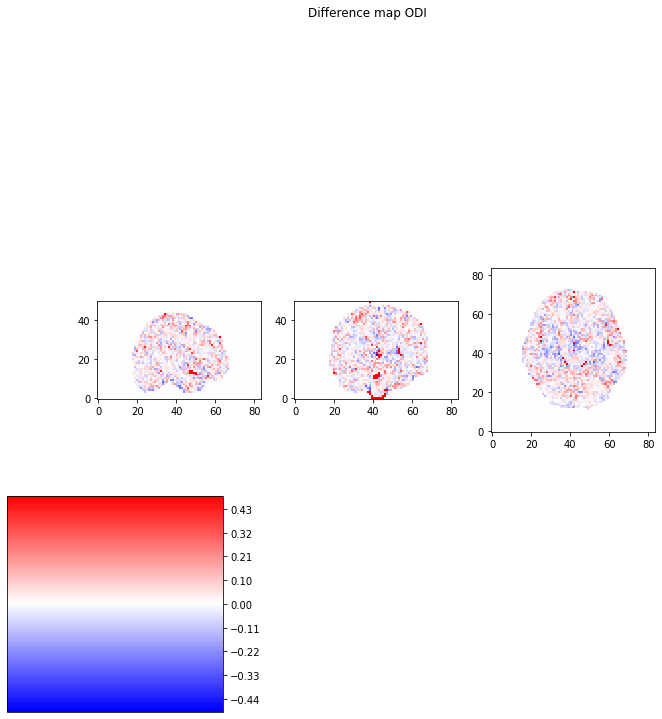

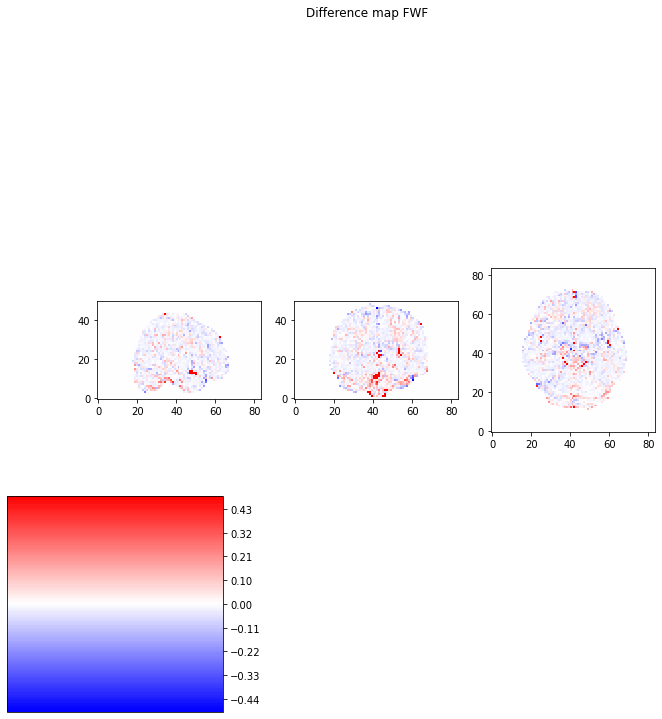

In [29]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 7

In [30]:
dwi = 7

7
Model: "functional_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 7)]               0         
_________________________________________________________________
dense_24 (Dense)             (None, 150)               1200      
_________________________________________________________________
dense_25 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_26 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_27 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_18 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-04-09 21:33:35.090351: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:33:35.090514: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:33:35.342117: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:33:35.359740: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:33:35.359977: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:33:35.361193: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_33_35
2022-04-09 21:33:35.361692: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_33_35/vw.trace.json.gz
2022-04-09 21:33:35.361766: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:33:35.362766: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

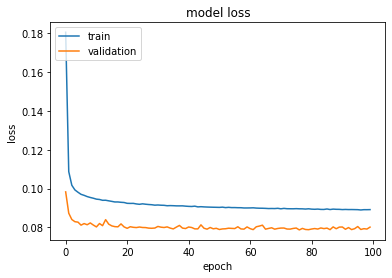

7-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 7)
Model: "functional_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_20 (InputLayer)        [(None, 7)]               0         
_________________________________________________________________
dense_28 (Dense)             (None, 150)               1200      
_________________________________________________________________
dense_29 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_30 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_31 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_19 (Dropout)         (None, 150)               0         
____________________________________________________

In [31]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

7
Model: "functional_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_21 (InputLayer)        [(None, 3, 3, 7)]         0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 1, 1, 150)         9600      
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_20 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 1, 1, 3)       

2022-04-09 21:34:20.541071: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:34:20.541207: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:34:20.818703: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:34:20.840927: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:34:20.841193: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:34:20.842518: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_34_20
2022-04-09 21:34:20.843065: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_34_20/vw.trace.json.gz
2022-04-09 21:34:20.843140: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:34:20.844199: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

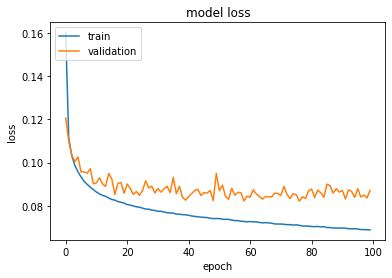

7-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 7)
Model: "functional_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_22 (InputLayer)        [(None, 84, 84, 7)]       0         
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 82, 82, 150)       9600      
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_21 (Dropout)         (None, 82, 82, 150)       0         
__________________________________________________

In [32]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

7
Model: "functional_67"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 3, 3, 3, 7)]      0         
_________________________________________________________________
conv3d_30 (Conv3D)           (None, 1, 1, 1, 150)      28500     
_________________________________________________________________
conv3d_31 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_32 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_33 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_22 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_34 (Conv3D)           (None, 1, 1, 1, 3)    

2022-04-09 21:35:37.668203: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:35:37.668352: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:35:37.955049: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:35:37.973971: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:35:37.974256: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:35:37.975551: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_35_37
2022-04-09 21:35:37.976084: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_35_37/vw.trace.json.gz
2022-04-09 21:35:37.976156: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:35:37.977171: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

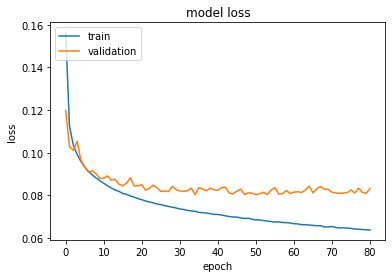

7-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_71"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_24 (InputLayer)        [(None, 84, 84, 50, 7)]   0         
_________________________________________________________________
conv3d_35 (Conv3D)           (None, 82, 82, 48, 150)   28500     
_________________________________________________________________
conv3d_36 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_37 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_38 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_23 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________

In [33]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
7input size the ssim score for ndi is: 0.9564842465049864
7input size the ssim score for odi is: 0.9189726029245625
7input size the ssim score for fwf is: 0.9223098354053997
3
conv2d
7input size the ssim score for ndi is: 0.9578767807726145
7input size the ssim score for odi is: 0.9287765809764241
7input size the ssim score for fwf is: 0.9357480570682907
3
conv3d
7input size the ssim score for ndi is: 0.9602018558008771
7input size the ssim score for odi is: 0.9293462151934989
7input size the ssim score for fwf is: 0.9345866796869314


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


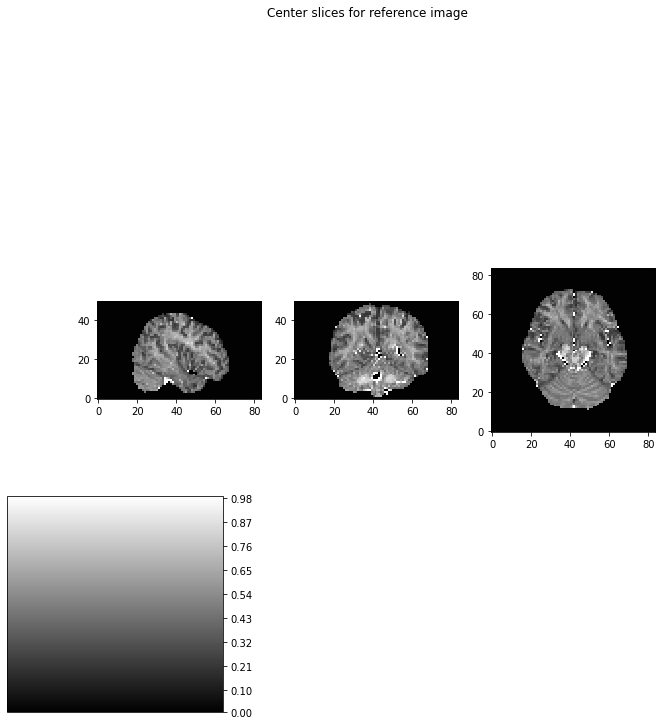

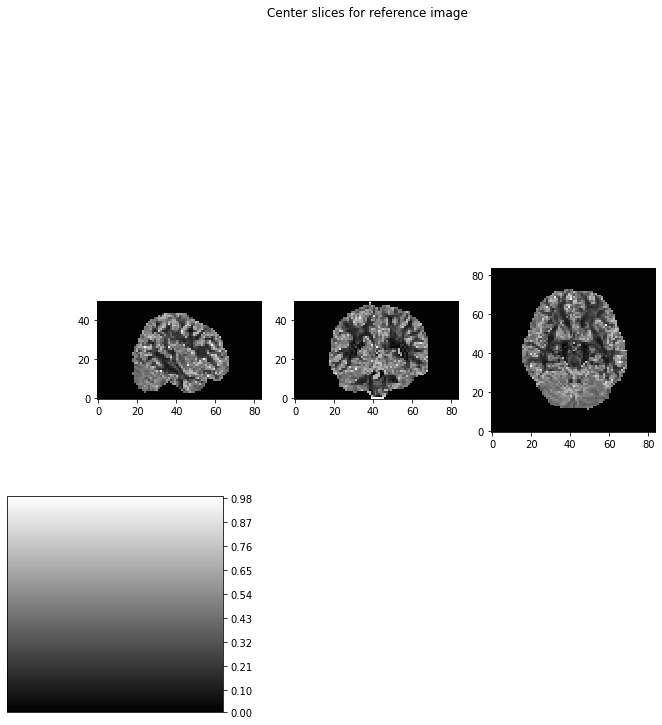

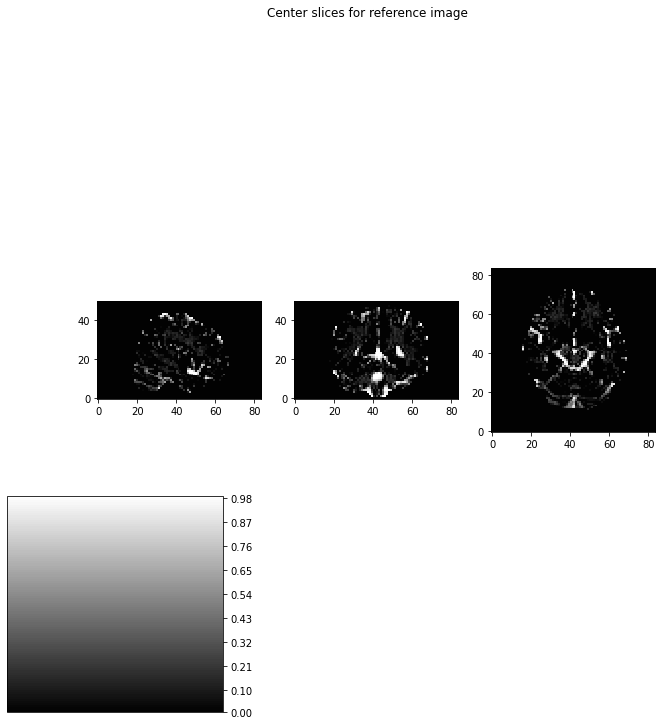

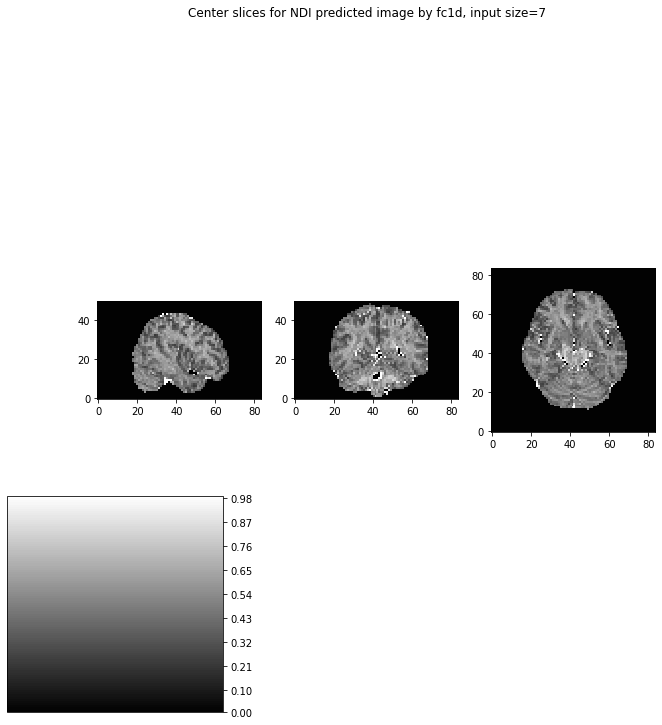

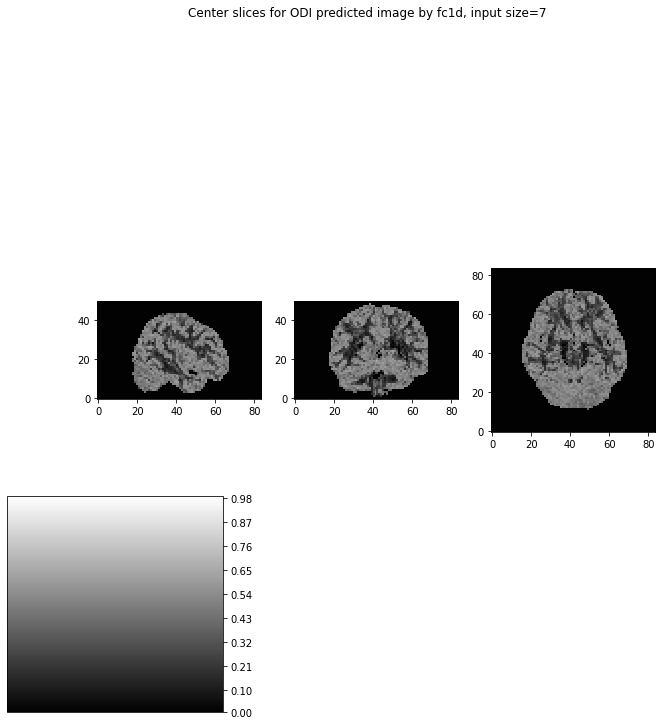

...

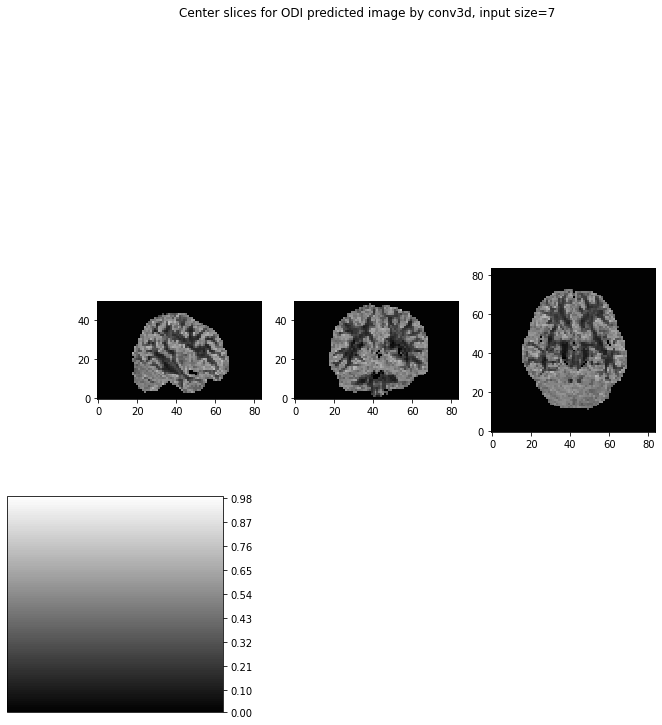

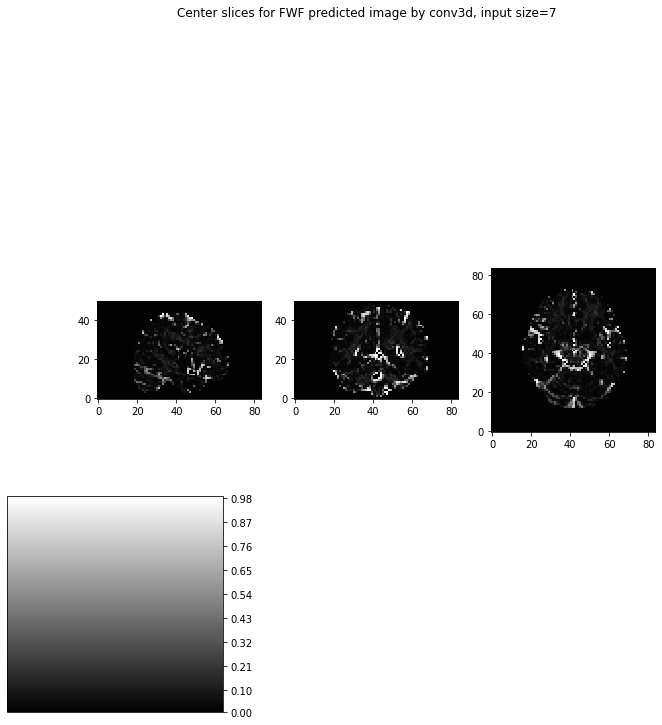

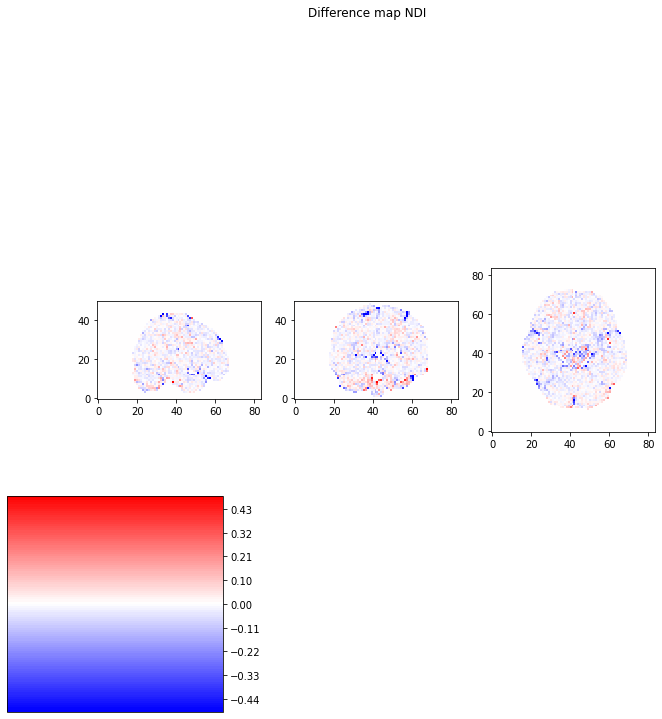

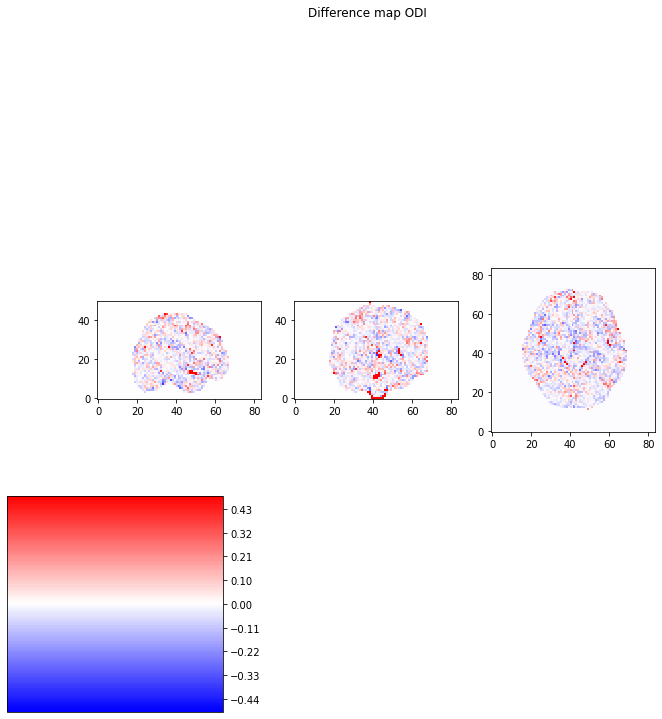

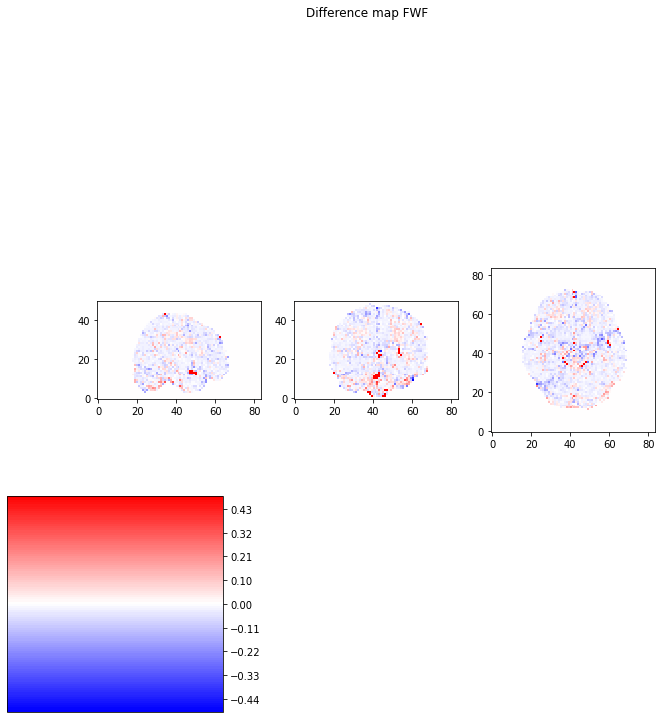

In [34]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 8

In [35]:
dwi = 8

8
Model: "functional_73"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 8)]               0         
_________________________________________________________________
dense_32 (Dense)             (None, 150)               1350      
_________________________________________________________________
dense_33 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_34 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_35 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_24 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-04-09 21:36:40.306209: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:36:40.306294: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:36:40.576125: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:36:40.596762: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:36:40.597024: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:36:40.598360: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_36_40
2022-04-09 21:36:40.598921: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_36_40/vw.trace.json.gz
2022-04-09 21:36:40.598994: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:36:40.600076: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

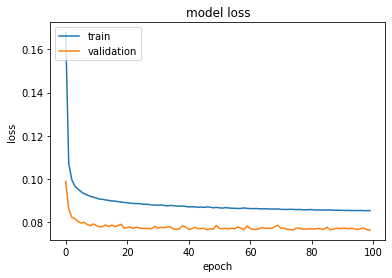

8-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 8)
Model: "functional_77"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_26 (InputLayer)        [(None, 8)]               0         
_________________________________________________________________
dense_36 (Dense)             (None, 150)               1350      
_________________________________________________________________
dense_37 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_38 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_39 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_25 (Dropout)         (None, 150)               0         
____________________________________________________

In [36]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

8
Model: "functional_79"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        [(None, 3, 3, 8)]         0         
_________________________________________________________________
conv2d_40 (Conv2D)           (None, 1, 1, 150)         10950     
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_26 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 1, 1, 3)       

2022-04-09 21:37:26.586888: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:37:26.586960: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:37:26.859098: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:37:26.881840: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:37:26.882103: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:37:26.883424: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_37_26
2022-04-09 21:37:26.883983: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_37_26/vw.trace.json.gz
2022-04-09 21:37:26.884062: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:37:26.885107: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

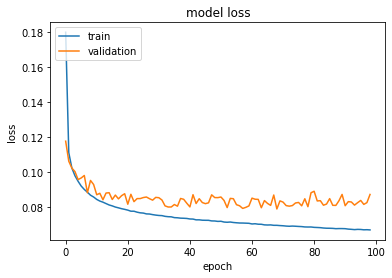

8-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 8)
Model: "functional_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_28 (InputLayer)        [(None, 84, 84, 8)]       0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 82, 82, 150)       10950     
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_27 (Dropout)         (None, 82, 82, 150)       0         
__________________________________________________

In [37]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

8
Model: "functional_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_29 (InputLayer)        [(None, 3, 3, 3, 8)]      0         
_________________________________________________________________
conv3d_40 (Conv3D)           (None, 1, 1, 1, 150)      32550     
_________________________________________________________________
conv3d_41 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_42 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_43 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_28 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_44 (Conv3D)           (None, 1, 1, 1, 3)    

2022-04-09 21:38:42.991969: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:38:42.992054: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:38:43.298425: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:38:43.317637: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:38:43.317920: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:38:43.319279: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_38_43
2022-04-09 21:38:43.319848: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_38_43/vw.trace.json.gz
2022-04-09 21:38:43.319920: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:38:43.321002: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

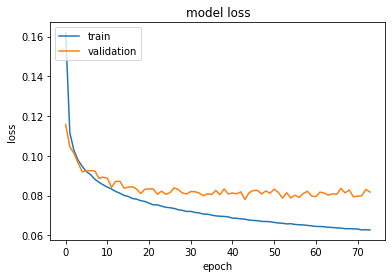

8-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_30 (InputLayer)        [(None, 84, 84, 50, 8)]   0         
_________________________________________________________________
conv3d_45 (Conv3D)           (None, 82, 82, 48, 150)   32550     
_________________________________________________________________
conv3d_46 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_47 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_48 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_29 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________

In [38]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
8input size the ssim score for ndi is: 0.9596547084889827
8input size the ssim score for odi is: 0.9242668789952314
8input size the ssim score for fwf is: 0.9285753045549727
3
conv2d
8input size the ssim score for ndi is: 0.9566537584722977
8input size the ssim score for odi is: 0.9324112139239229
8input size the ssim score for fwf is: 0.9285335484172723
3
conv3d
8input size the ssim score for ndi is: 0.962473900329187
8input size the ssim score for odi is: 0.9309886127153726
8input size the ssim score for fwf is: 0.939790895816722


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


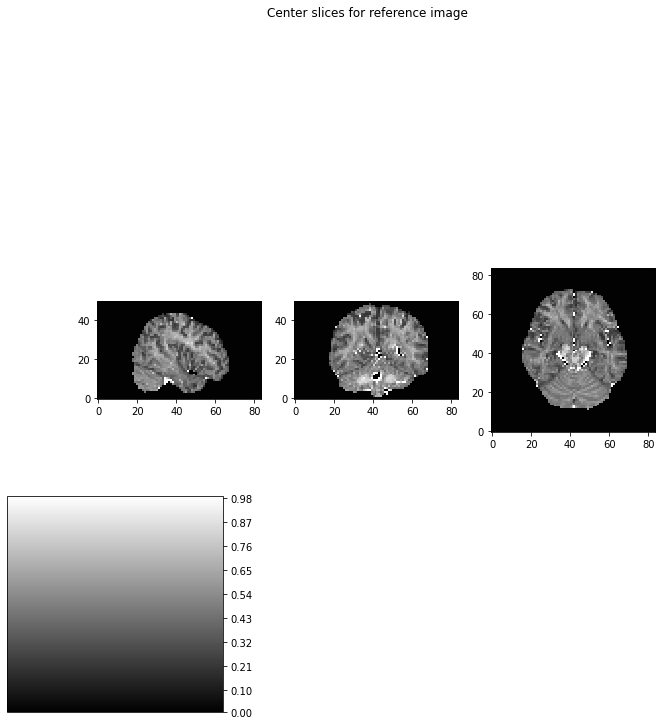

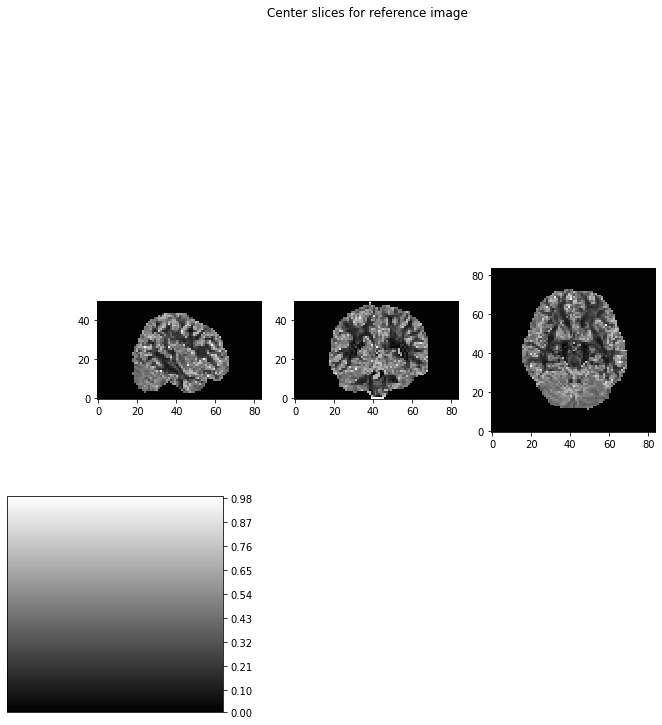

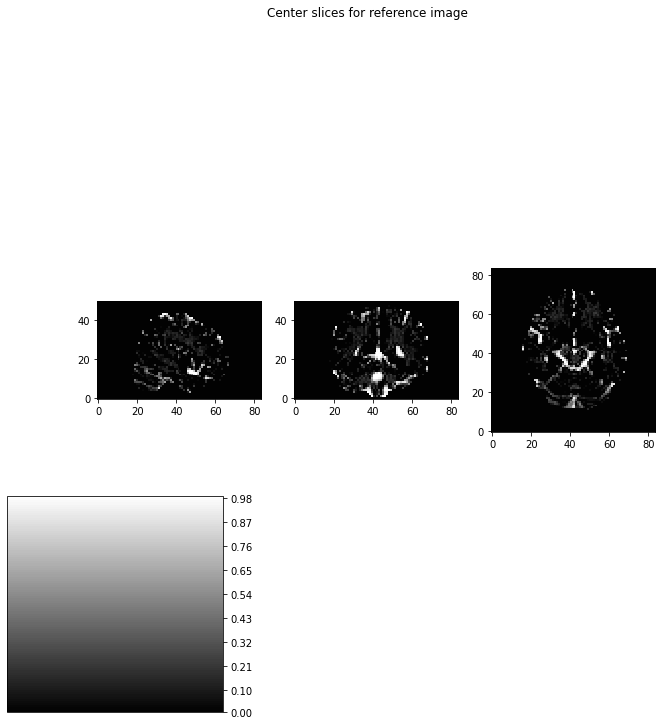

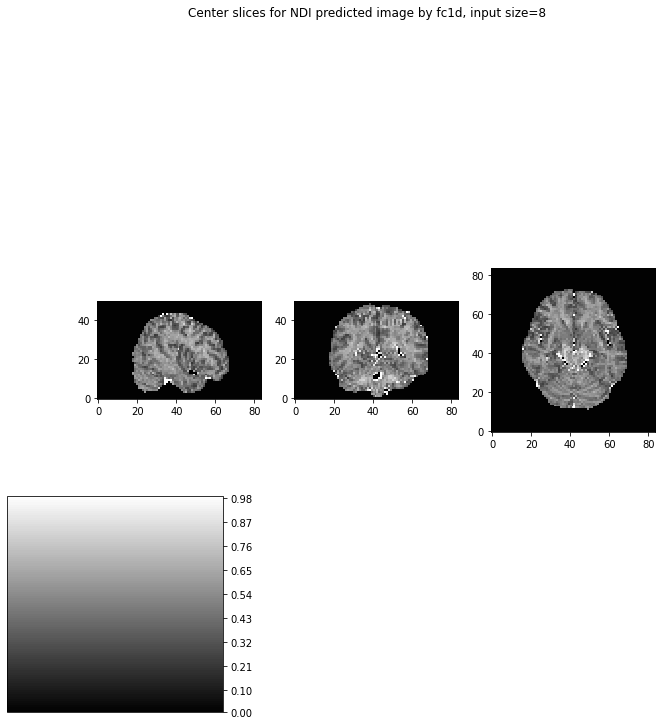

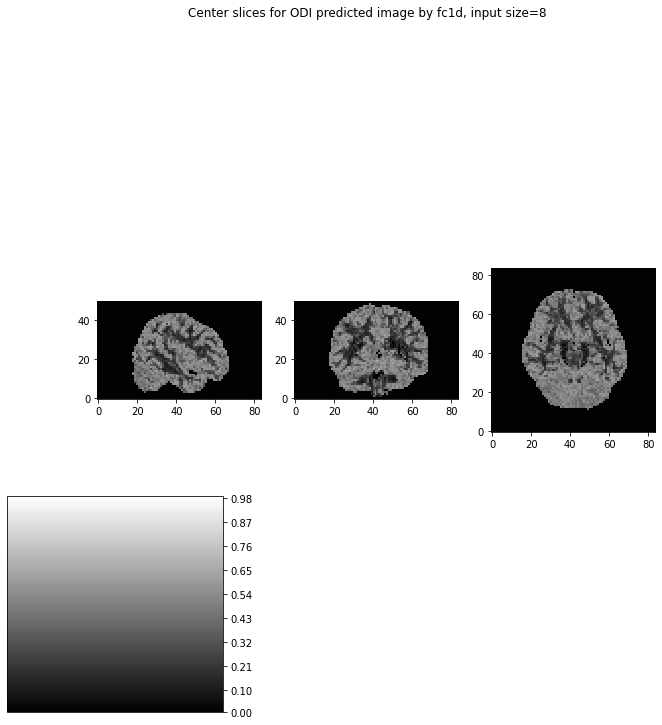

...

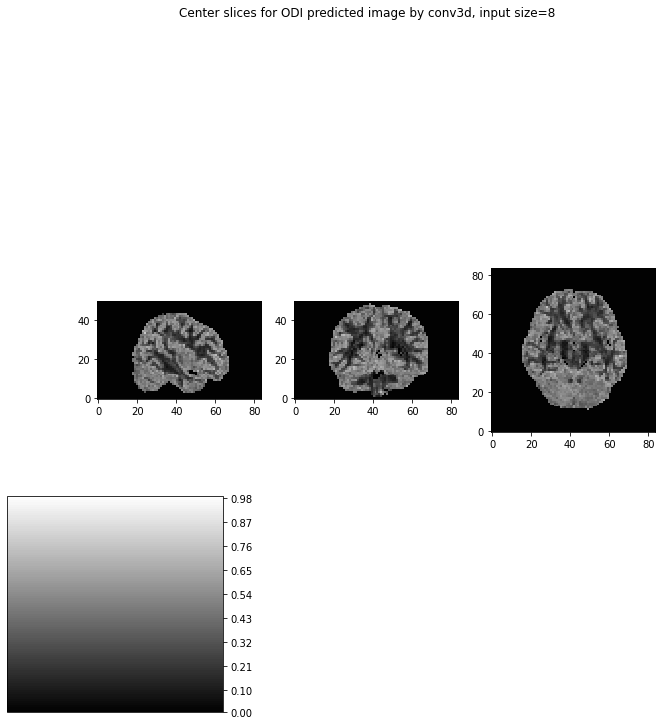

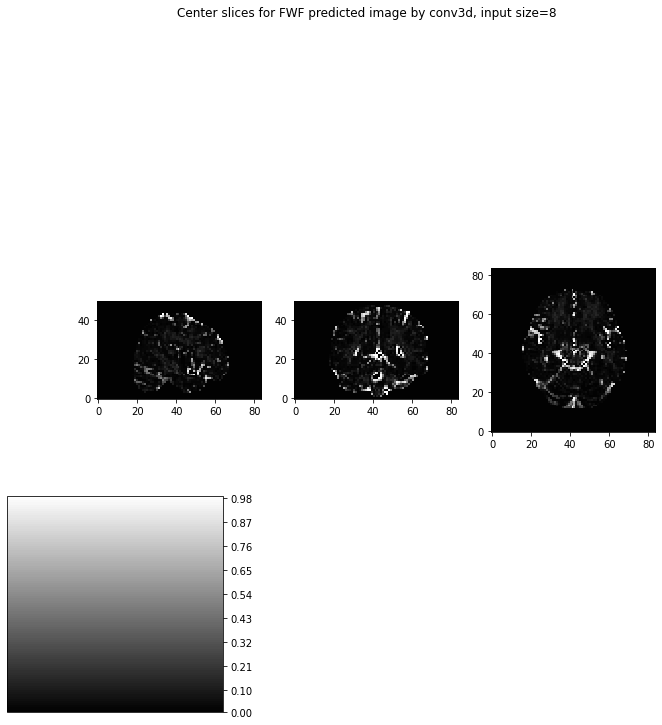

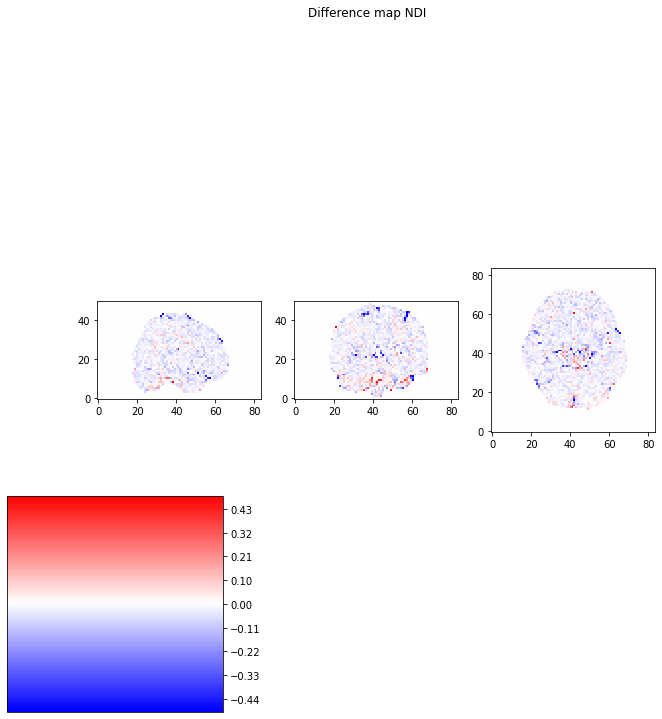

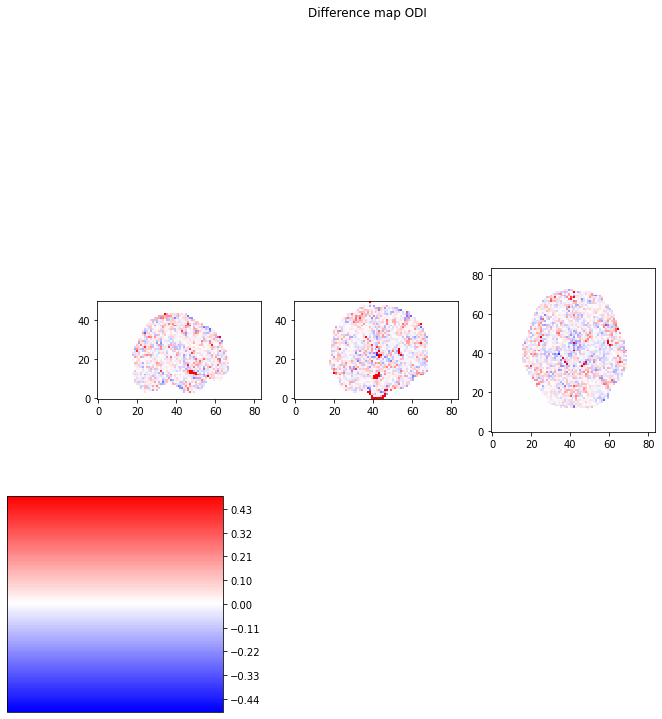

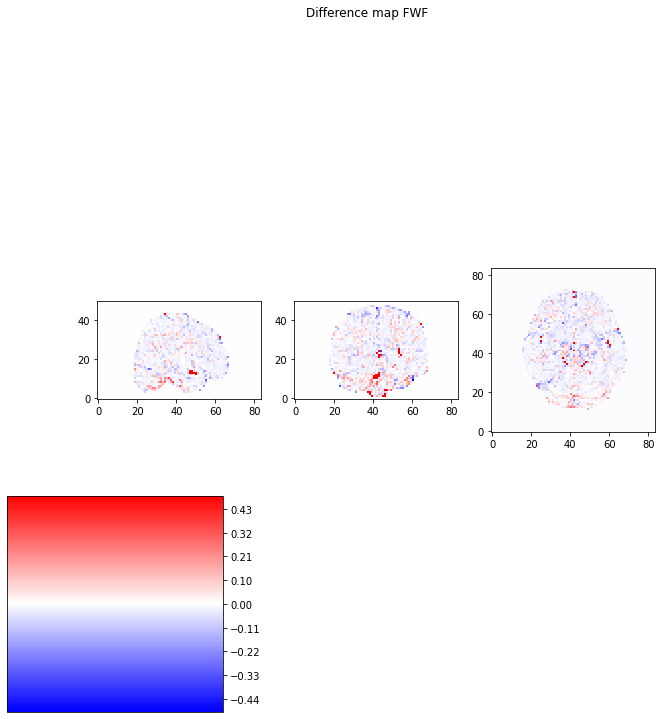

In [39]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 10

In [40]:
dwi = 10

10
Model: "functional_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 10)]              0         
_________________________________________________________________
dense_40 (Dense)             (None, 150)               1650      
_________________________________________________________________
dense_41 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_42 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_43 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_30 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)            

2022-04-09 21:39:40.941147: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:39:40.941297: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:39:41.210484: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:39:41.230420: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:39:41.230672: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:39:41.231994: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_39_41
2022-04-09 21:39:41.232531: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_39_41/vw.trace.json.gz
2022-04-09 21:39:41.232602: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:39:41.233585: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

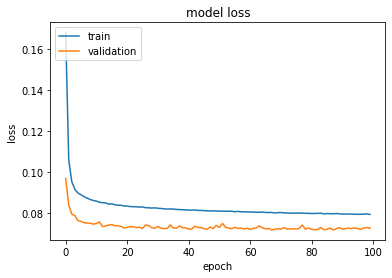

10-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 10)
Model: "functional_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_32 (InputLayer)        [(None, 10)]              0         
_________________________________________________________________
dense_44 (Dense)             (None, 150)               1650      
_________________________________________________________________
dense_45 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_46 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_47 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_31 (Dropout)         (None, 150)               0         
__________________________________________________

In [41]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

10
Model: "functional_97"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_33 (InputLayer)        [(None, 3, 3, 10)]        0         
_________________________________________________________________
conv2d_50 (Conv2D)           (None, 1, 1, 150)         13650     
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_32 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 1, 1, 3)      

2022-04-09 21:40:26.688159: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:40:26.688285: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:40:27.209633: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:40:27.235898: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:40:27.236176: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:40:27.237513: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_40_27
2022-04-09 21:40:27.238065: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_40_27/vw.trace.json.gz
2022-04-09 21:40:27.238148: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:40:27.239185: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

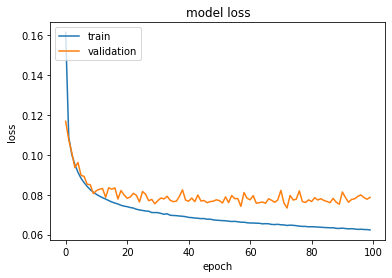

10-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 10)
Model: "functional_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        [(None, 84, 84, 10)]      0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 82, 82, 150)       13650     
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_57 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_58 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_33 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [42]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

10
Model: "functional_103"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 3, 3, 3, 10)]     0         
_________________________________________________________________
conv3d_50 (Conv3D)           (None, 1, 1, 1, 150)      40650     
_________________________________________________________________
conv3d_51 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_52 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_53 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_34 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_54 (Conv3D)           (None, 1, 1, 1, 3)  

2022-04-09 21:41:45.833022: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:41:45.833150: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:41:46.171742: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:41:46.192246: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:41:46.192528: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:41:46.193965: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_41_46
2022-04-09 21:41:46.194542: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_41_46/vw.trace.json.gz
2022-04-09 21:41:46.194623: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:41:46.195734: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

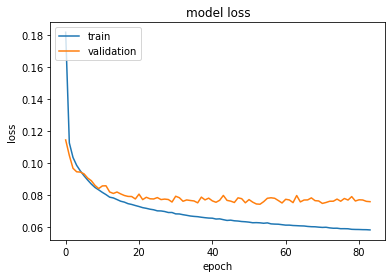

10-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_107"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_36 (InputLayer)        [(None, 84, 84, 50, 10)]  0         
_________________________________________________________________
conv3d_55 (Conv3D)           (None, 82, 82, 48, 150)   40650     
_________________________________________________________________
conv3d_56 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_57 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_58 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_35 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________

In [43]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
10input size the ssim score for ndi is: 0.9623154772509837
10input size the ssim score for odi is: 0.9293668072556214
10input size the ssim score for fwf is: 0.9324002839373369
3
conv2d
10input size the ssim score for ndi is: 0.9633760553485436
10input size the ssim score for odi is: 0.9359036160134584
10input size the ssim score for fwf is: 0.9407857033368303
3
conv3d
10input size the ssim score for ndi is: 0.9669254365487464
10input size the ssim score for odi is: 0.9363331158800661
10input size the ssim score for fwf is: 0.9403152807352879


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


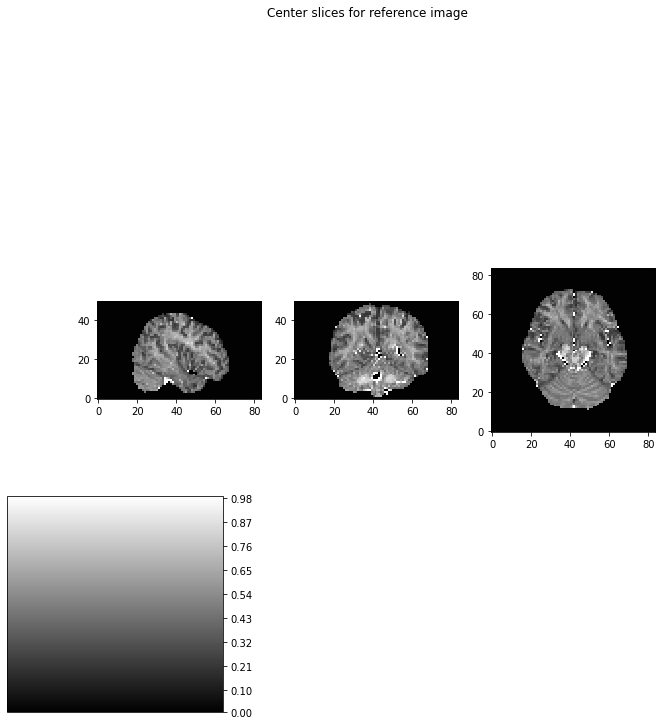

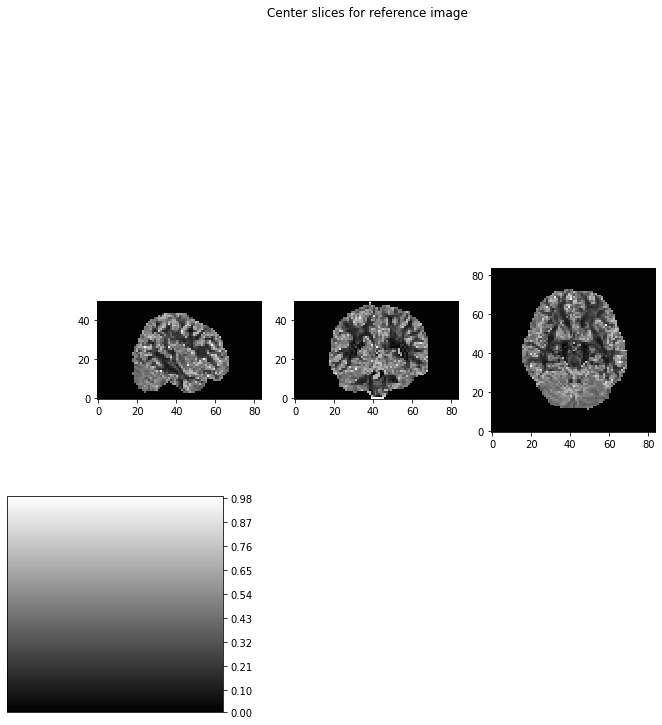

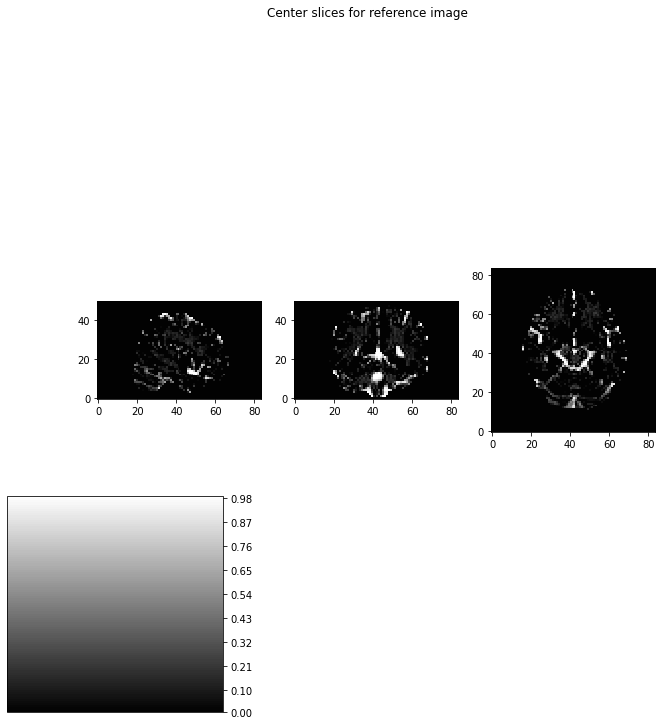

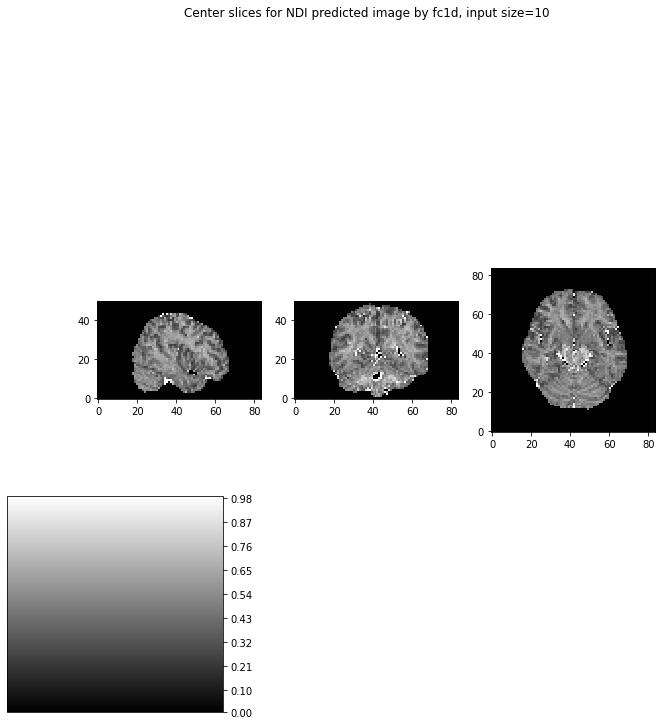

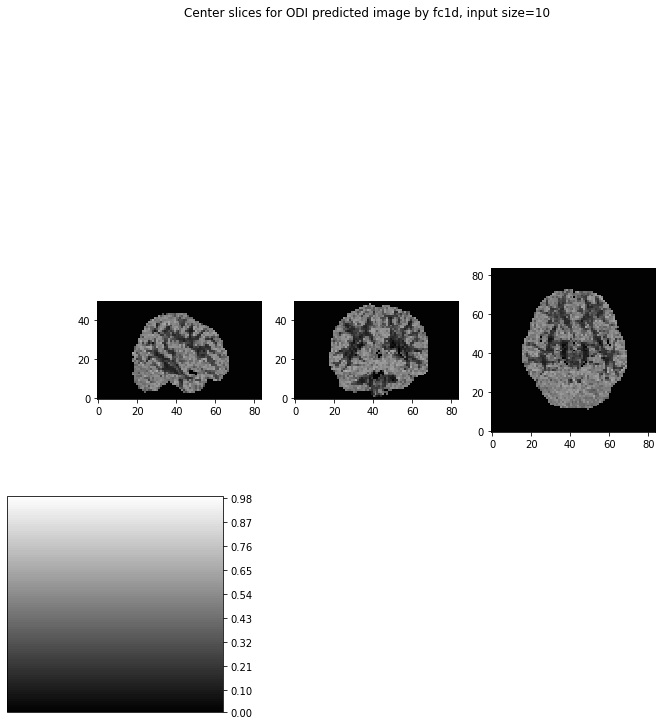

...

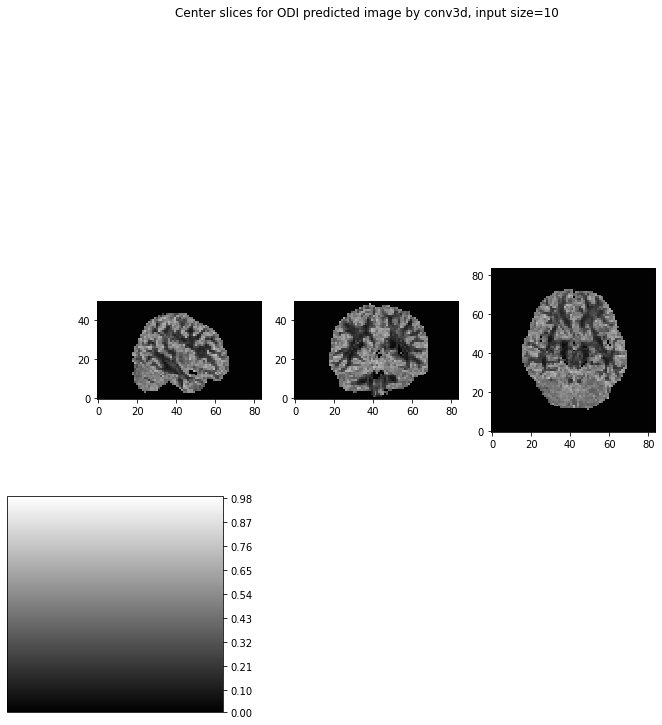

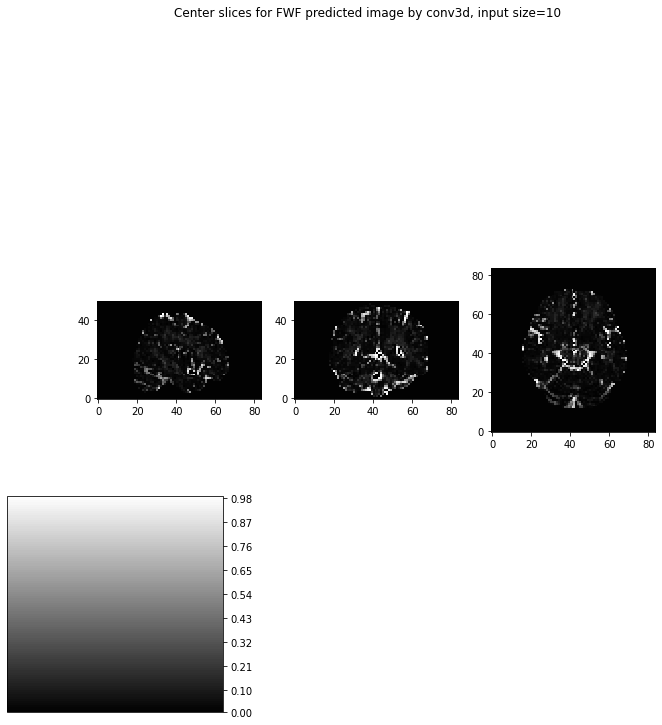

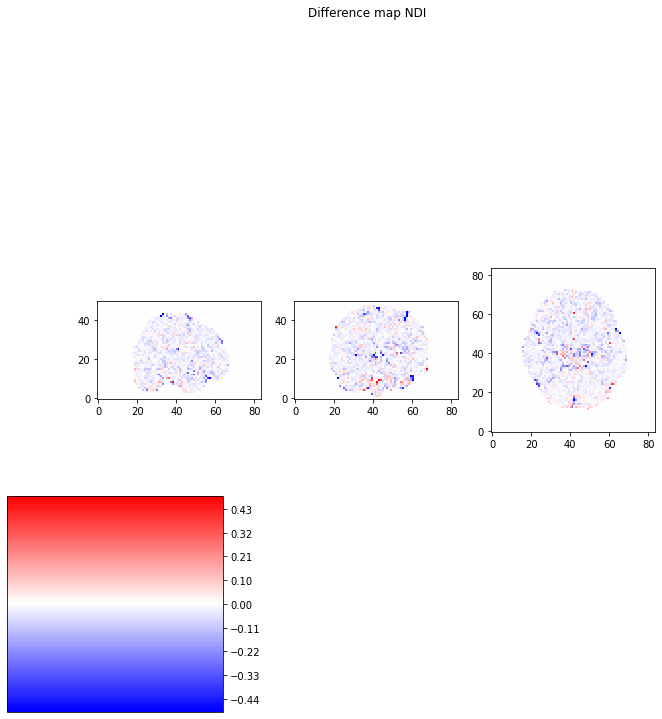

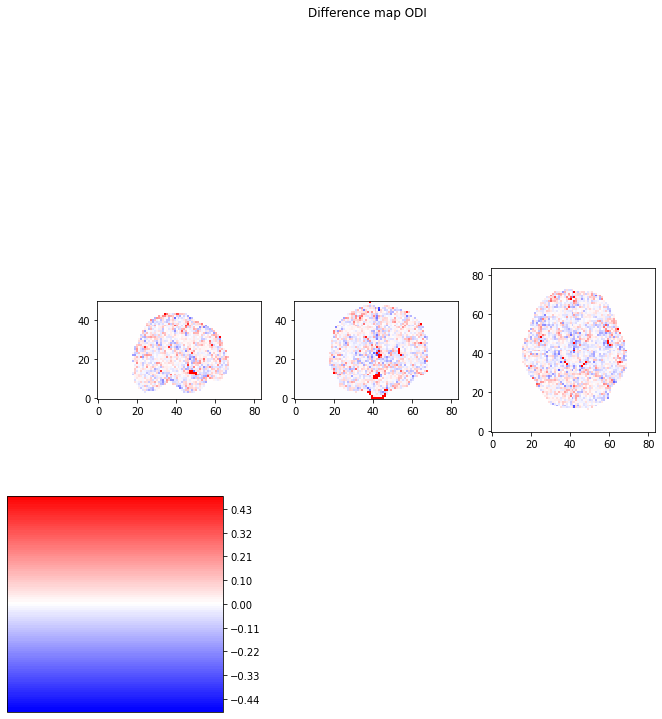

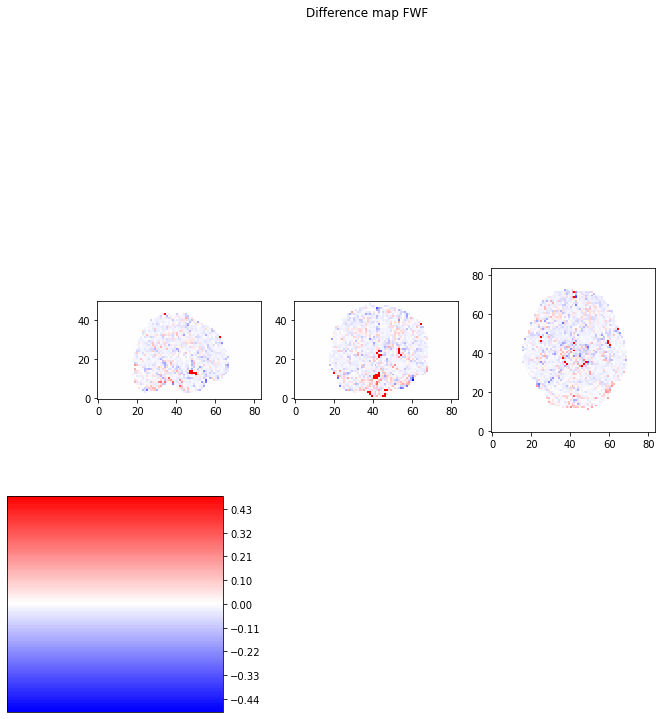

In [44]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 12

In [15]:
dwi = 12

12
Model: "functional_109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_37 (InputLayer)        [(None, 12)]              0         
_________________________________________________________________
dense_48 (Dense)             (None, 150)               1950      
_________________________________________________________________
dense_49 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_50 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_51 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_36 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 21:42:53.609107: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:42:53.609208: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:42:53.907302: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:42:53.928331: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:42:53.928609: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:42:53.929908: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_42_53
2022-04-09 21:42:53.930446: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_42_53/vw.trace.json.gz
2022-04-09 21:42:53.930516: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:42:53.931534: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

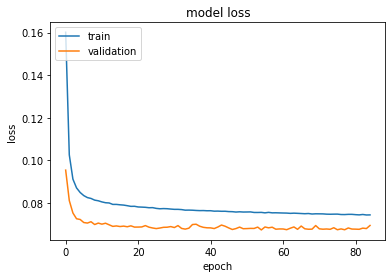

12-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 12)
Model: "functional_113"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_38 (InputLayer)        [(None, 12)]              0         
_________________________________________________________________
dense_52 (Dense)             (None, 150)               1950      
_________________________________________________________________
dense_53 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_54 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_55 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_37 (Dropout)         (None, 150)               0         
_________________________________________________

In [46]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

12
Model: "functional_115"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_39 (InputLayer)        [(None, 3, 3, 12)]        0         
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 1, 1, 150)         16350     
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_38 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_64 (Conv2D)           (None, 1, 1, 3)     

2022-04-09 21:43:36.197558: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:43:36.197680: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:43:36.505734: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:43:36.528350: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:43:36.528612: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:43:36.529912: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_43_36
2022-04-09 21:43:36.530453: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_43_36/vw.trace.json.gz
2022-04-09 21:43:36.530525: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:43:36.531573: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

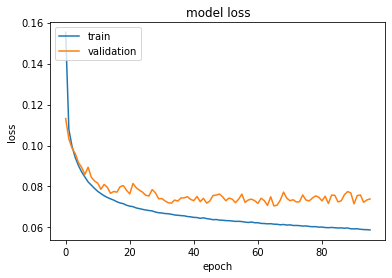

12-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 12)
Model: "functional_119"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_40 (InputLayer)        [(None, 84, 84, 12)]      0         
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 82, 82, 150)       16350     
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_39 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [47]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

12
Model: "functional_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 3, 3, 3, 12)]     0         
_________________________________________________________________
conv3d_10 (Conv3D)           (None, 1, 1, 1, 150)      48750     
_________________________________________________________________
conv3d_11 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_12 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_13 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_4 (Dropout)          (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_14 (Conv3D)           (None, 1, 1, 1, 3)   

2022-04-11 17:03:02.912253: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:03:02.912459: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:03:03.185292: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:03:03.203219: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:03:03.203466: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:03:03.204789: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_03_03
2022-04-11 17:03:03.205309: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_03_03/vw.trace.json.gz
2022-04-11 17:03:03.205380: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:03:03.206397: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

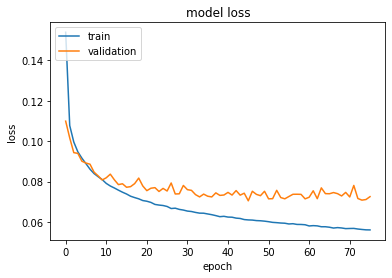

12-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 84, 84, 50, 12)]  0         
_________________________________________________________________
conv3d_15 (Conv3D)           (None, 82, 82, 48, 150)   48750     
_________________________________________________________________
conv3d_16 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_17 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_18 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_5 (Dropout)          (None, 82, 82, 48, 150)   0         
________________________________________________

In [16]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
12input size the ssim score for ndi is: 0.9617721210628507
12input size the ssim score for odi is: 0.9346487836597721
12input size the ssim score for fwf is: 0.9309532395965061
3
conv2d
12input size the ssim score for ndi is: 0.9679489790453784
12input size the ssim score for odi is: 0.939378662324267
12input size the ssim score for fwf is: 0.9438278885973397
3
conv3d
12input size the ssim score for ndi is: 0.9698747391677789
12input size the ssim score for odi is: 0.9396139657001203
12input size the ssim score for fwf is: 0.9418160524397717


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


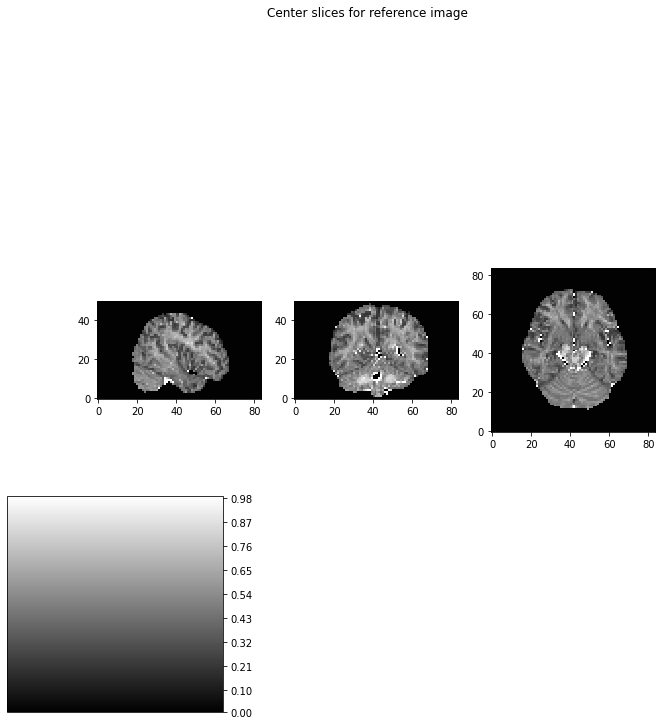

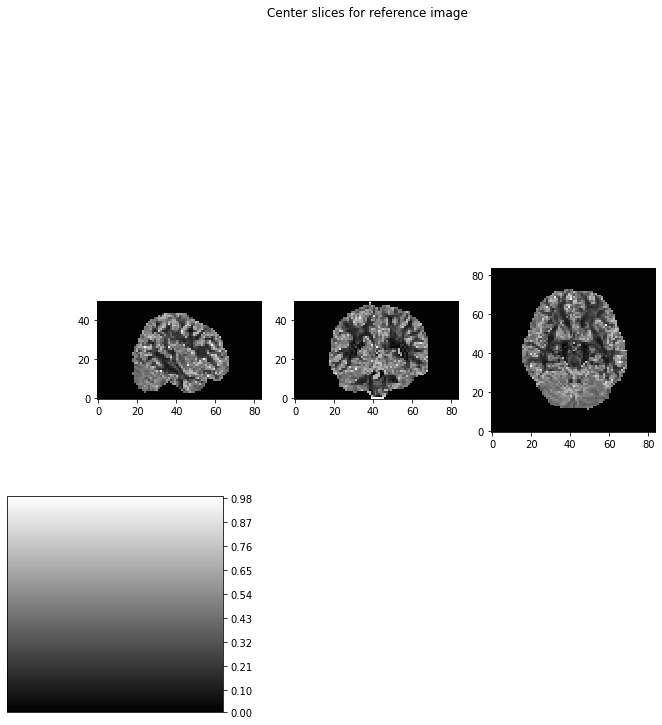

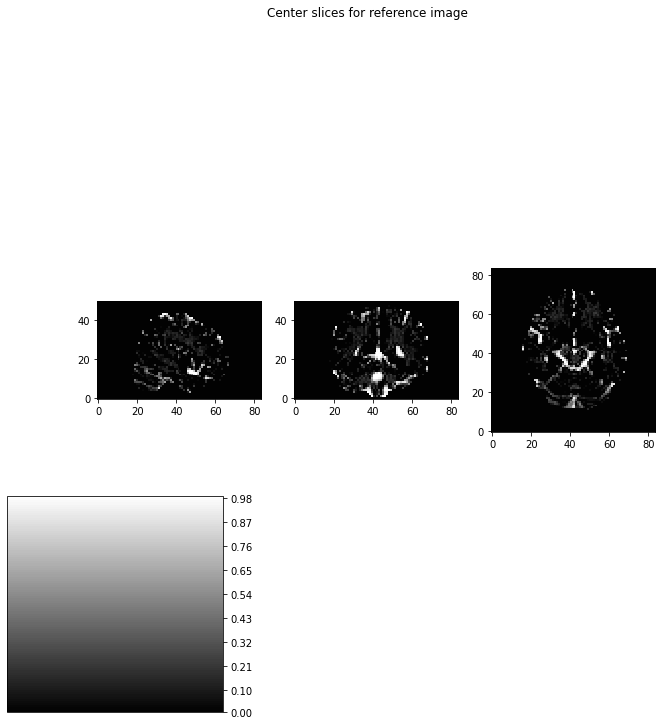

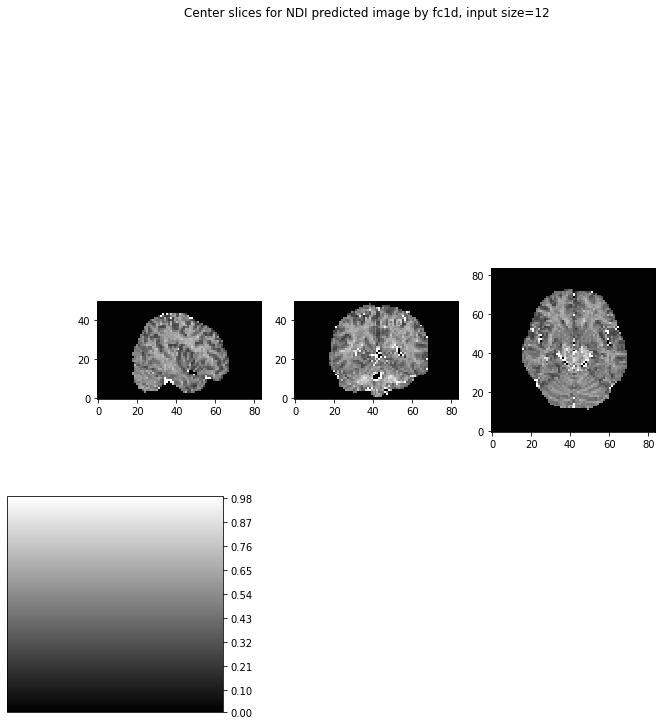

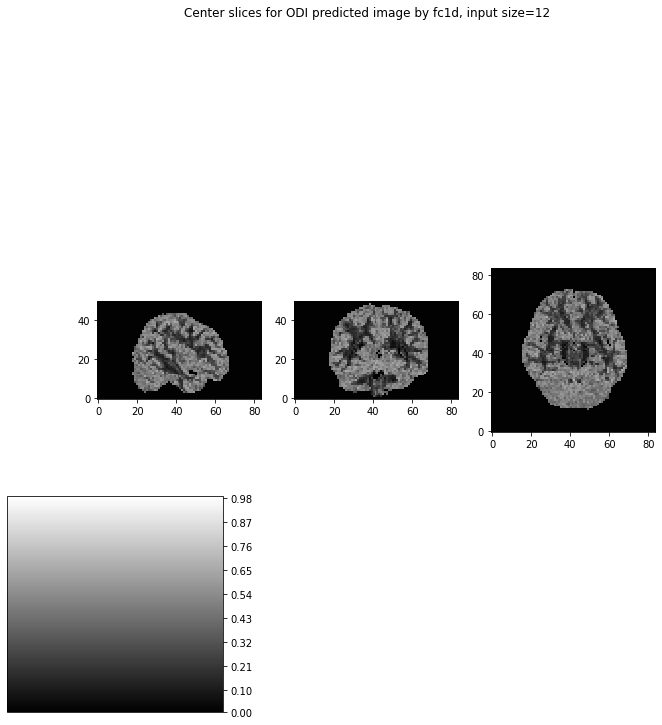

...

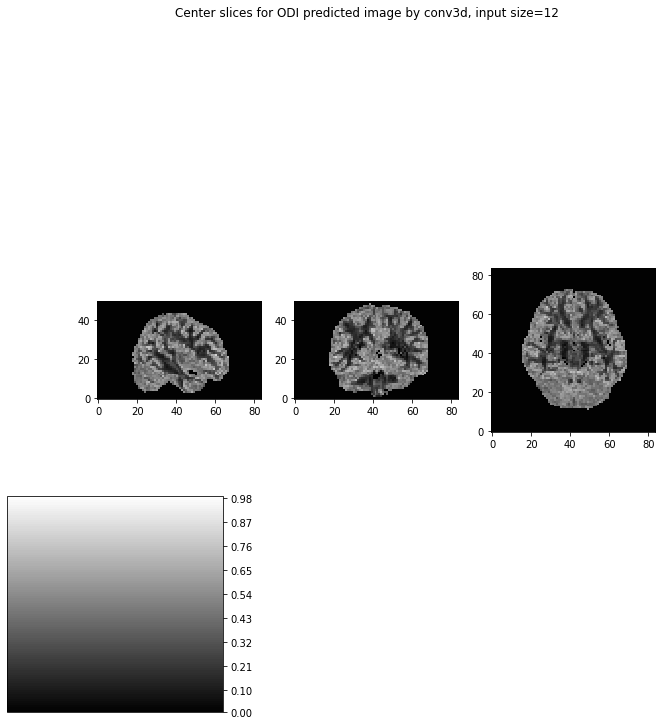

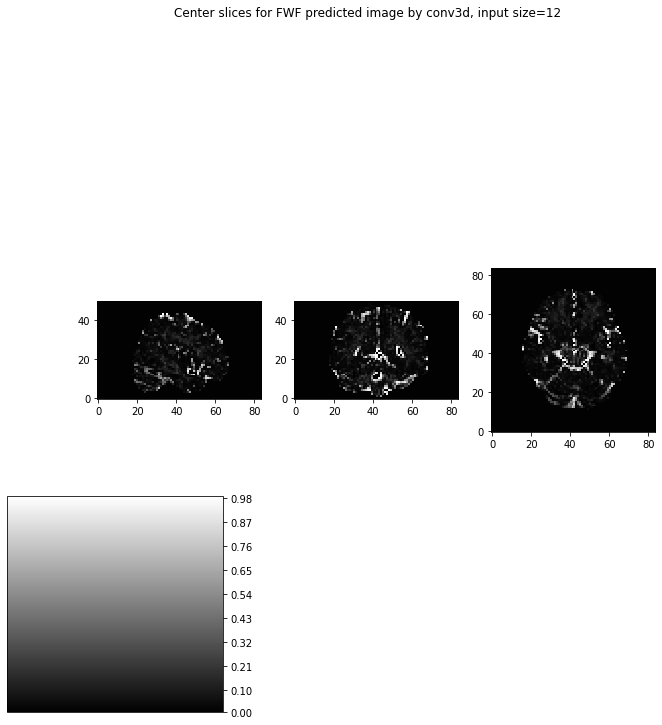

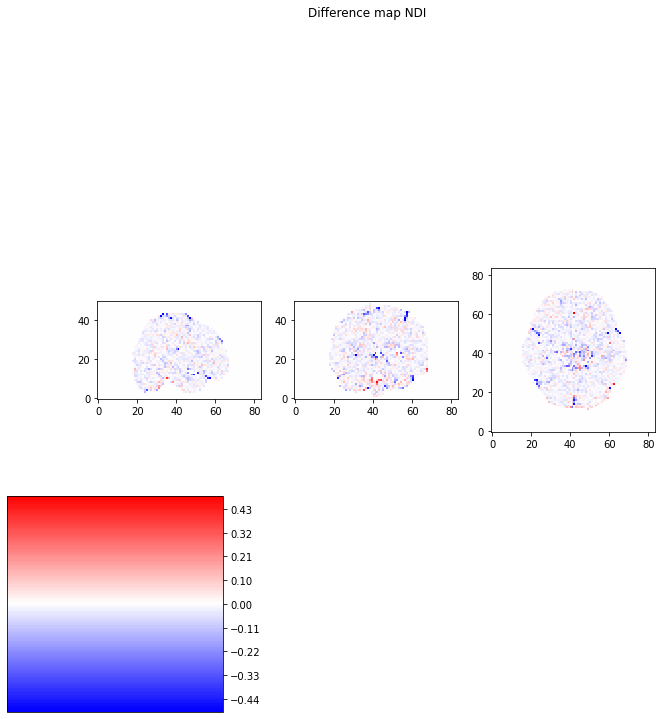

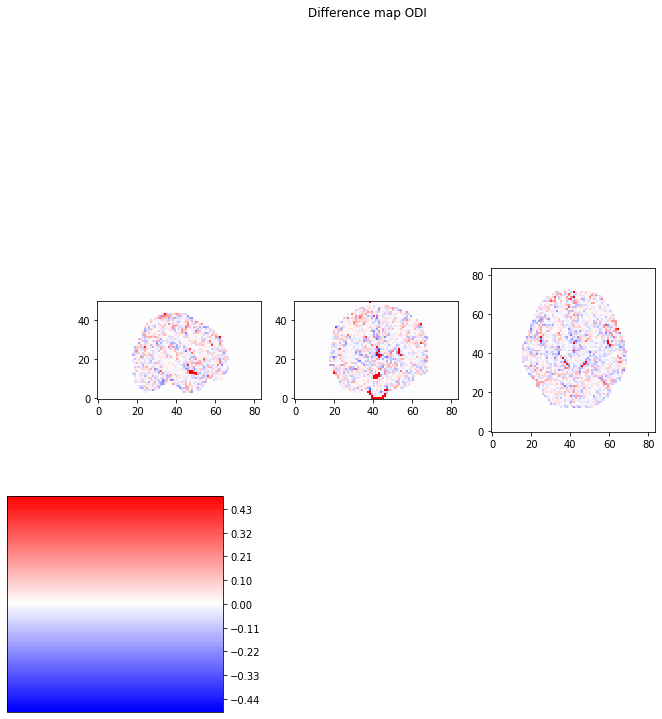

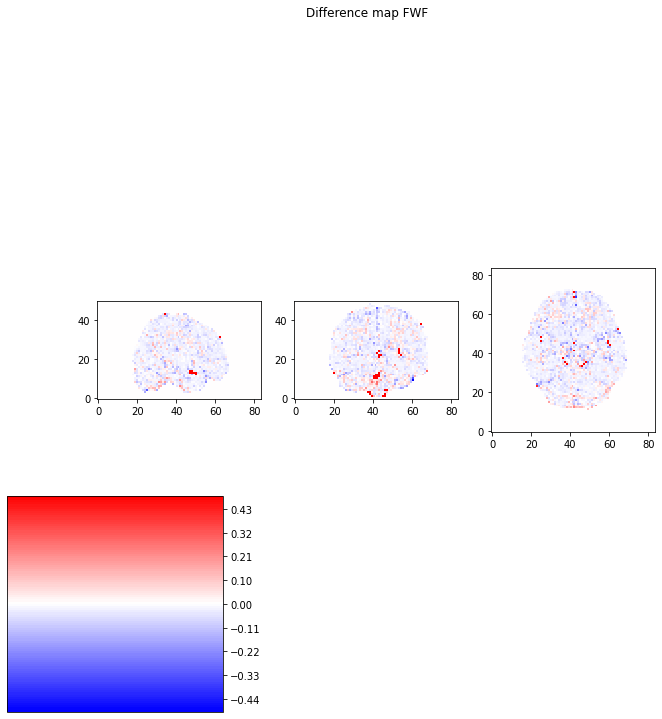

In [17]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 14

In [18]:
dwi = 14

14
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 14)]              0         
_________________________________________________________________
dense (Dense)                (None, 150)               2250      
_________________________________________________________________
dense_1 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_2 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_3 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout (Dropout)            (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-04-11 16:57:11.577090: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-04-11 16:57:11.615001: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-11 16:57:11.615107: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 3060 computeCapability: 8.6
coreClock: 1.777GHz coreCount: 28 deviceMemorySize: 11.76GiB deviceMemoryBandwidth: 335.32GiB/s
2022-04-11 16:57:11.615126: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-04-11 16:57:11.631349: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-04-11 16:57:11.652874: I tensorflow/stream_executor/pl

The remained data has shape: (91401, 14)
(91401, 14)
(91401, 150)
(91401, 150)
(91401, 150)
(91401, 150)
(91401, 150)
(91401, 3)
(91401, 3)
Training start ...


2022-04-11 16:57:12.082127: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 16:57:12.082768: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1391] Profiler found 1 GPUs
2022-04-11 16:57:12.087022: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcupti.so.10.1
2022-04-11 16:57:12.089754: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


2022-04-11 16:57:12.371194: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 16:57:12.374150: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 16:57:12.374997: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 16:57:12.378088: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_16_57_12
2022-04-11 16:57:12.378823: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_16_57_12/vw.trace.json.gz
2022-04-11 16:57:12.378887: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 16:57:12.381619: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

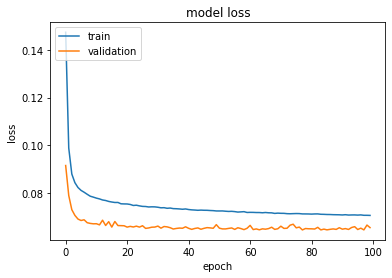

14-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 14)
Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 14)]              0         
_________________________________________________________________
dense_4 (Dense)              (None, 150)               2250      
_________________________________________________________________
dense_5 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_6 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_7 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout_1 (Dropout)          (None, 150)               0         
___________________________________________________

/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/nipy/io/files.py:145: FutureWarning: Default `strict` currently False; this will change to True in a future version of nipy
  ni_img = nipy2nifti(img, data_dtype = io_dtype)


In [13]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

14
Model: "functional_133"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_45 (InputLayer)        [(None, 3, 3, 14)]        0         
_________________________________________________________________
conv2d_70 (Conv2D)           (None, 1, 1, 150)         19050     
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_72 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_73 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_44 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_74 (Conv2D)           (None, 1, 1, 3)     

2022-04-09 21:46:58.258791: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:46:58.258924: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:46:58.562402: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:46:58.585526: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:46:58.585793: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:46:58.587302: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_46_58
2022-04-09 21:46:58.587858: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_46_58/vw.trace.json.gz
2022-04-09 21:46:58.587935: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:46:58.589016: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

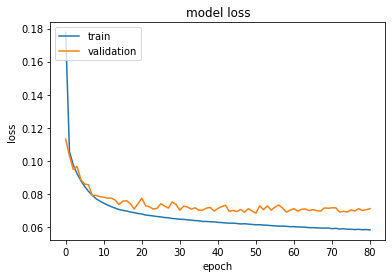

14-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 14)
Model: "functional_137"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_46 (InputLayer)        [(None, 84, 84, 14)]      0         
_________________________________________________________________
conv2d_75 (Conv2D)           (None, 82, 82, 150)       19050     
_________________________________________________________________
conv2d_76 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_77 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_45 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [52]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

14
Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 3, 3, 3, 14)]     0         
_________________________________________________________________
conv3d (Conv3D)              (None, 1, 1, 1, 150)      56850     
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_3 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_4 (Conv3D)            (None, 1, 1, 1, 3)    

2022-04-11 16:59:03.471159: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 16:59:03.471285: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 16:59:03.754894: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 16:59:03.774639: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 16:59:03.774883: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 16:59:03.776180: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_16_59_03
2022-04-11 16:59:03.776732: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_16_59_03/vw.trace.json.gz
2022-04-11 16:59:03.776799: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 16:59:03.777807: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

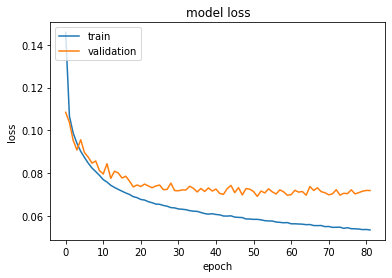

14-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 84, 84, 50, 14)]  0         
_________________________________________________________________
conv3d_5 (Conv3D)            (None, 82, 82, 48, 150)   56850     
_________________________________________________________________
conv3d_6 (Conv3D)            (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_7 (Conv3D)            (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_8 (Conv3D)            (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_3 (Dropout)          (None, 82, 82, 48, 150)   0         
________________________________________________

In [14]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
14input size the ssim score for ndi is: 0.9661329470464444
14input size the ssim score for odi is: 0.9382170922563469
14input size the ssim score for fwf is: 0.933479859587976
3
conv2d
14input size the ssim score for ndi is: 0.9673338591334565
14input size the ssim score for odi is: 0.9419944397138637
14input size the ssim score for fwf is: 0.9429016741619494
3
conv3d
14input size the ssim score for ndi is: 0.9703464421216597
14input size the ssim score for odi is: 0.9400366257465501
14input size the ssim score for fwf is: 0.9489380269198607


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


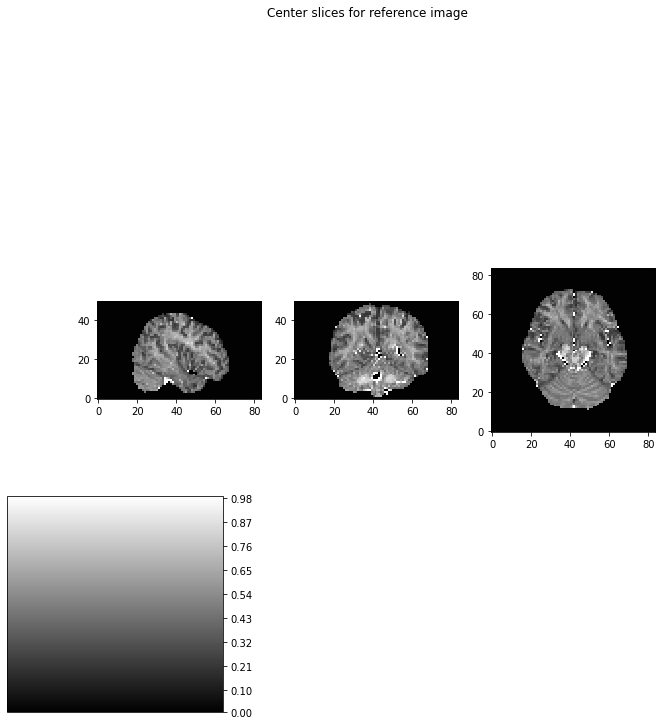

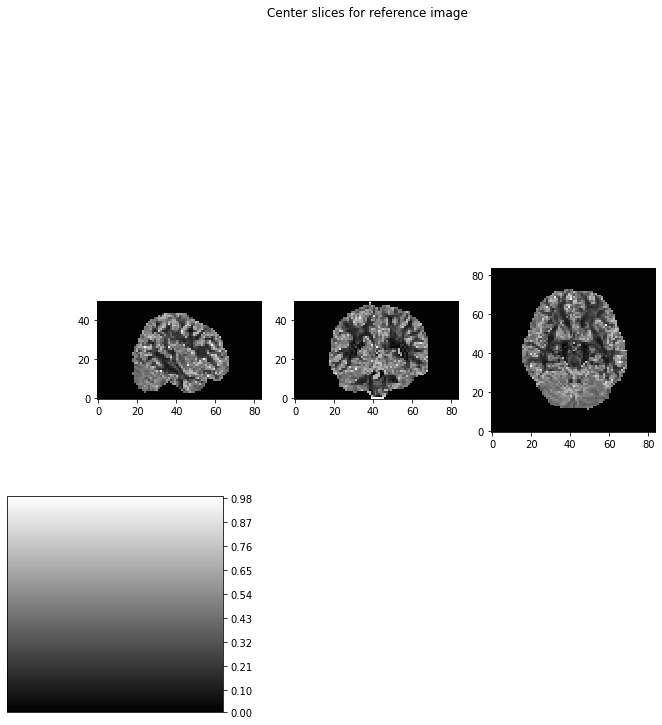

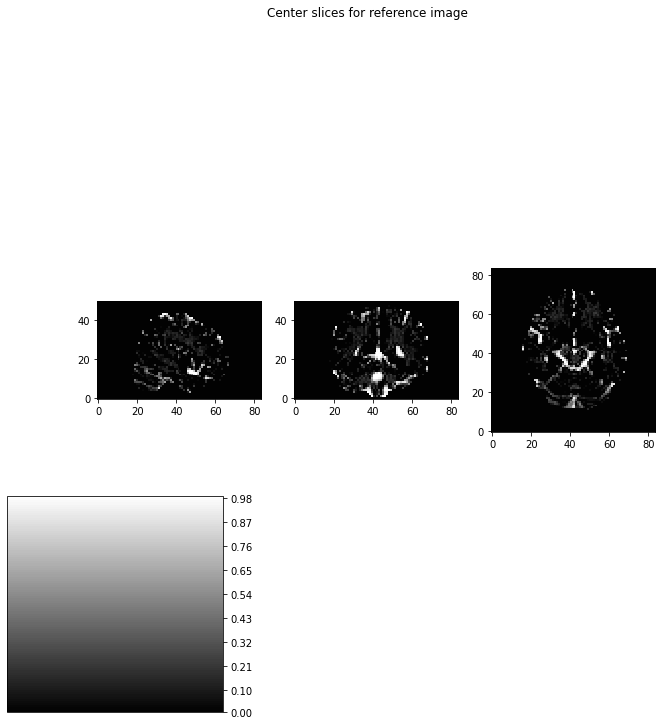

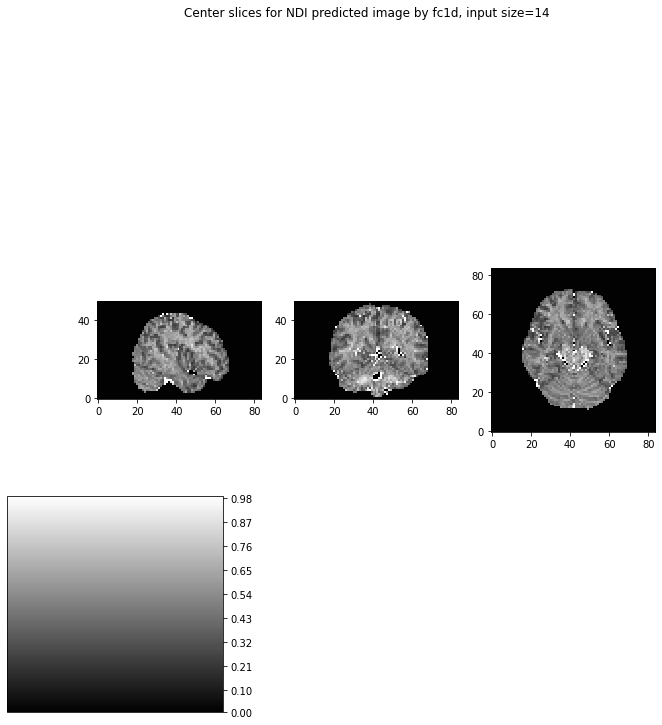

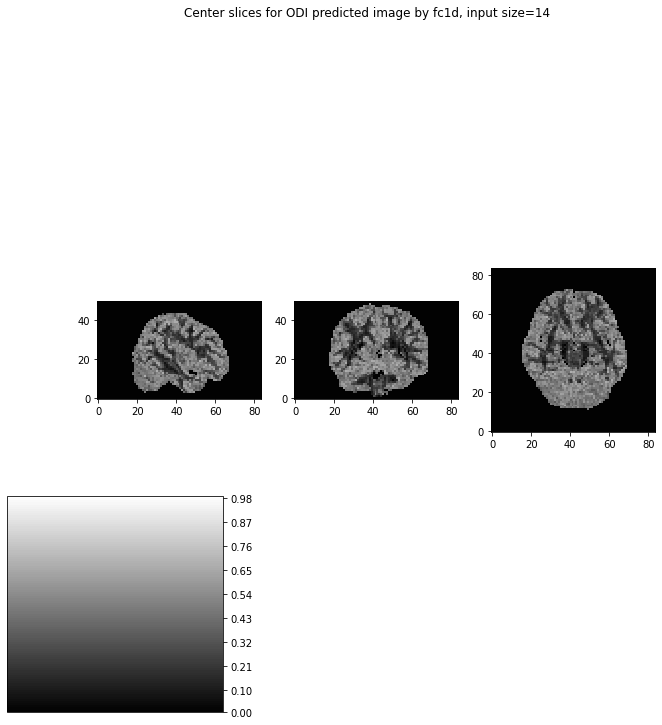

...

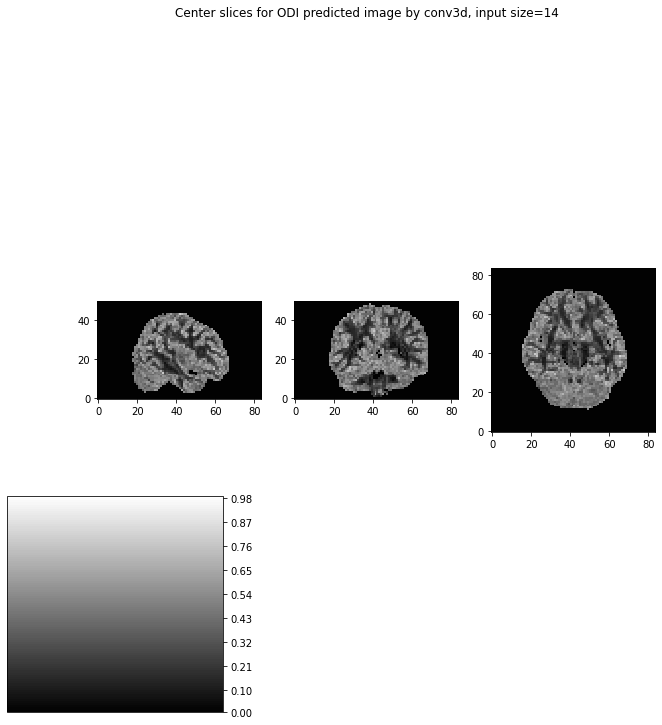

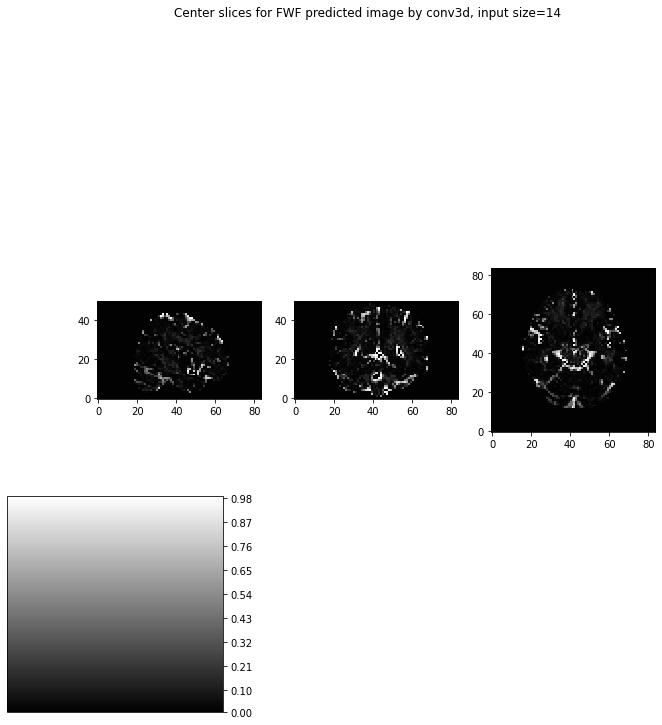

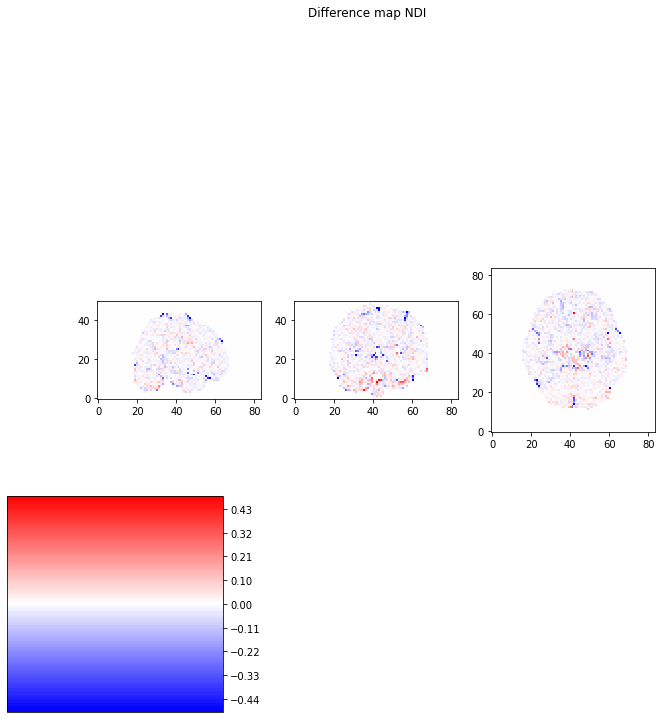

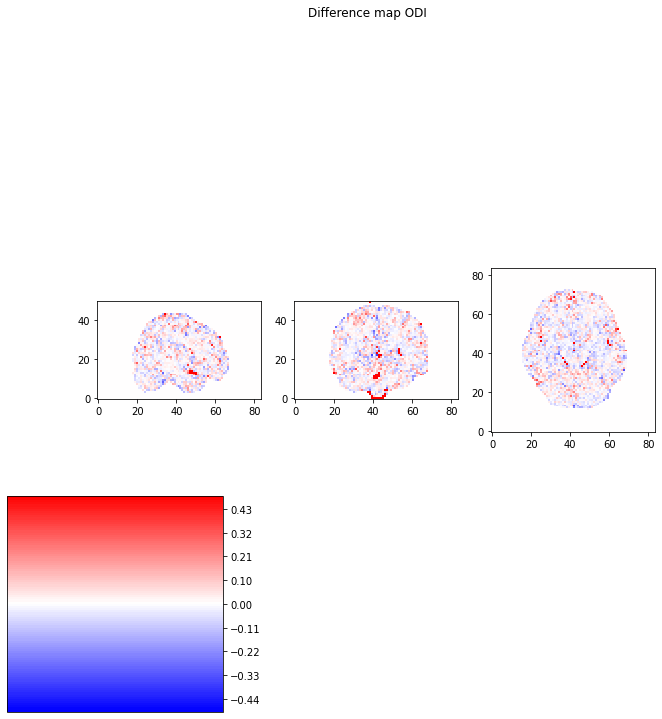

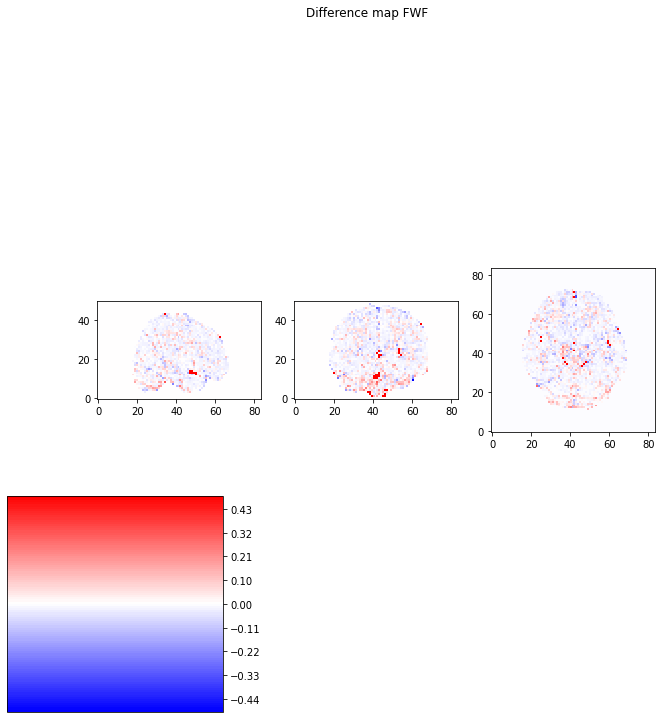

In [19]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 16

In [55]:
dwi = 16

16
Model: "functional_145"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_49 (InputLayer)        [(None, 16)]              0         
_________________________________________________________________
dense_64 (Dense)             (None, 150)               2550      
_________________________________________________________________
dense_65 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_66 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_67 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_48 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 21:49:20.454090: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:49:20.454308: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:49:20.761312: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:49:20.781614: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:49:20.781879: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:49:20.783217: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_49_20
2022-04-09 21:49:20.783728: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_49_20/vw.trace.json.gz
2022-04-09 21:49:20.783797: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:49:20.784773: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

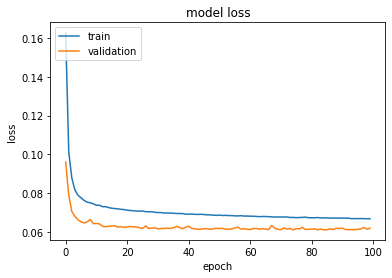

16-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 16)
Model: "functional_149"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_50 (InputLayer)        [(None, 16)]              0         
_________________________________________________________________
dense_68 (Dense)             (None, 150)               2550      
_________________________________________________________________
dense_69 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_70 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_71 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_49 (Dropout)         (None, 150)               0         
_________________________________________________

In [56]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

16
Model: "functional_151"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_51 (InputLayer)        [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_80 (Conv2D)           (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_81 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_82 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_83 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_50 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_84 (Conv2D)           (None, 1, 1, 3)     

2022-04-09 21:50:07.737805: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:50:07.737882: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:50:08.076568: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:50:08.098682: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:50:08.098942: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:50:08.100286: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_50_08
2022-04-09 21:50:08.100837: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_50_08/vw.trace.json.gz
2022-04-09 21:50:08.100914: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:50:08.101966: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

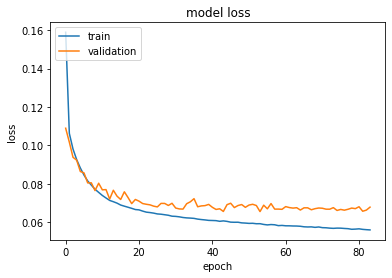

16-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 16)
Model: "functional_155"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_52 (InputLayer)        [(None, 84, 84, 16)]      0         
_________________________________________________________________
conv2d_85 (Conv2D)           (None, 82, 82, 150)       21750     
_________________________________________________________________
conv2d_86 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_87 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_51 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [57]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

16
Model: "functional_157"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_53 (InputLayer)        [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_80 (Conv3D)           (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_81 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_82 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_83 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_52 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_84 (Conv3D)           (None, 1, 1, 1, 3)  

2022-04-09 21:51:14.760559: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:51:14.760696: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:51:15.127367: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:51:15.146364: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:51:15.146622: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:51:15.147887: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_51_15
2022-04-09 21:51:15.148411: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_51_15/vw.trace.json.gz
2022-04-09 21:51:15.148480: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:51:15.149500: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

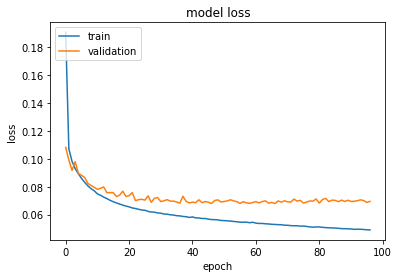

16-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_161"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_54 (InputLayer)        [(None, 84, 84, 50, 16)]  0         
_________________________________________________________________
conv3d_85 (Conv3D)           (None, 82, 82, 48, 150)   64950     
_________________________________________________________________
conv3d_86 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_87 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_88 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_53 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________

In [58]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
16input size the ssim score for ndi is: 0.9675484159955052
16input size the ssim score for odi is: 0.9419605859182255
16input size the ssim score for fwf is: 0.9399277616285582
3
conv2d
16input size the ssim score for ndi is: 0.9693009476129347
16input size the ssim score for odi is: 0.944371245457169
16input size the ssim score for fwf is: 0.9458436676631844
3
conv3d
16input size the ssim score for ndi is: 0.9711726323442222
16input size the ssim score for odi is: 0.9429915910944039
16input size the ssim score for fwf is: 0.9492909314340088


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


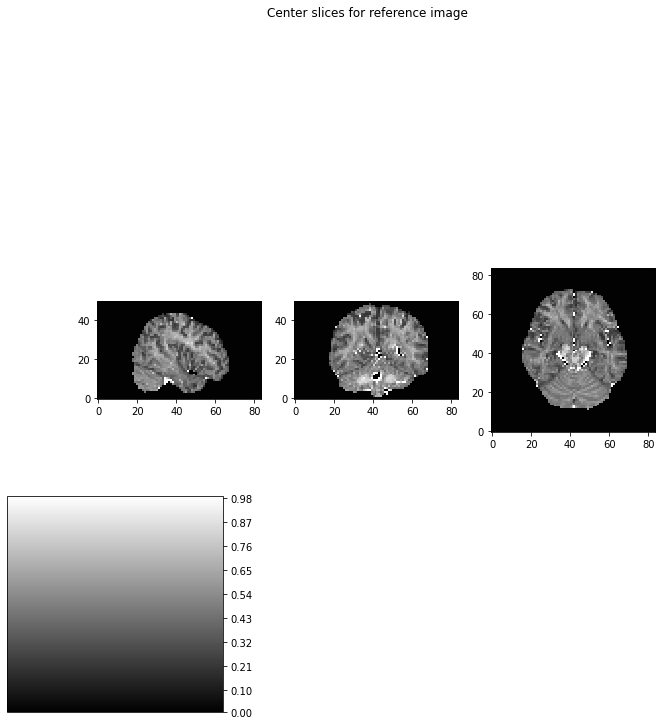

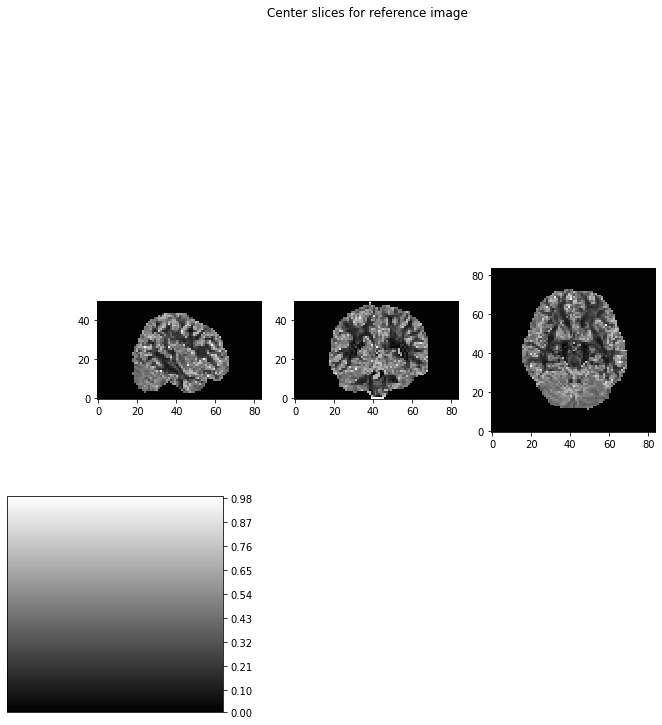

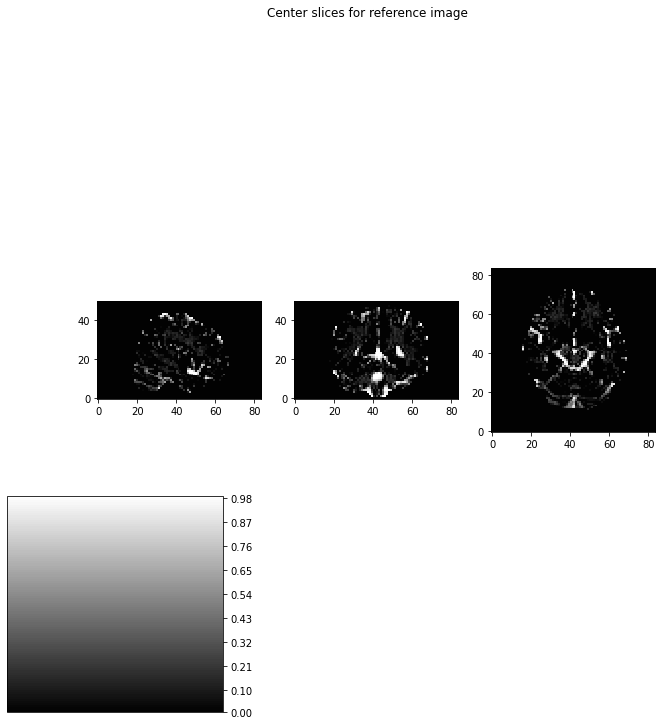

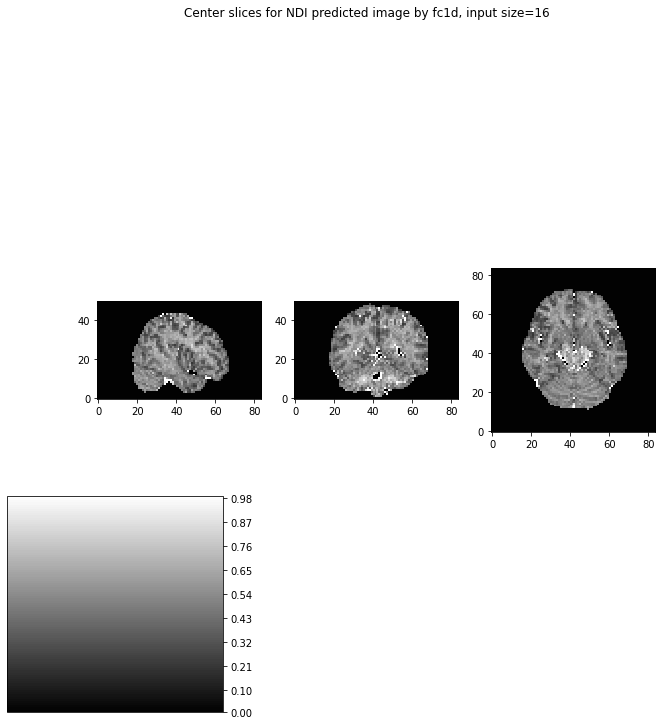

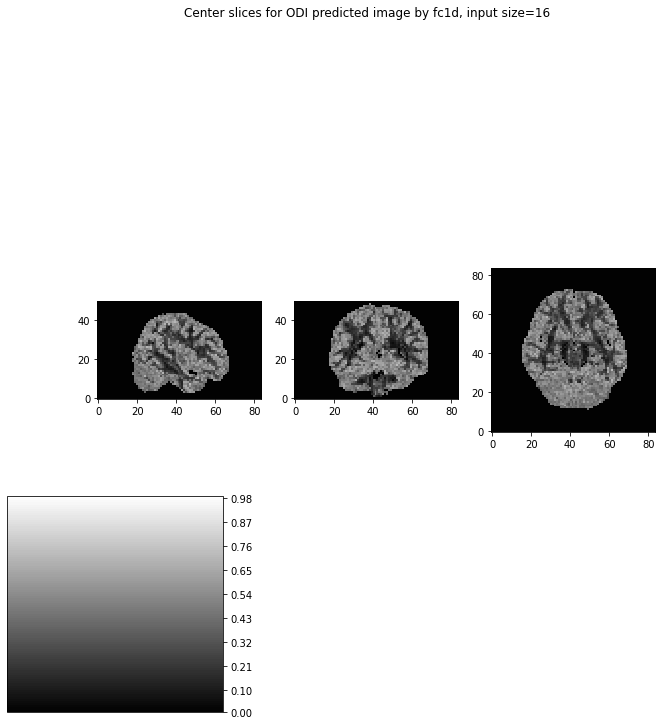

...

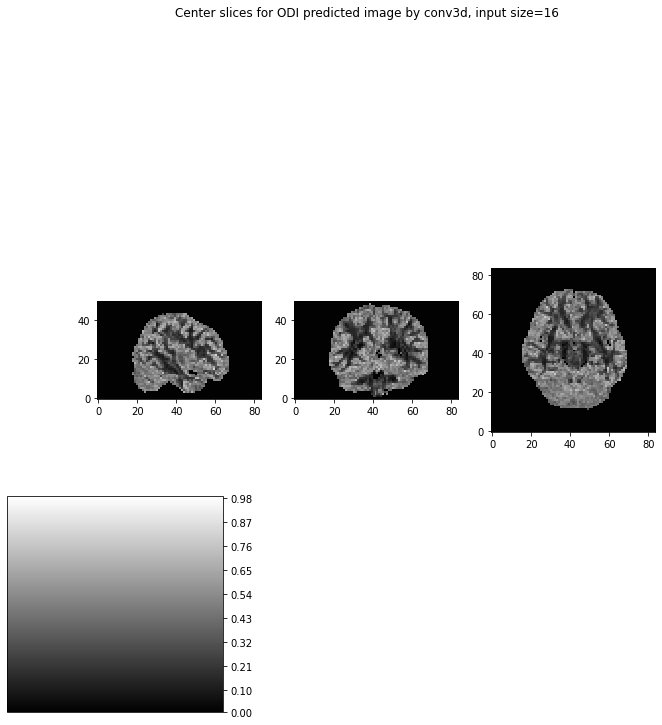

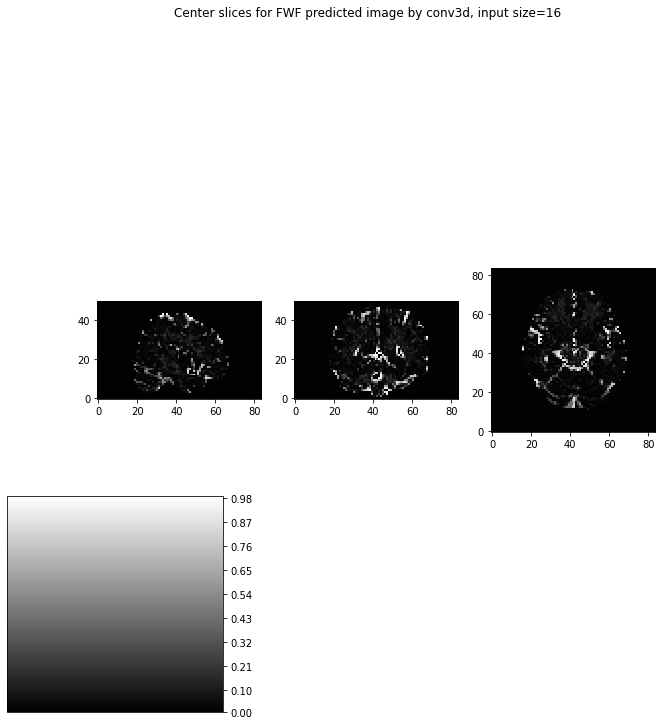

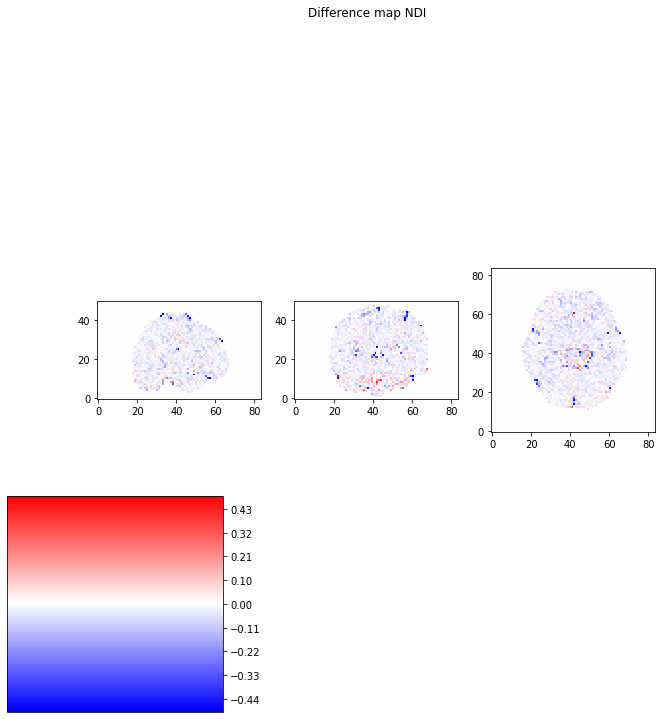

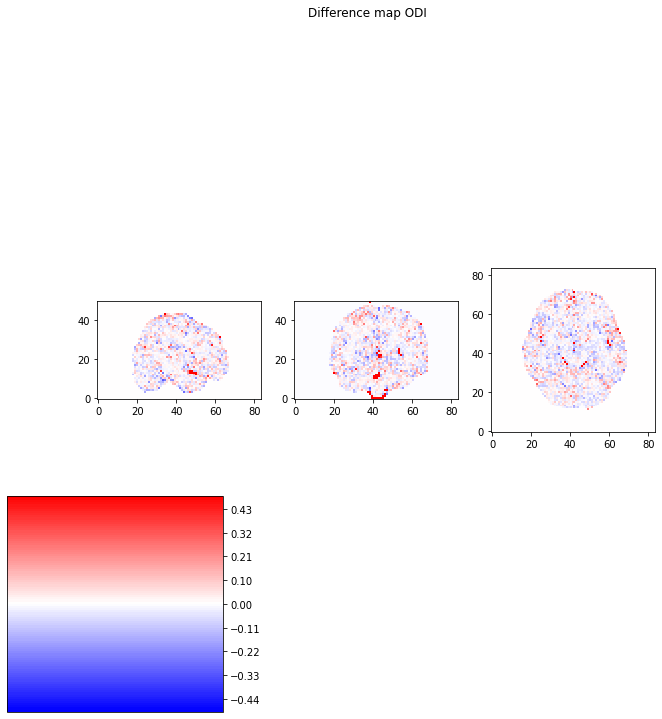

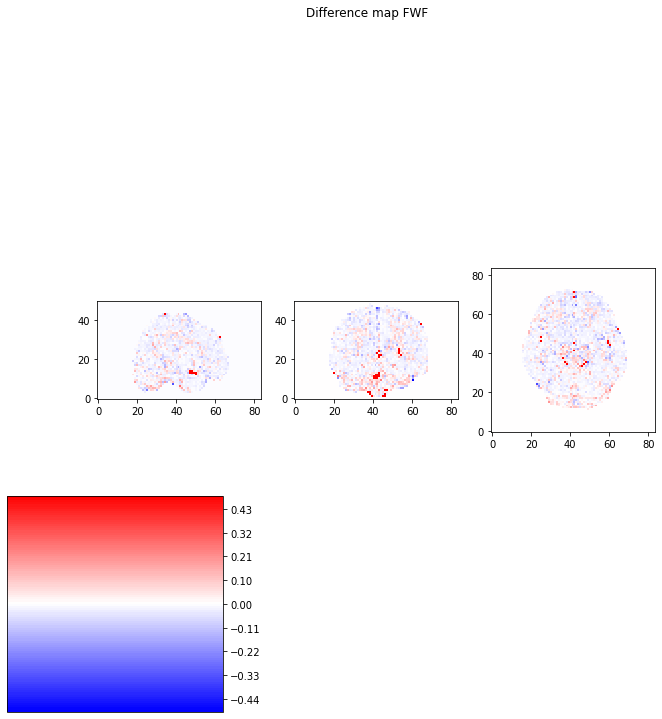

In [59]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 18

In [20]:
dwi = 18

18
Model: "functional_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 18)]              0         
_________________________________________________________________
dense_8 (Dense)              (None, 150)               2850      
_________________________________________________________________
dense_9 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_10 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_11 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_6 (Dropout)          (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)            

2022-04-11 17:07:41.832769: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:07:41.832868: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:07:42.041004: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:07:42.057349: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:07:42.057601: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:07:42.058857: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_07_42
2022-04-11 17:07:42.059368: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_07_42/vw.trace.json.gz
2022-04-11 17:07:42.059437: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:07:42.060458: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

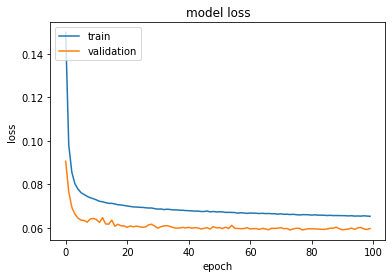

18-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 18)
Model: "functional_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 18)]              0         
_________________________________________________________________
dense_12 (Dense)             (None, 150)               2850      
_________________________________________________________________
dense_13 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_14 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_15 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_7 (Dropout)          (None, 150)               0         
__________________________________________________

In [21]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

18
Model: "functional_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 3, 3, 18)]        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 1, 1, 150)         24450     
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_10 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 1, 3)      

2022-04-11 17:10:08.975495: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:10:08.975612: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:10:09.236164: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:10:09.254772: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:10:09.255017: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:10:09.256303: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_10_09
2022-04-11 17:10:09.256806: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_10_09/vw.trace.json.gz
2022-04-11 17:10:09.256881: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:10:09.257887: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

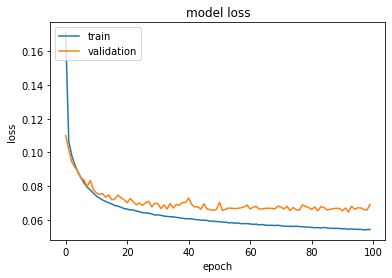

18-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 18)
Model: "functional_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 84, 84, 18)]      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 82, 82, 150)       24450     
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_11 (Dropout)         (None, 82, 82, 150)       0         
________________________________________________

In [23]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

18
Model: "functional_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 3, 3, 3, 18)]     0         
_________________________________________________________________
conv3d_30 (Conv3D)           (None, 1, 1, 1, 150)      73050     
_________________________________________________________________
conv3d_31 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_32 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_33 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_12 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_34 (Conv3D)           (None, 1, 1, 1, 3)   

2022-04-11 17:11:29.857265: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:11:29.857416: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:11:30.169184: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:11:30.188268: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:11:30.188542: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:11:30.189893: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_11_30
2022-04-11 17:11:30.190413: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_11_30/vw.trace.json.gz
2022-04-11 17:11:30.190490: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:11:30.191516: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

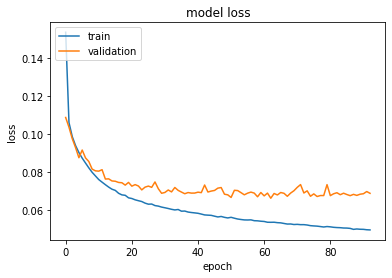

18-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        [(None, 84, 84, 50, 18)]  0         
_________________________________________________________________
conv3d_35 (Conv3D)           (None, 82, 82, 48, 150)   73050     
_________________________________________________________________
conv3d_36 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_37 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_38 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_13 (Dropout)         (None, 82, 82, 48, 150)   0         
________________________________________________

In [24]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
18input size the ssim score for ndi is: 0.9711127439793893
18input size the ssim score for odi is: 0.9423556633542428
18input size the ssim score for fwf is: 0.9436899180551525
3
conv2d
18input size the ssim score for ndi is: 0.9713146729745692
18input size the ssim score for odi is: 0.9433488015049821
18input size the ssim score for fwf is: 0.9441620419380556
3
conv3d
18input size the ssim score for ndi is: 0.9722705066028248
18input size the ssim score for odi is: 0.943459059519283
18input size the ssim score for fwf is: 0.9453861295675038


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


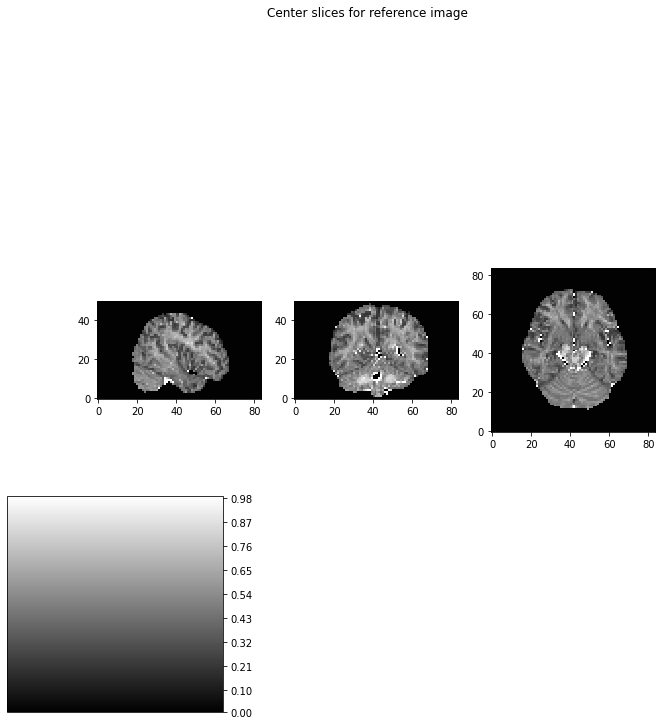

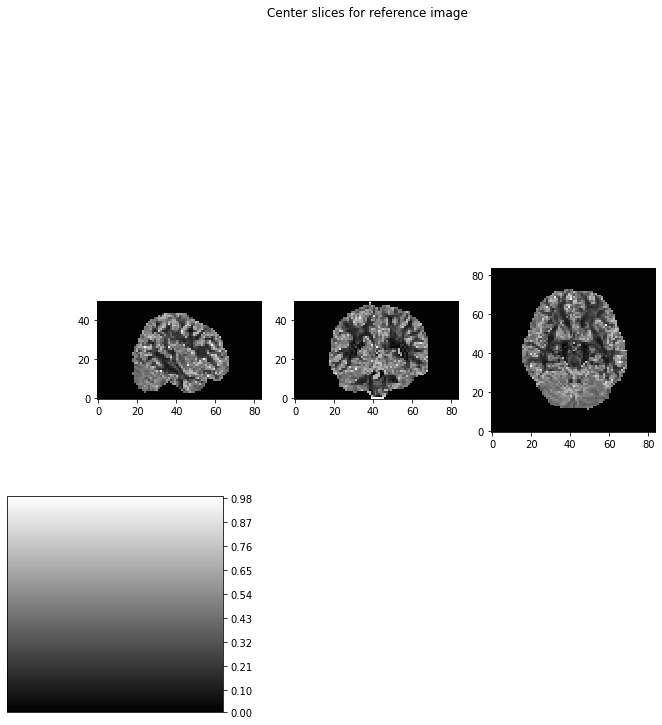

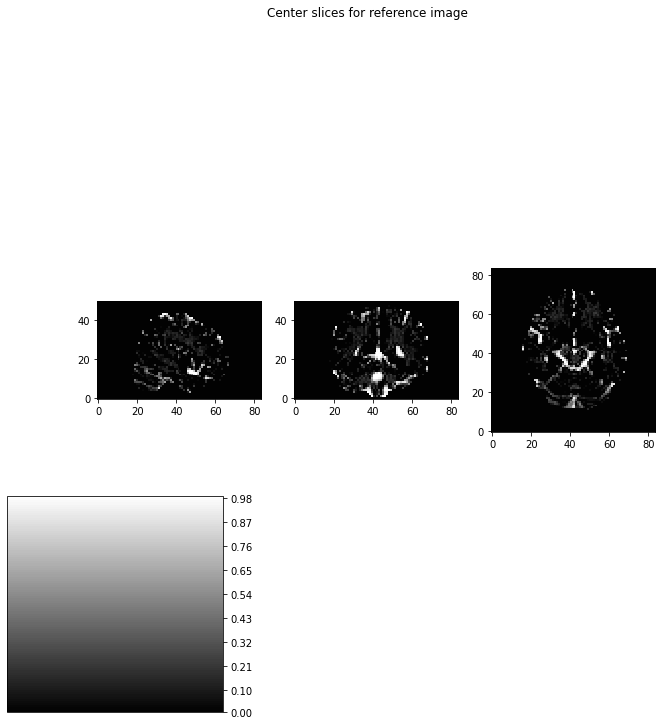

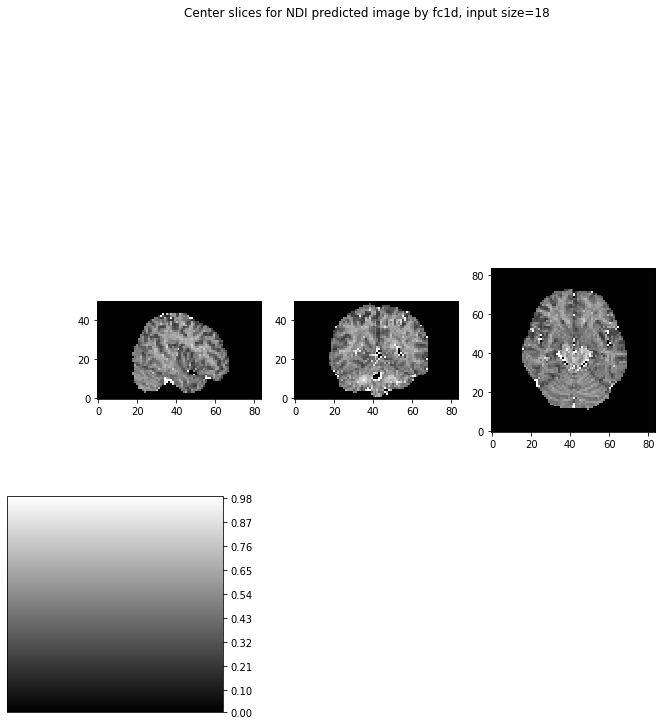

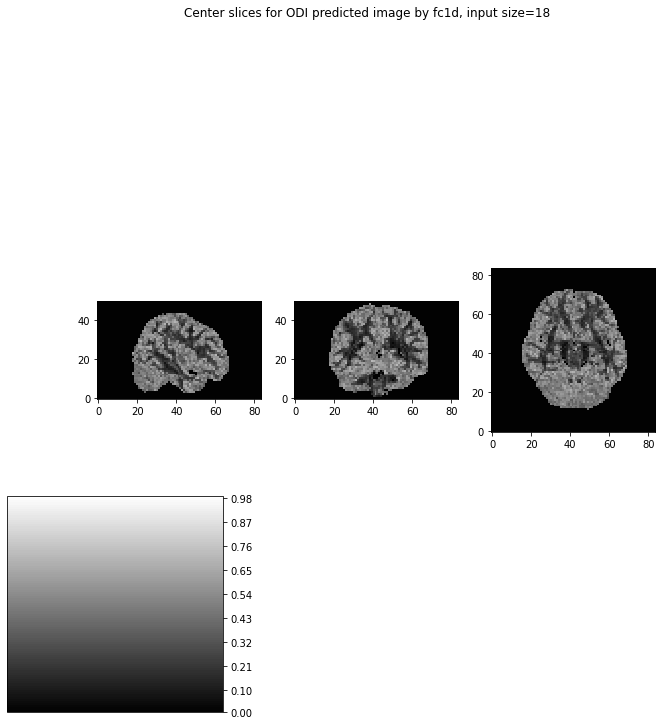

...

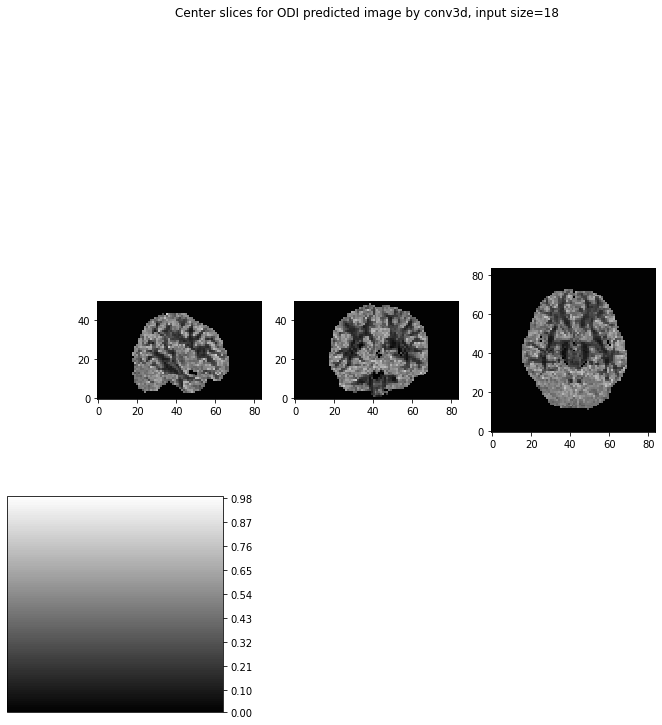

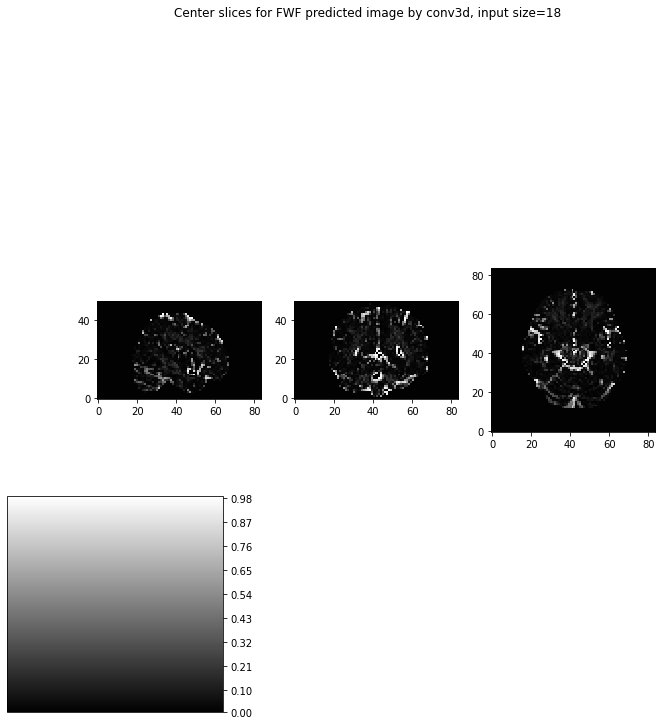

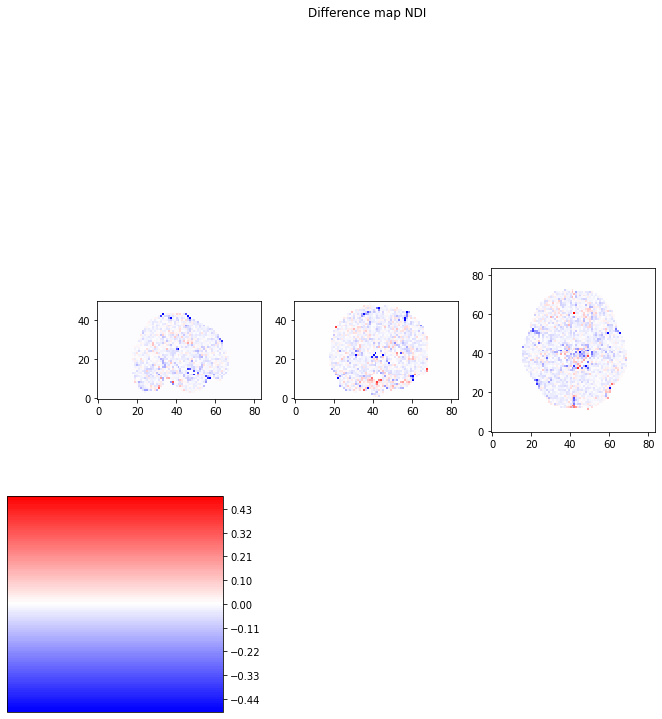

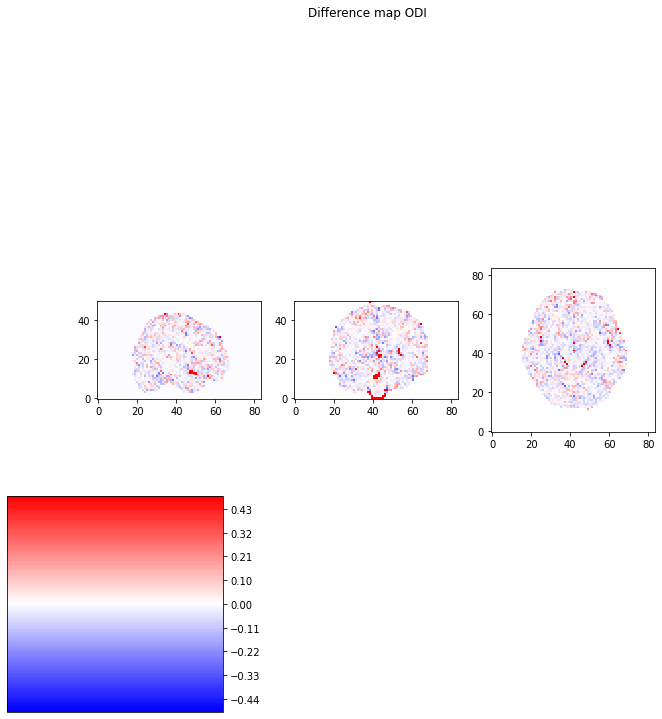

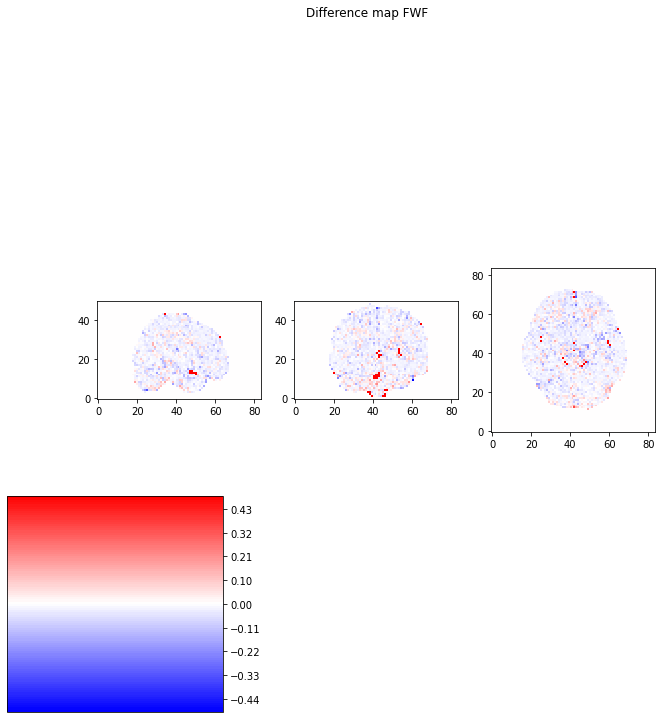

In [25]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 20

In [26]:
dwi = 20

20
Model: "functional_181"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_61 (InputLayer)        [(None, 20)]              0         
_________________________________________________________________
dense_80 (Dense)             (None, 150)               3150      
_________________________________________________________________
dense_81 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_82 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_83 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_60 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 21:55:59.205443: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:55:59.205558: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:55:59.537841: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:55:59.558365: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:55:59.558634: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:55:59.560025: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_55_59
2022-04-09 21:55:59.560567: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_55_59/vw.trace.json.gz
2022-04-09 21:55:59.560650: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:55:59.561717: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

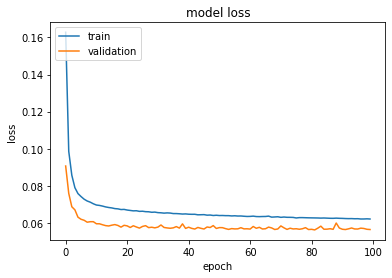

20-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 20)
Model: "functional_185"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_62 (InputLayer)        [(None, 20)]              0         
_________________________________________________________________
dense_84 (Dense)             (None, 150)               3150      
_________________________________________________________________
dense_85 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_86 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_87 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_61 (Dropout)         (None, 150)               0         
_________________________________________________

In [66]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

20
Model: "functional_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        [(None, 3, 3, 20)]        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 1, 1, 150)         27150     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_14 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 1, 1, 3)      

2022-04-11 17:13:10.076370: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:13:10.076539: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:13:10.348833: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:13:10.368287: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:13:10.368540: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:13:10.369808: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_13_10
2022-04-11 17:13:10.370314: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_13_10/vw.trace.json.gz
2022-04-11 17:13:10.370380: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:13:10.371362: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

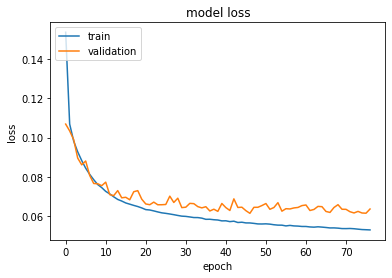

20-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 20)
Model: "functional_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 84, 84, 20)]      0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 82, 82, 150)       27150     
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_15 (Dropout)         (None, 82, 82, 150)       0         
________________________________________________

In [27]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

20
Model: "functional_193"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_65 (InputLayer)        [(None, 3, 3, 3, 20)]     0         
_________________________________________________________________
conv3d_100 (Conv3D)          (None, 1, 1, 1, 150)      81150     
_________________________________________________________________
conv3d_101 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_102 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_103 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_64 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_104 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-09 21:58:05.364935: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:58:05.365127: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:58:05.777738: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:58:05.797515: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:58:05.797802: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:58:05.799806: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_58_05
2022-04-09 21:58:05.800391: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_58_05/vw.trace.json.gz
2022-04-09 21:58:05.800464: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:58:05.801556: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

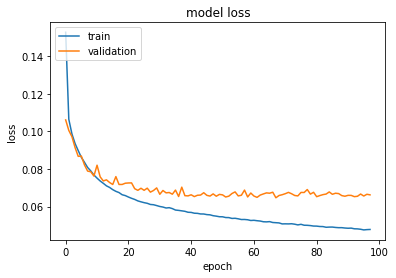

20-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_197"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_66 (InputLayer)        [(None, 84, 84, 50, 20)]  0         
_________________________________________________________________
conv3d_105 (Conv3D)          (None, 82, 82, 48, 150)   81150     
_________________________________________________________________
conv3d_106 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_107 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_108 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_65 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________

In [68]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
20input size the ssim score for ndi is: 0.9719351944998774
20input size the ssim score for odi is: 0.9454106281032593
20input size the ssim score for fwf is: 0.9424908593932456
3
conv2d
20input size the ssim score for ndi is: 0.9762420508667693
20input size the ssim score for odi is: 0.9468280417482678
20input size the ssim score for fwf is: 0.9523496358676087
3
conv3d
20input size the ssim score for ndi is: 0.9743948788955242
20input size the ssim score for odi is: 0.9457089389476131
20input size the ssim score for fwf is: 0.9495300339767672


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


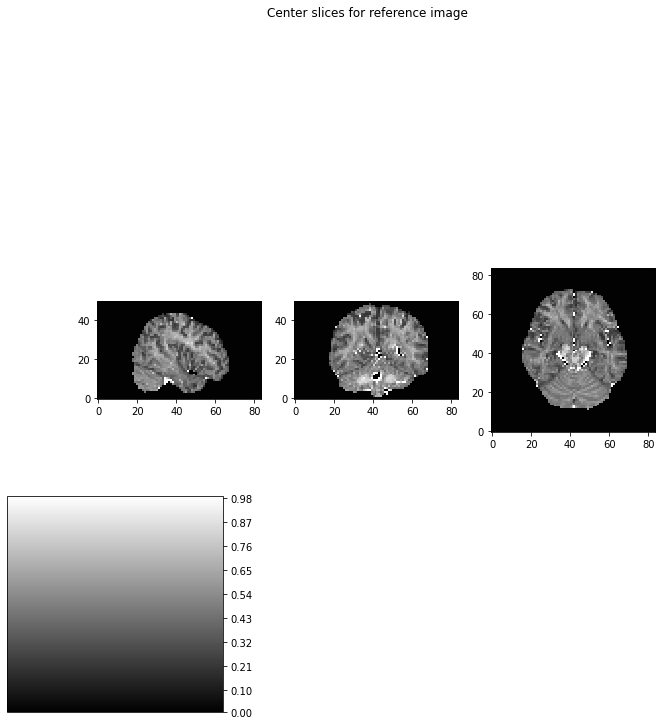

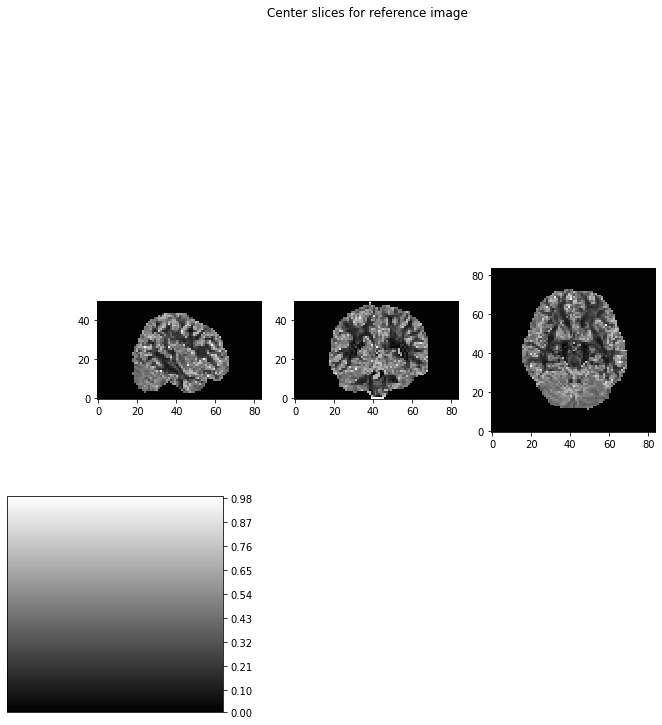

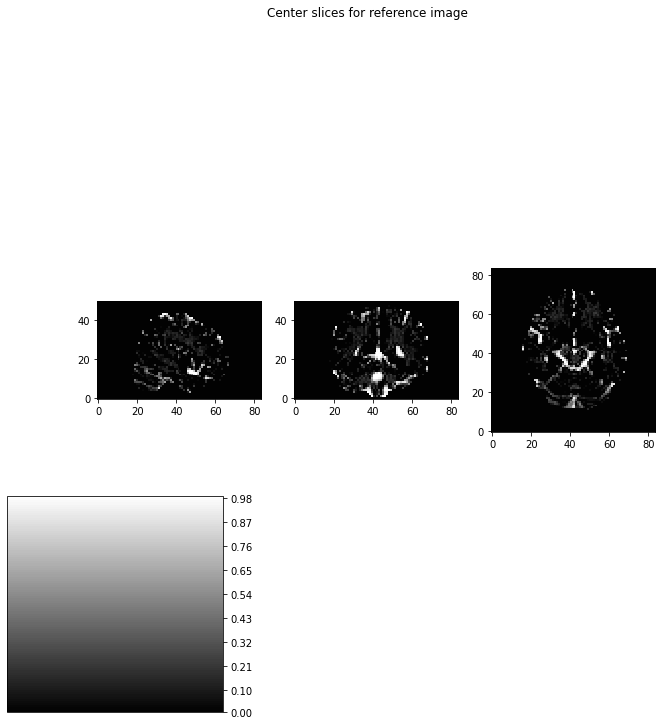

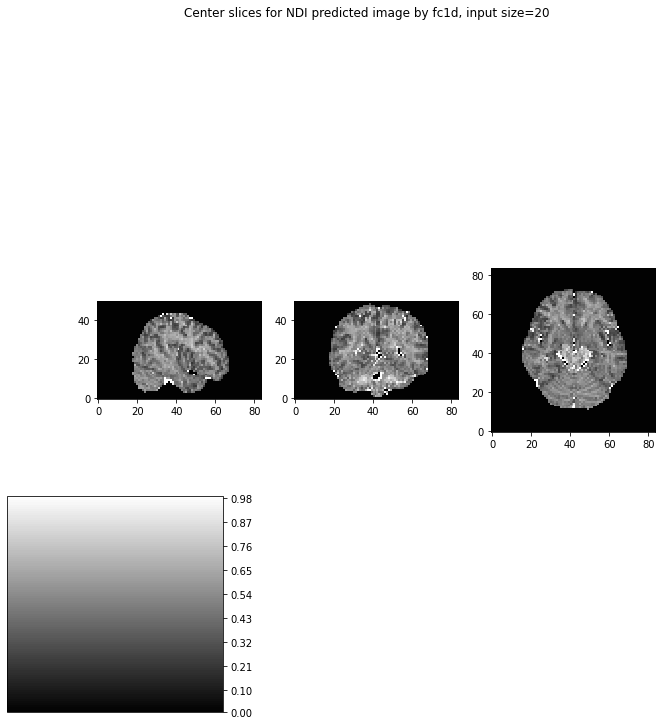

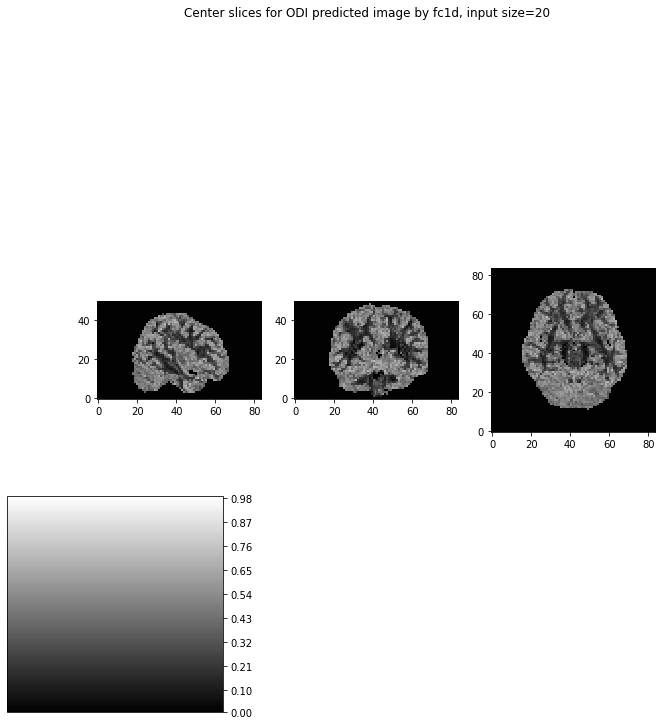

...

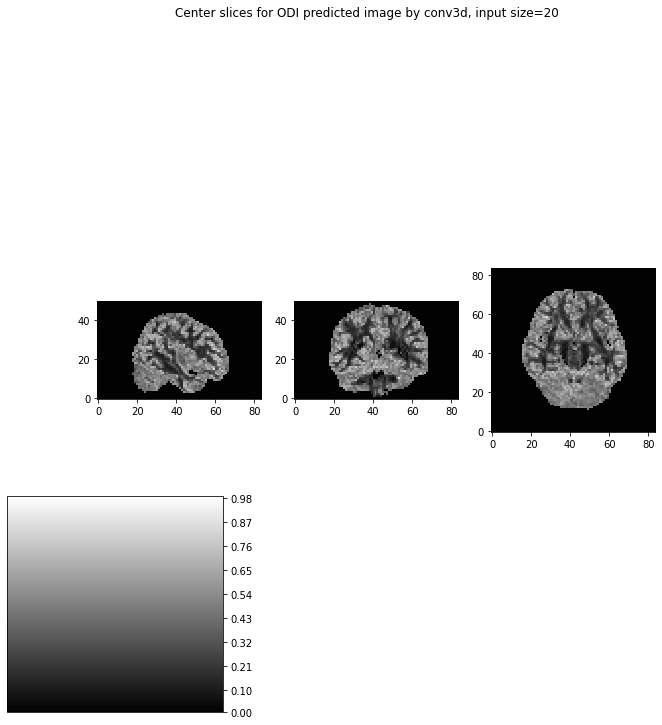

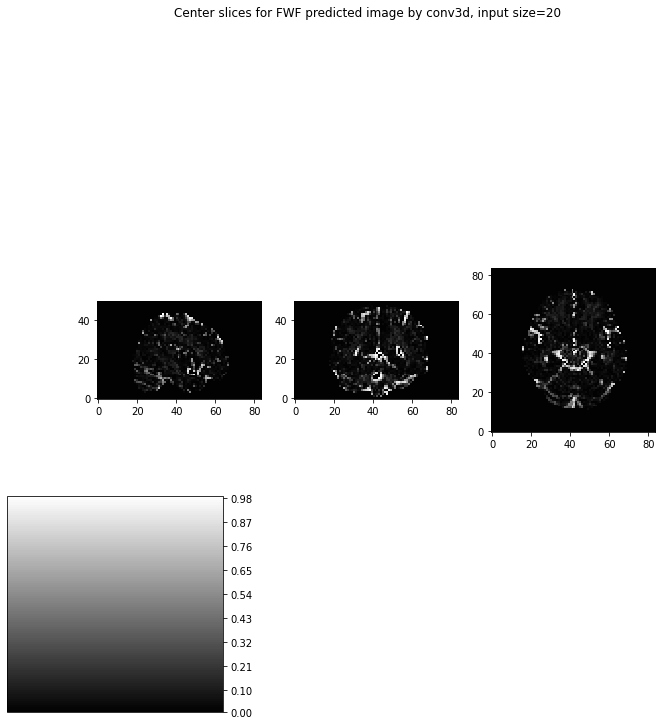

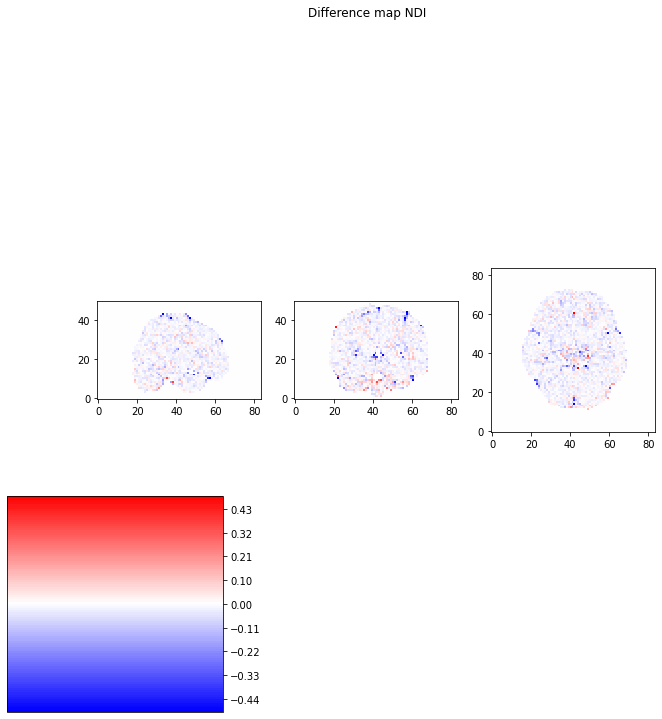

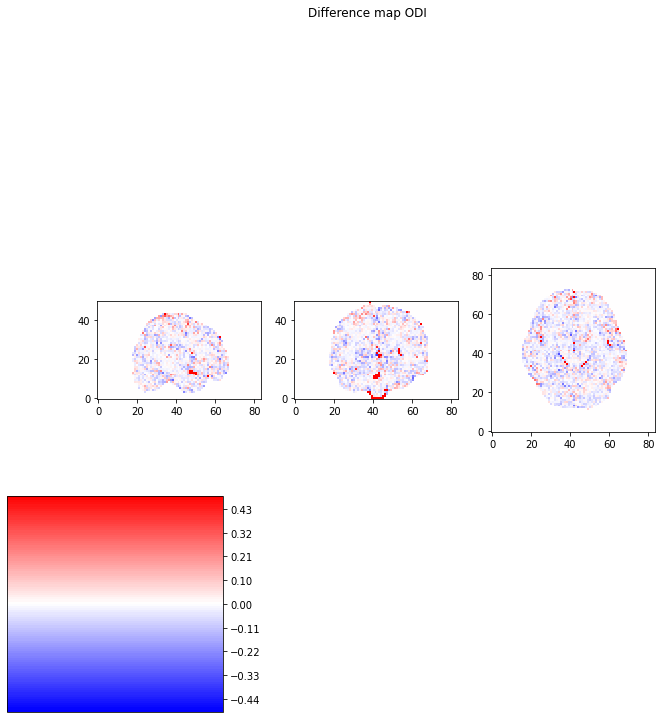

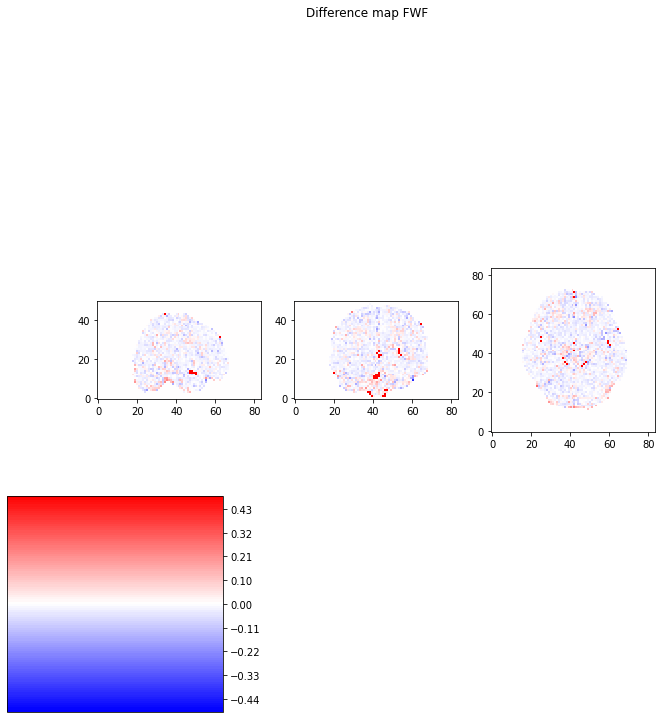

In [69]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 22

In [28]:
dwi = 22

22
Model: "functional_199"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_67 (InputLayer)        [(None, 22)]              0         
_________________________________________________________________
dense_88 (Dense)             (None, 150)               3450      
_________________________________________________________________
dense_89 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_90 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_91 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_66 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 21:59:33.966617: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:59:33.966755: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 21:59:34.323085: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 21:59:34.344907: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 21:59:34.345255: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 21:59:34.346579: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_21_59_34
2022-04-09 21:59:34.347120: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_21_59_34/vw.trace.json.gz
2022-04-09 21:59:34.347194: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 21:59:34.348223: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

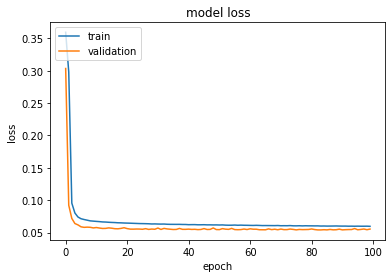

22-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 22)
Model: "functional_203"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_68 (InputLayer)        [(None, 22)]              0         
_________________________________________________________________
dense_92 (Dense)             (None, 150)               3450      
_________________________________________________________________
dense_93 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_94 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_95 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_67 (Dropout)         (None, 150)               0         
_________________________________________________

In [71]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

22
Model: "functional_205"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_69 (InputLayer)        [(None, 3, 3, 22)]        0         
_________________________________________________________________
conv2d_110 (Conv2D)          (None, 1, 1, 150)         29850     
_________________________________________________________________
conv2d_111 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_112 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_113 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_68 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_114 (Conv2D)          (None, 1, 1, 3)     

2022-04-09 22:00:22.166921: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:00:22.167051: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:00:22.643505: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:00:22.670022: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:00:22.670356: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:00:22.671902: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_00_22
2022-04-09 22:00:22.672455: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_00_22/vw.trace.json.gz
2022-04-09 22:00:22.672556: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:00:22.673710: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

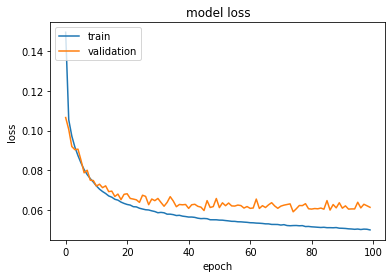

22-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 22)
Model: "functional_209"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_70 (InputLayer)        [(None, 84, 84, 22)]      0         
_________________________________________________________________
conv2d_115 (Conv2D)          (None, 82, 82, 150)       29850     
_________________________________________________________________
conv2d_116 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_117 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_118 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_69 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [72]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

22
Model: "functional_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 3, 3, 3, 22)]     0         
_________________________________________________________________
conv3d_40 (Conv3D)           (None, 1, 1, 1, 150)      89250     
_________________________________________________________________
conv3d_41 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_42 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_43 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_16 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_44 (Conv3D)           (None, 1, 1, 1, 3)   

2022-04-11 17:15:24.161329: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:15:24.161511: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:15:24.494686: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:15:24.513327: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:15:24.513588: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:15:24.514885: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_15_24
2022-04-11 17:15:24.515422: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_15_24/vw.trace.json.gz
2022-04-11 17:15:24.515515: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:15:24.516566: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

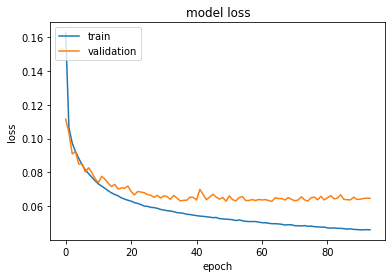

22-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 84, 84, 50, 22)]  0         
_________________________________________________________________
conv3d_45 (Conv3D)           (None, 82, 82, 48, 150)   89250     
_________________________________________________________________
conv3d_46 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_47 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_48 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_17 (Dropout)         (None, 82, 82, 48, 150)   0         
________________________________________________

In [29]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
22input size the ssim score for ndi is: 0.9722246056881805
22input size the ssim score for odi is: 0.9460869691791085
22input size the ssim score for fwf is: 0.9459066397304599
3
conv2d
22input size the ssim score for ndi is: 0.9741274411309849
22input size the ssim score for odi is: 0.9482401196765062
22input size the ssim score for fwf is: 0.9519289735277029
3
conv3d
22input size the ssim score for ndi is: 0.9751334878893313
22input size the ssim score for odi is: 0.9449659126421204
22input size the ssim score for fwf is: 0.9535297211087023


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


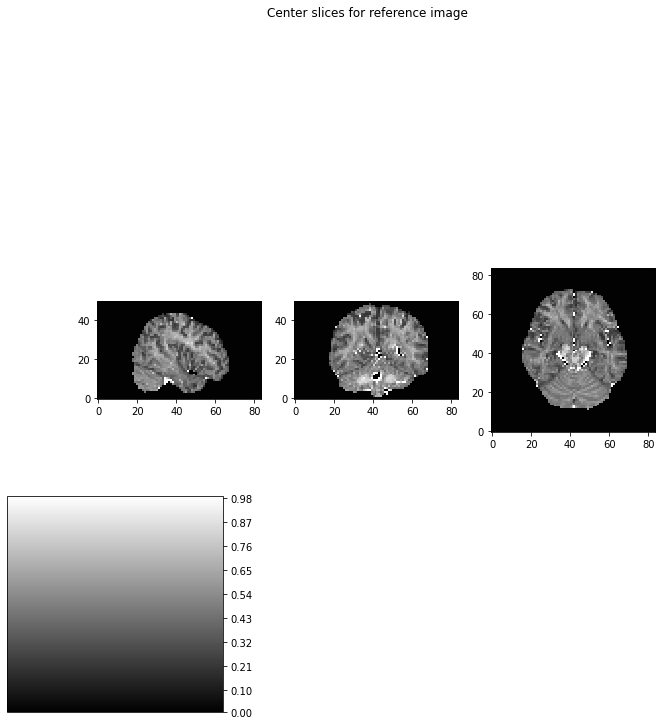

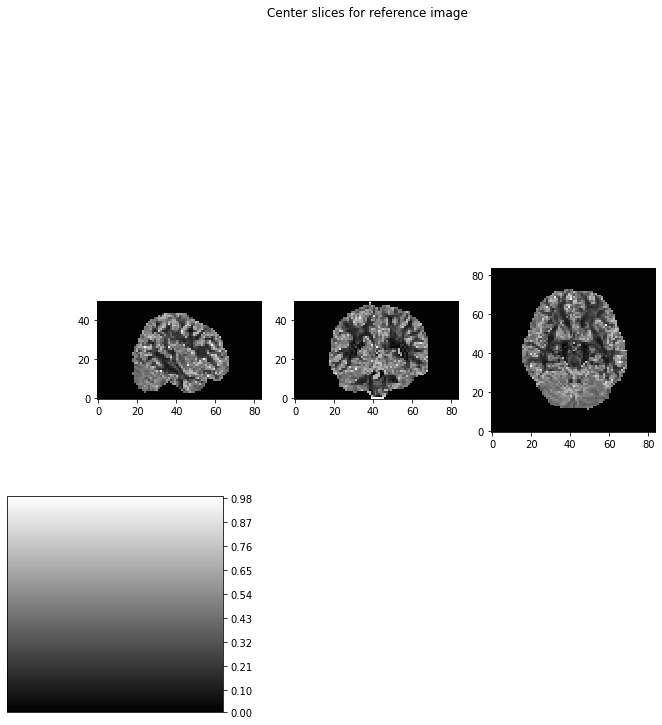

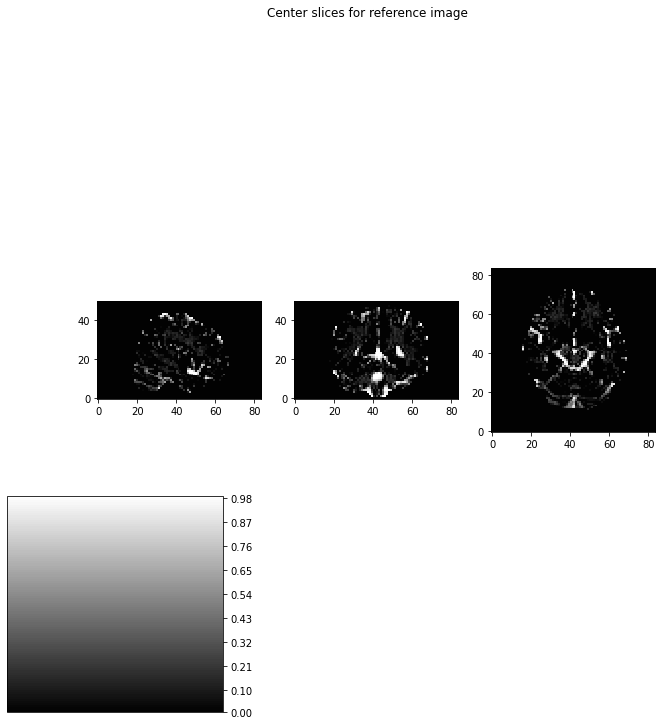

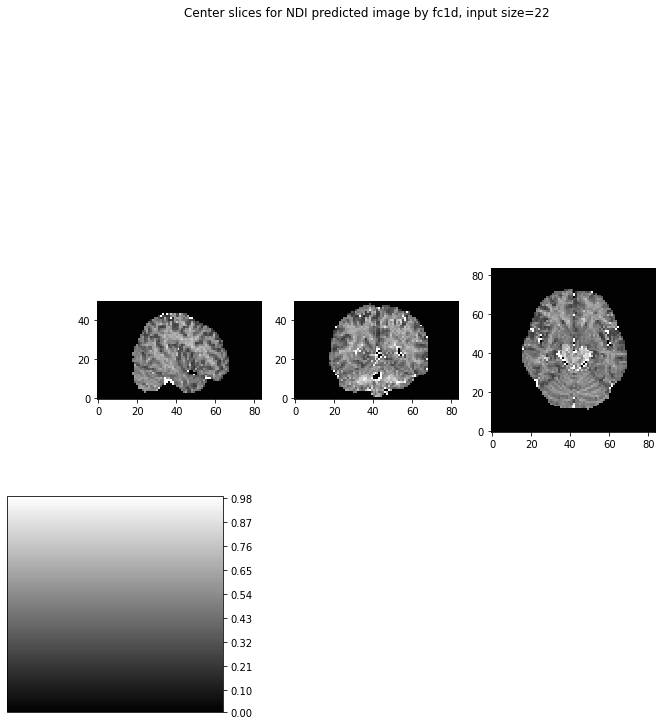

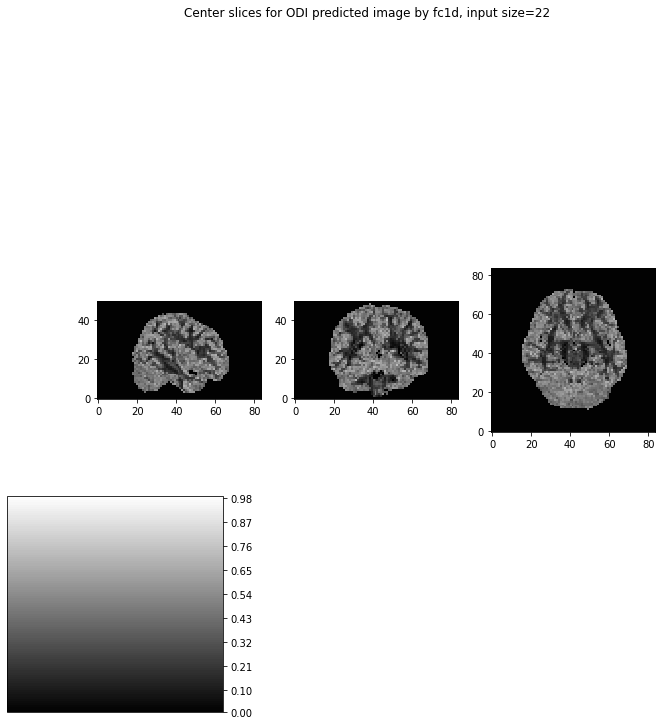

...

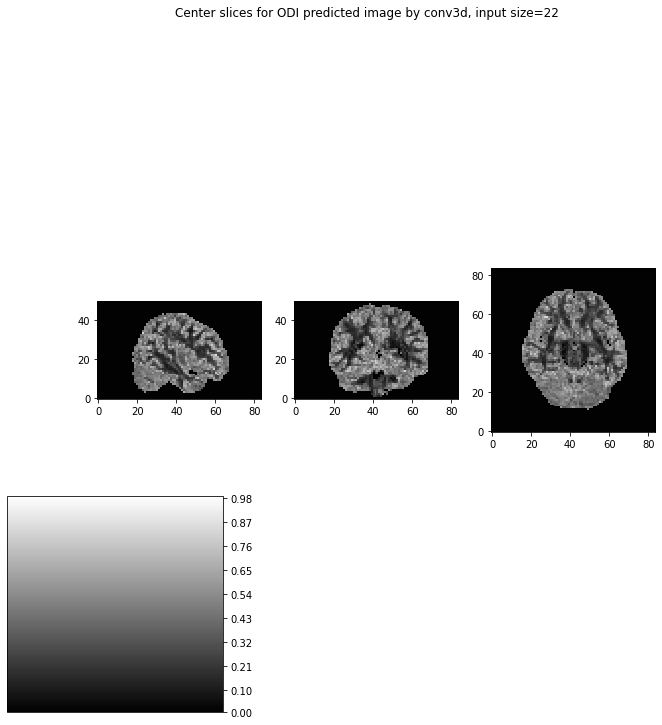

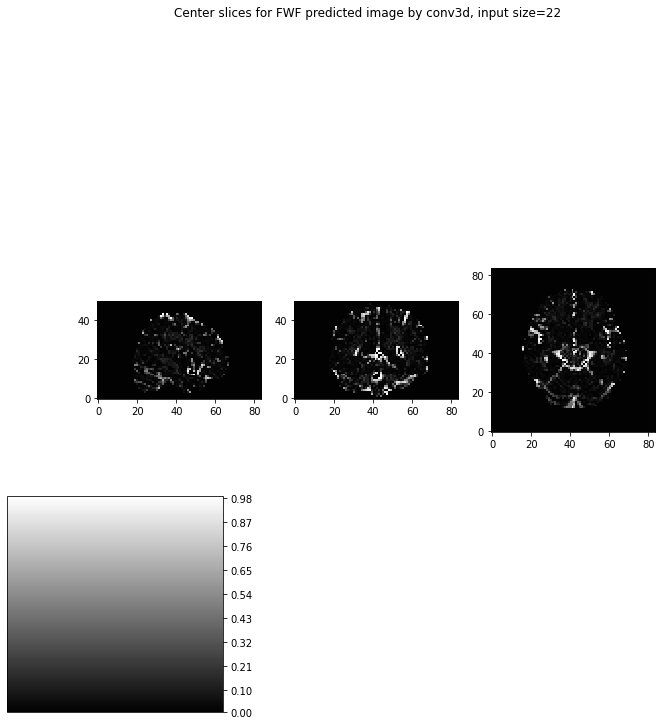

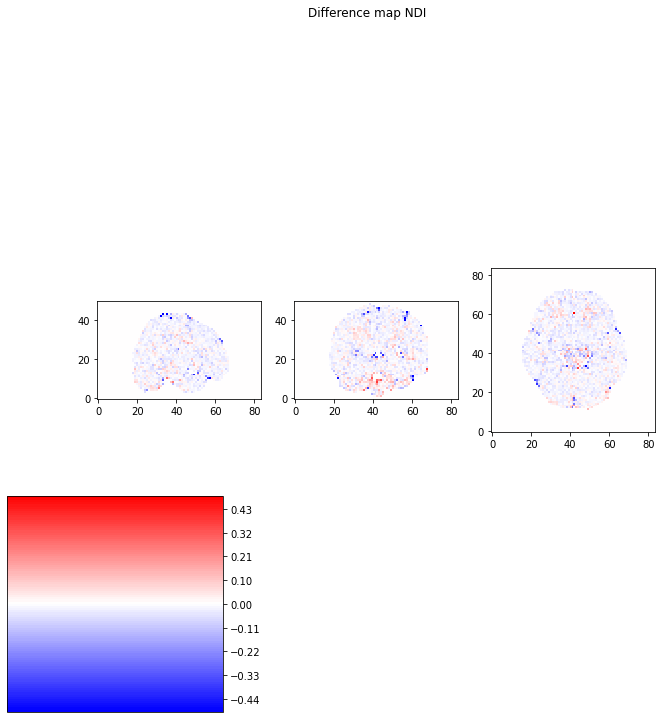

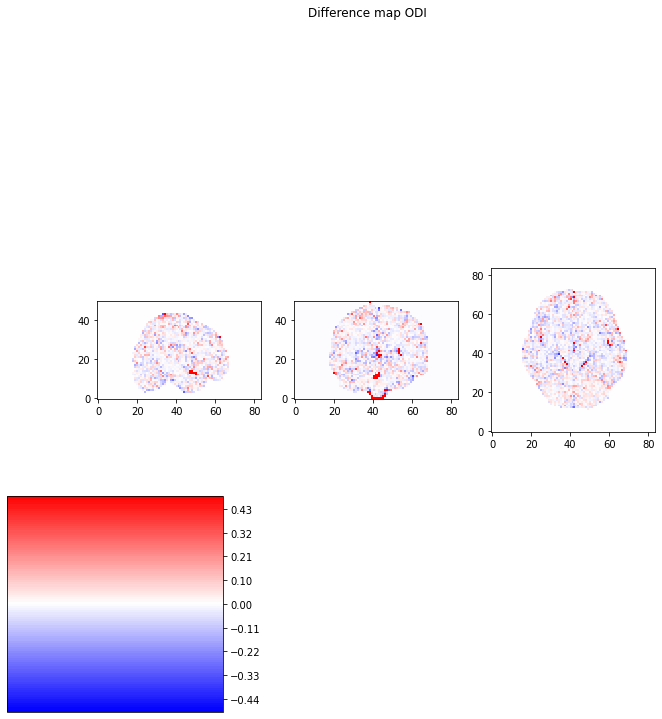

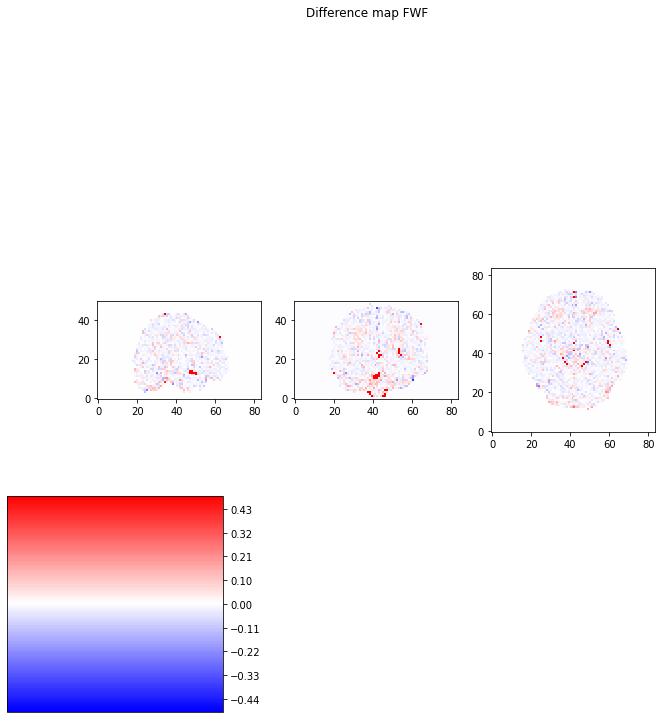

In [74]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 24

In [30]:
dwi = 24

24
Model: "functional_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 24)]              0         
_________________________________________________________________
dense_16 (Dense)             (None, 150)               3750      
_________________________________________________________________
dense_17 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_18 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_19 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_18 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)            

2022-04-11 17:17:24.743715: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:17:24.743942: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:17:24.969732: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:17:24.986247: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:17:24.986496: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:17:24.987731: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_17_24
2022-04-11 17:17:24.988221: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_17_24/vw.trace.json.gz
2022-04-11 17:17:24.988292: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:17:24.989277: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

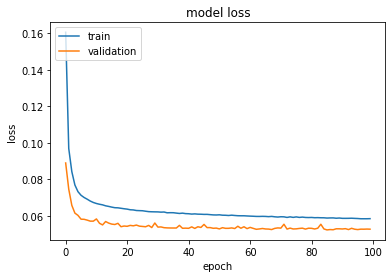

24-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 24)
Model: "functional_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_20 (InputLayer)        [(None, 24)]              0         
_________________________________________________________________
dense_20 (Dense)             (None, 150)               3750      
_________________________________________________________________
dense_21 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_22 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_23 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_19 (Dropout)         (None, 150)               0         
__________________________________________________

In [31]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

24
Model: "functional_79"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        [(None, 3, 3, 24)]        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 1, 1, 150)         32550     
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_26 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 1, 1, 3)      

2022-04-11 17:23:37.917728: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:23:37.917862: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:23:38.212478: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:23:38.231314: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:23:38.231589: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:23:38.233645: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_23_38
2022-04-11 17:23:38.234146: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_23_38/vw.trace.json.gz
2022-04-11 17:23:38.234222: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:23:38.235218: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

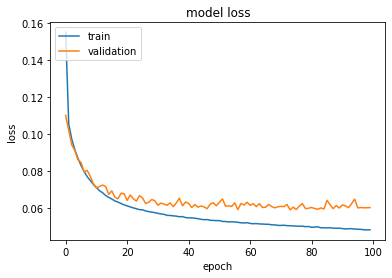

24-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 24)
Model: "functional_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_28 (InputLayer)        [(None, 84, 84, 24)]      0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 82, 82, 150)       32550     
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_27 (Dropout)         (None, 82, 82, 150)       0         
________________________________________________

In [35]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

24
Model: "functional_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_29 (InputLayer)        [(None, 3, 3, 3, 24)]     0         
_________________________________________________________________
conv3d_80 (Conv3D)           (None, 1, 1, 1, 150)      97350     
_________________________________________________________________
conv3d_81 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_82 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_83 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_28 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_84 (Conv3D)           (None, 1, 1, 1, 3)   

2022-04-11 17:25:02.297121: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:25:02.297249: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:25:02.980510: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:25:03.004242: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:25:03.004533: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:25:03.006286: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_25_03
2022-04-11 17:25:03.006838: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_25_03/vw.trace.json.gz
2022-04-11 17:25:03.006921: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:25:03.008033: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

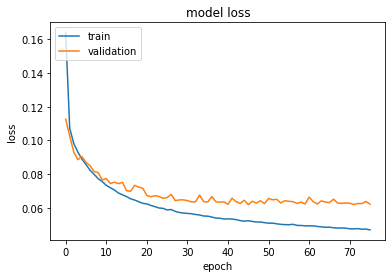

24-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_30 (InputLayer)        [(None, 84, 84, 50, 24)]  0         
_________________________________________________________________
conv3d_85 (Conv3D)           (None, 82, 82, 48, 150)   97350     
_________________________________________________________________
conv3d_86 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_87 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_88 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_29 (Dropout)         (None, 82, 82, 48, 150)   0         
________________________________________________

In [36]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
24input size the ssim score for ndi is: 0.9737936935980028
24input size the ssim score for odi is: 0.948886037346952
24input size the ssim score for fwf is: 0.9445441763130092
3
conv2d
24input size the ssim score for ndi is: 0.9758371509074725
24input size the ssim score for odi is: 0.9491000467062916
24input size the ssim score for fwf is: 0.9480377808631661
3
conv3d
24input size the ssim score for ndi is: 0.9761742445593211
24input size the ssim score for odi is: 0.9481991175341479
24input size the ssim score for fwf is: 0.9543016492288272


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


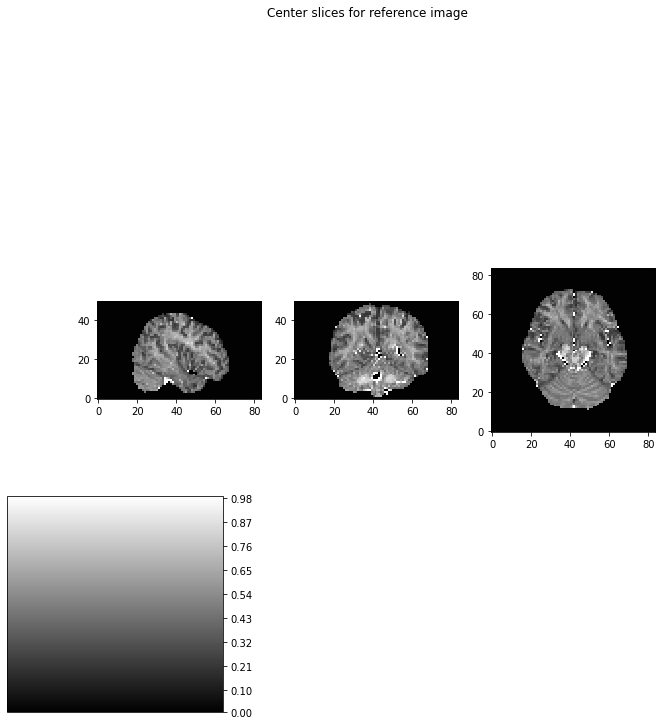

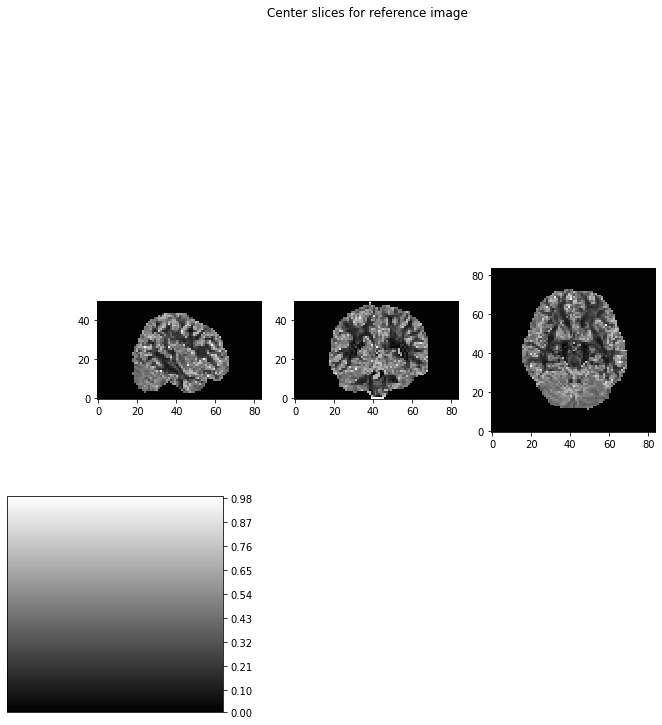

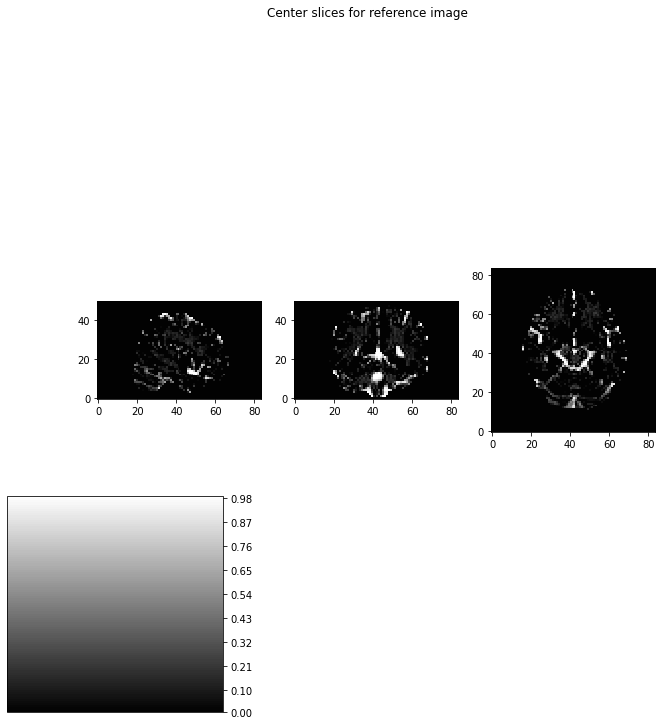

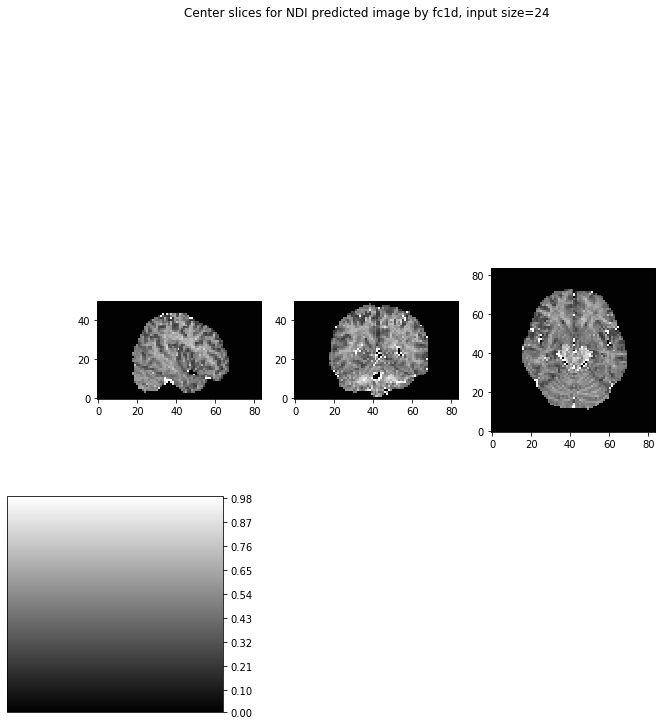

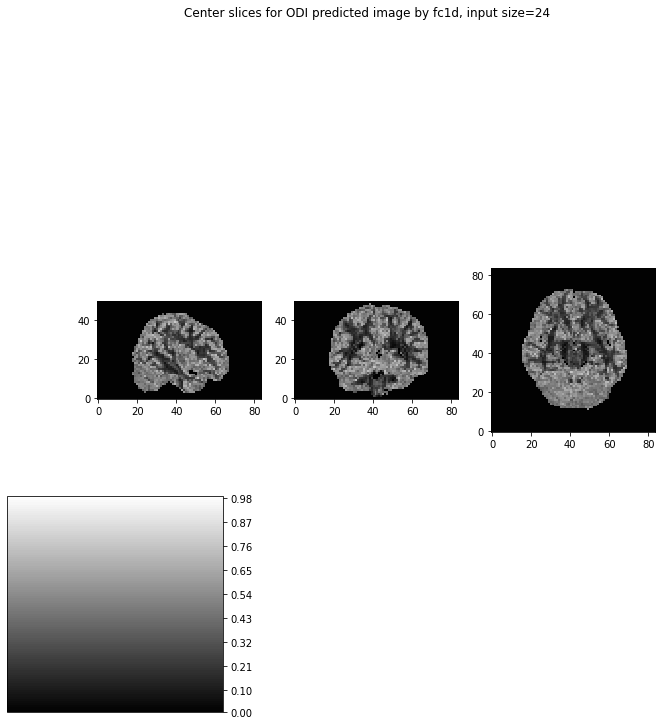

...

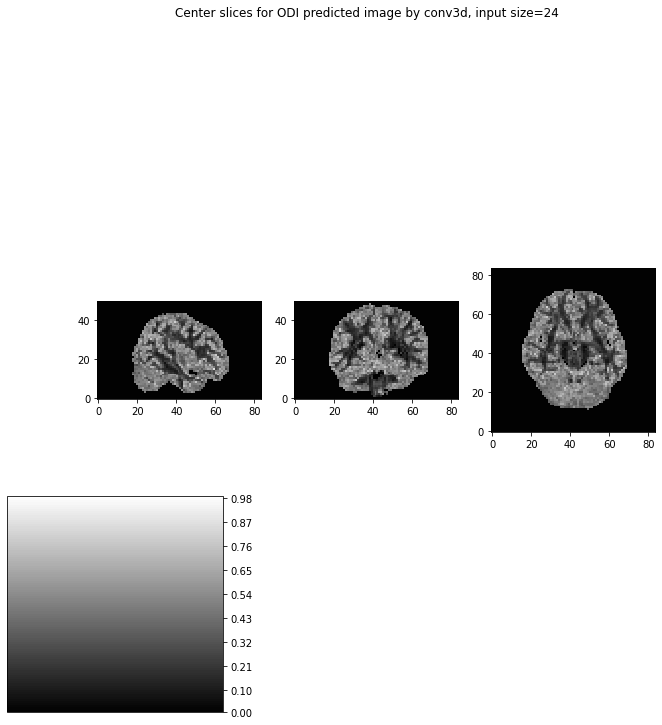

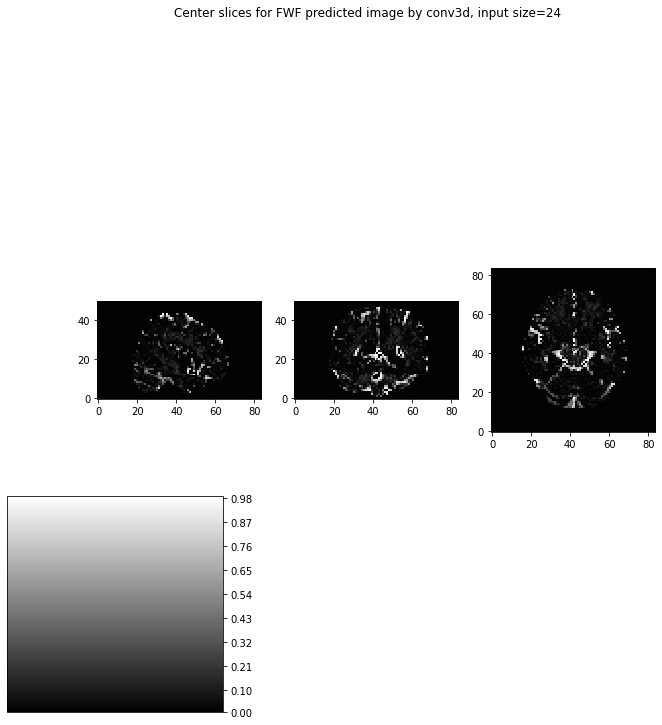

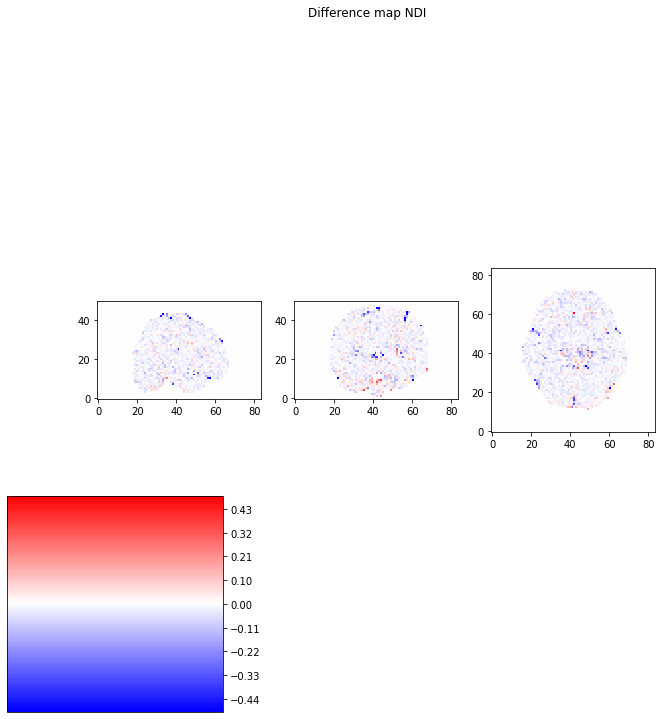

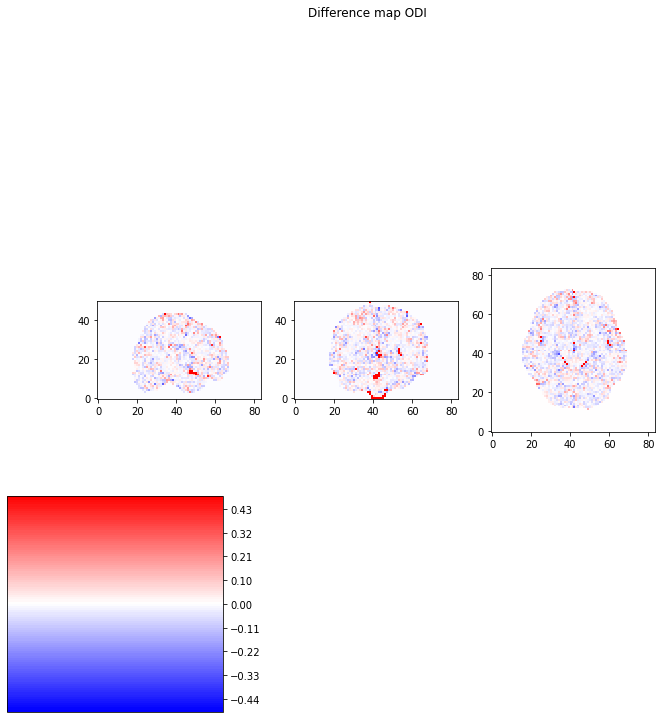

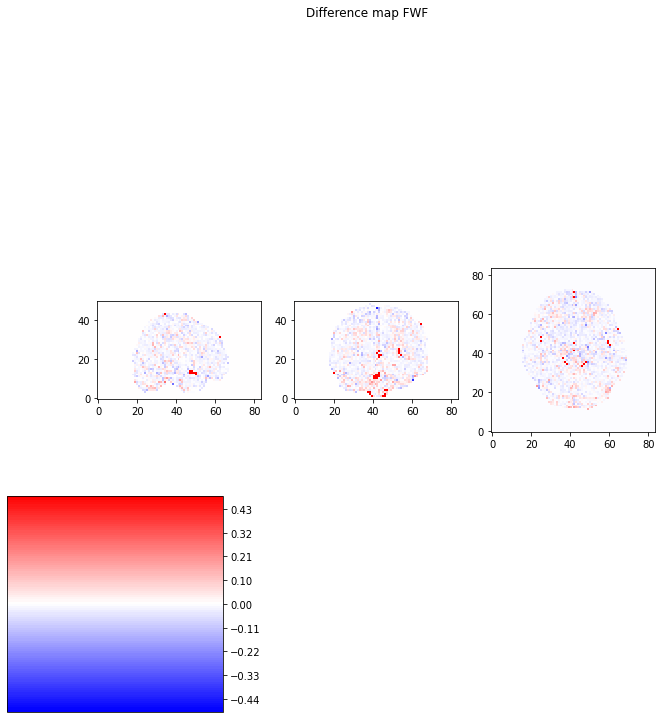

In [37]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 26

In [38]:
dwi = 26

26
Model: "functional_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 26)]              0         
_________________________________________________________________
dense_24 (Dense)             (None, 150)               4050      
_________________________________________________________________
dense_25 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_26 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_27 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_30 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)            

2022-04-11 17:26:53.118238: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:26:53.118324: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:26:53.371875: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:26:53.391101: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:26:53.391363: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:26:53.392734: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_26_53
2022-04-11 17:26:53.393252: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_26_53/vw.trace.json.gz
2022-04-11 17:26:53.393330: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:26:53.394357: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

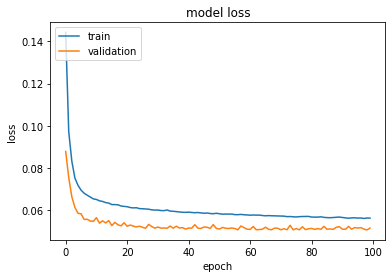

26-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 26)
Model: "functional_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_32 (InputLayer)        [(None, 26)]              0         
_________________________________________________________________
dense_28 (Dense)             (None, 150)               4050      
_________________________________________________________________
dense_29 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_30 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_31 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_31 (Dropout)         (None, 150)               0         
__________________________________________________

In [39]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

26
Model: "functional_97"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_33 (InputLayer)        [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_32 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 1, 1, 3)      

2022-04-11 17:27:54.306021: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:27:54.306131: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:27:54.619712: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:27:54.641434: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:27:54.641710: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:27:54.643019: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_27_54
2022-04-11 17:27:54.643542: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_27_54/vw.trace.json.gz
2022-04-11 17:27:54.643621: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:27:54.644619: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

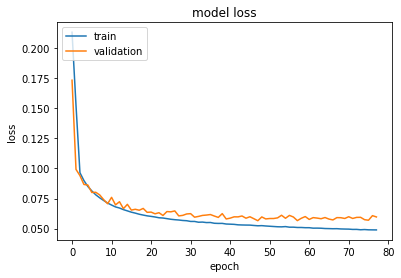

26-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 26)
Model: "functional_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        [(None, 84, 84, 26)]      0         
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 82, 82, 150)       35250     
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_33 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [40]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

26
Model: "functional_103"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_90 (Conv3D)           (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_91 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_92 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_93 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_34 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_94 (Conv3D)           (None, 1, 1, 1, 3)  

2022-04-11 17:29:12.147598: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:29:12.147849: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:29:12.527938: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:29:12.546929: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:29:12.547186: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:29:12.548497: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_29_12
2022-04-11 17:29:12.549020: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_29_12/vw.trace.json.gz
2022-04-11 17:29:12.549086: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:29:12.550117: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

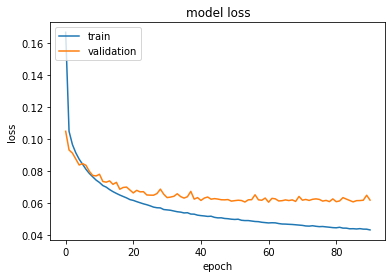

26-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_107"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_36 (InputLayer)        [(None, 84, 84, 50, 26)]  0         
_________________________________________________________________
conv3d_95 (Conv3D)           (None, 82, 82, 48, 150)   105450    
_________________________________________________________________
conv3d_96 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_97 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_98 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_35 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________

In [41]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
26input size the ssim score for ndi is: 0.9735936545021202
26input size the ssim score for odi is: 0.9507994639327368
26input size the ssim score for fwf is: 0.9495482608286071
3
conv2d
26input size the ssim score for ndi is: 0.9746681071572685
26input size the ssim score for odi is: 0.9500138303335156
26input size the ssim score for fwf is: 0.9462526339901586
3
conv3d
26input size the ssim score for ndi is: 0.9769579342587086
26input size the ssim score for odi is: 0.948765489558584
26input size the ssim score for fwf is: 0.951603590017526


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


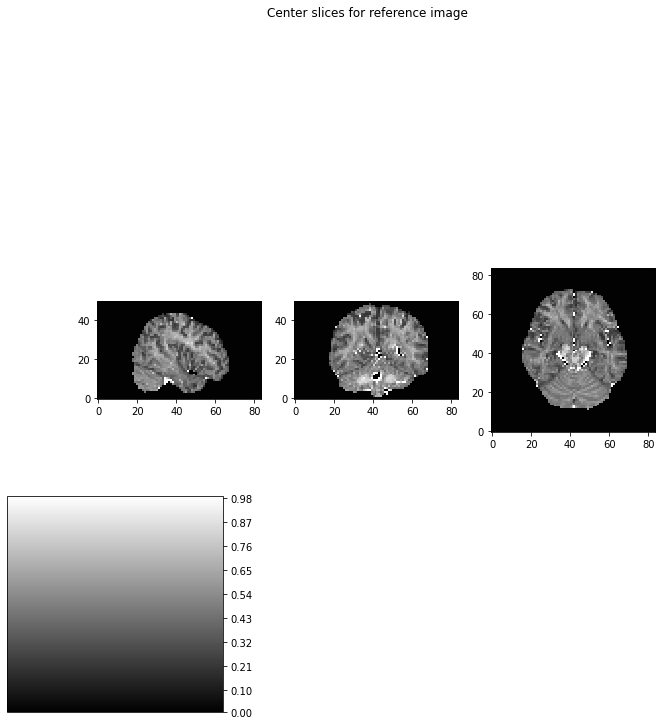

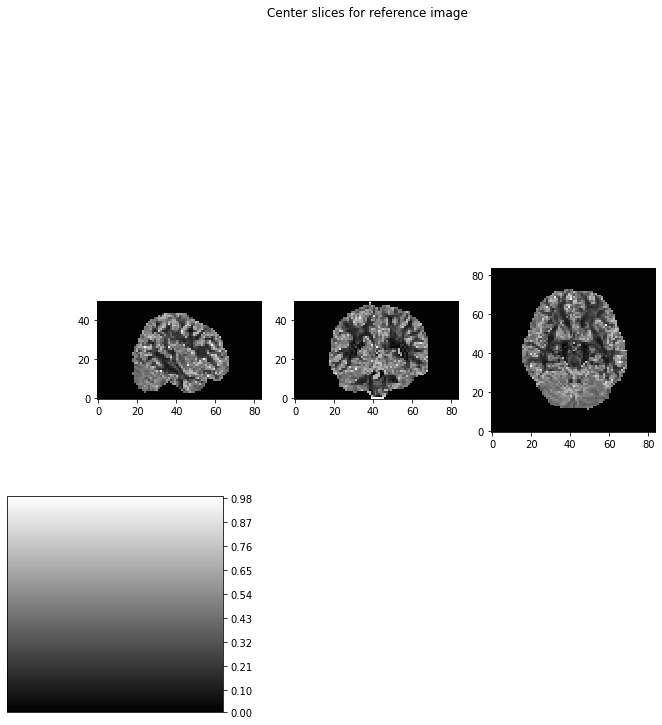

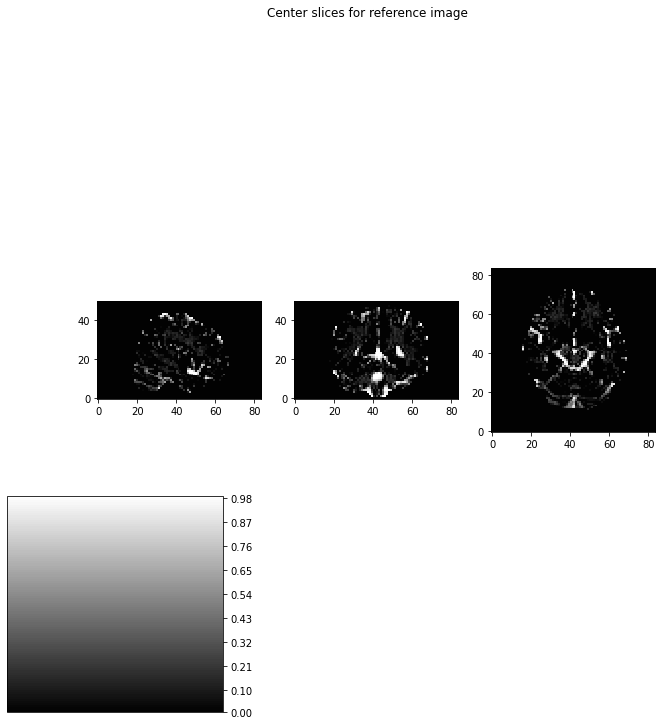

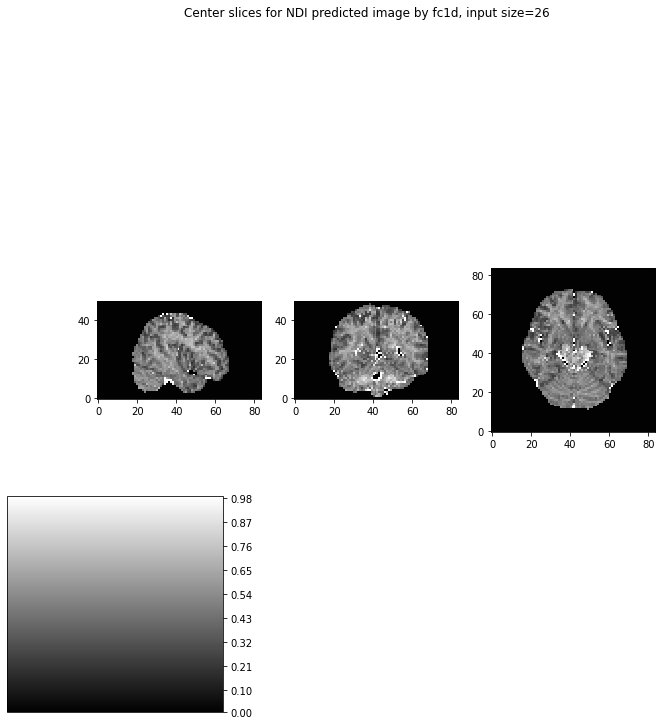

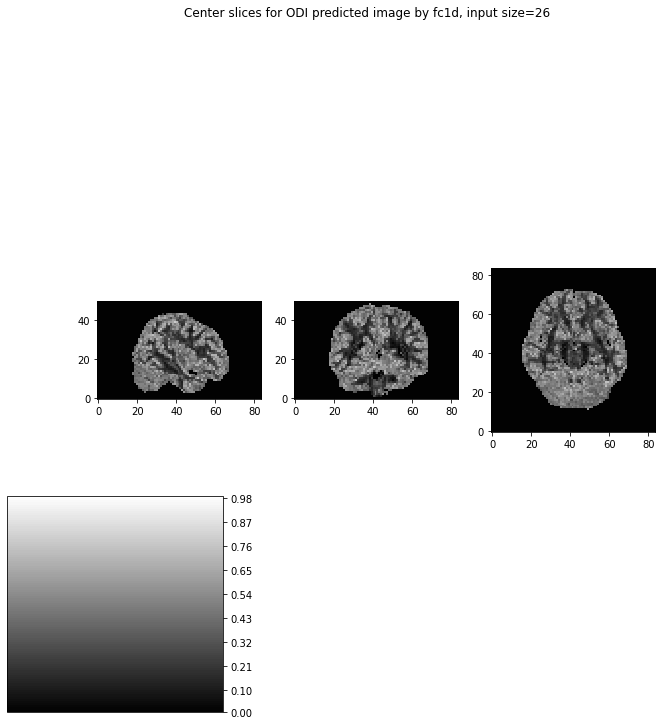

...

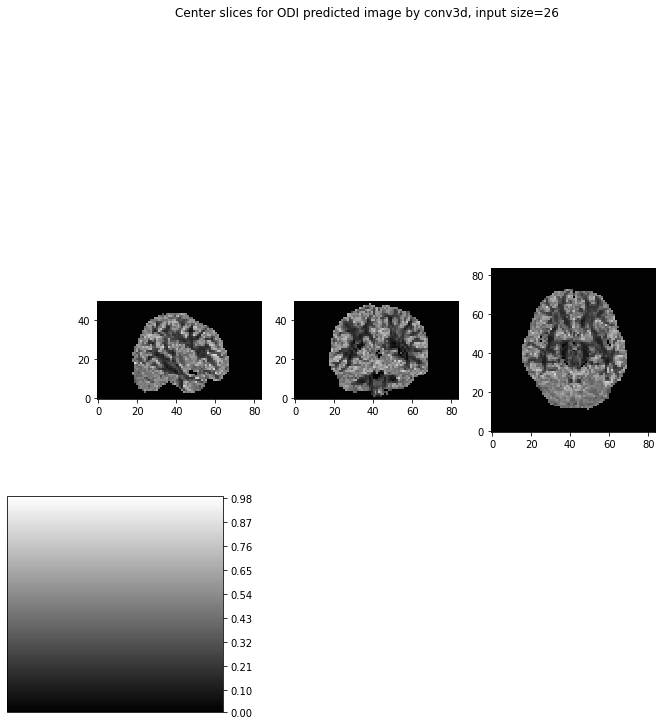

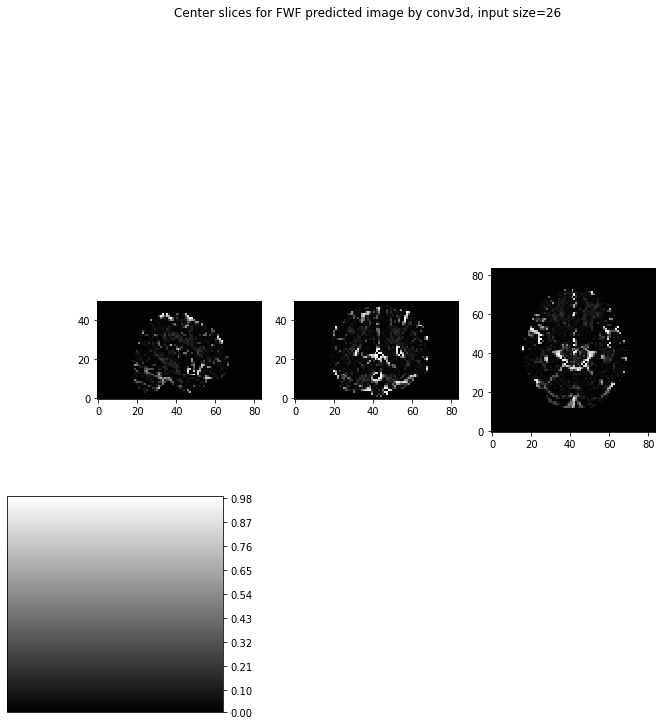

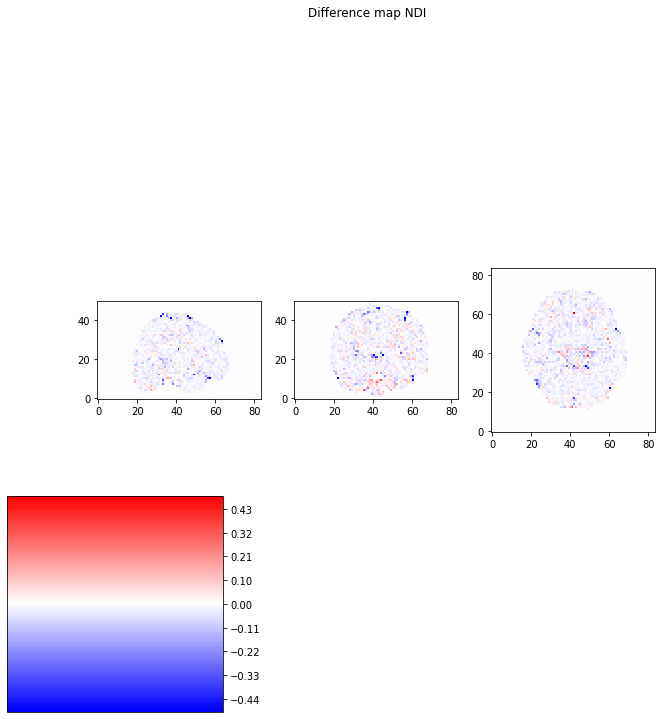

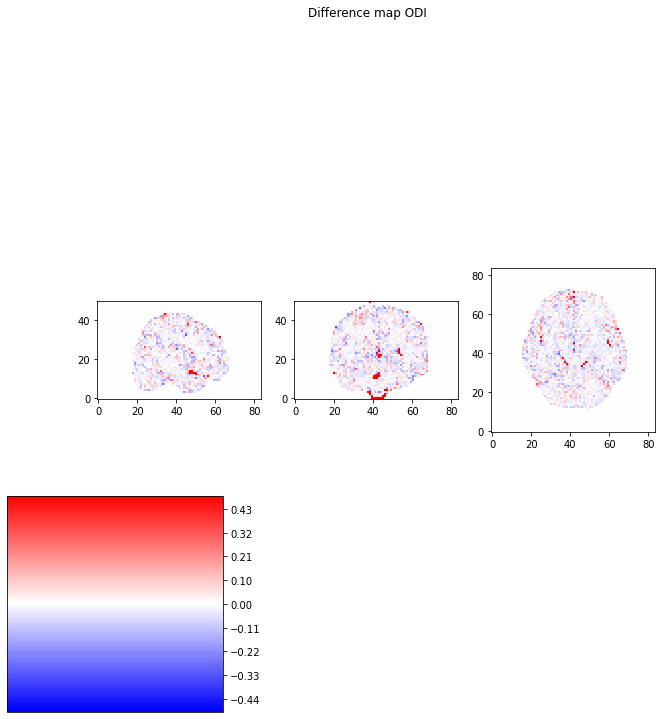

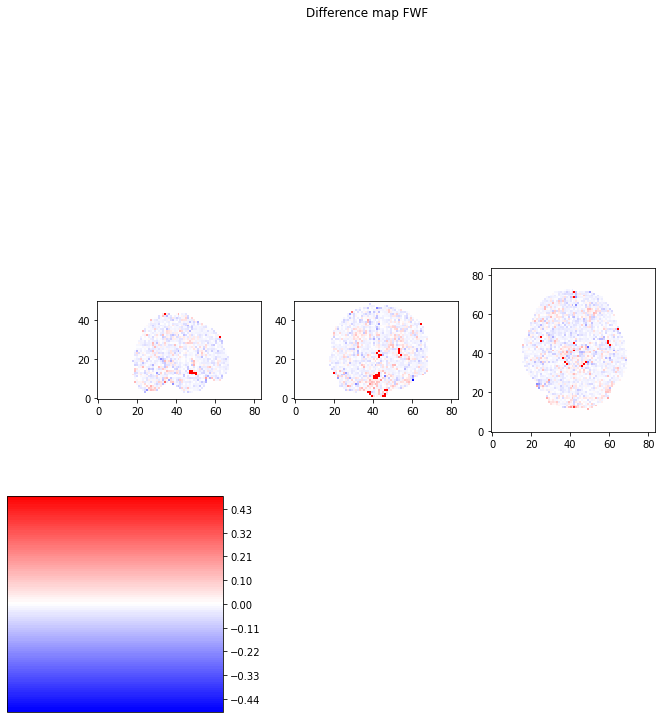

In [42]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 36

In [43]:
dwi = 36

36
Model: "functional_109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_37 (InputLayer)        [(None, 36)]              0         
_________________________________________________________________
dense_32 (Dense)             (None, 150)               5550      
_________________________________________________________________
dense_33 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_34 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_35 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_36 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-11 17:31:05.129467: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:31:05.129548: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:31:05.414203: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:31:05.432966: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:31:05.433210: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:31:05.434512: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_31_05
2022-04-11 17:31:05.435016: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_31_05/vw.trace.json.gz
2022-04-11 17:31:05.435107: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:31:05.436158: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

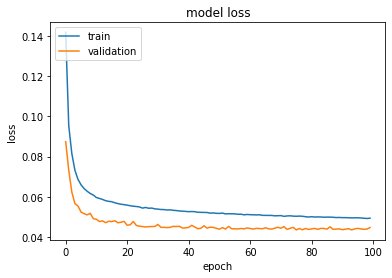

36-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 36)
Model: "functional_113"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_38 (InputLayer)        [(None, 36)]              0         
_________________________________________________________________
dense_36 (Dense)             (None, 150)               5550      
_________________________________________________________________
dense_37 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_38 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_39 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_37 (Dropout)         (None, 150)               0         
_________________________________________________

In [44]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

36
Model: "functional_115"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_39 (InputLayer)        [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_40 (Conv2D)           (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_38 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 1, 1, 3)     

2022-04-11 17:32:04.358704: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:32:04.358830: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:32:04.706067: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:32:04.727605: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:32:04.727870: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:32:04.729839: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_32_04
2022-04-11 17:32:04.730749: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_32_04/vw.trace.json.gz
2022-04-11 17:32:04.730869: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:32:04.731903: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

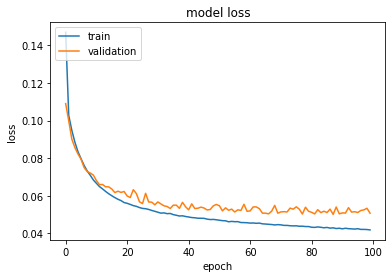

36-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 36)
Model: "functional_119"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_40 (InputLayer)        [(None, 84, 84, 36)]      0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 82, 82, 150)       48750     
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_39 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [45]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

36
Model: "functional_127"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_43 (InputLayer)        [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_110 (Conv3D)          (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_111 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_112 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_113 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_42 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_114 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-11 17:41:41.455294: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:41:41.455408: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:41:41.891023: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:41:41.910418: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:41:41.910740: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:41:41.912911: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_41_41
2022-04-11 17:41:41.913719: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_41_41/vw.trace.json.gz
2022-04-11 17:41:41.913864: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:41:41.915553: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

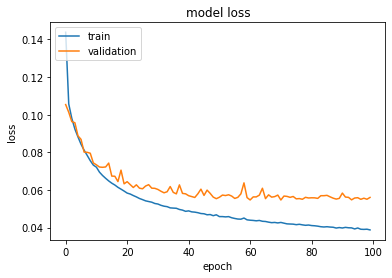

36-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_131"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_44 (InputLayer)        [(None, 84, 84, 50, 36)]  0         
_________________________________________________________________
conv3d_115 (Conv3D)          (None, 82, 82, 48, 150)   145950    
_________________________________________________________________
conv3d_116 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_117 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_118 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_43 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________

In [47]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
36input size the ssim score for ndi is: 0.9778540527442471
36input size the ssim score for odi is: 0.9541320718479308
36input size the ssim score for fwf is: 0.9521799791619093
3
conv2d
36input size the ssim score for ndi is: 0.978378721031373
36input size the ssim score for odi is: 0.9541668090509756
36input size the ssim score for fwf is: 0.951089488000915
3
conv3d
36input size the ssim score for ndi is: 0.9780241403873416
36input size the ssim score for odi is: 0.9518075608464254
36input size the ssim score for fwf is: 0.95382449683794


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


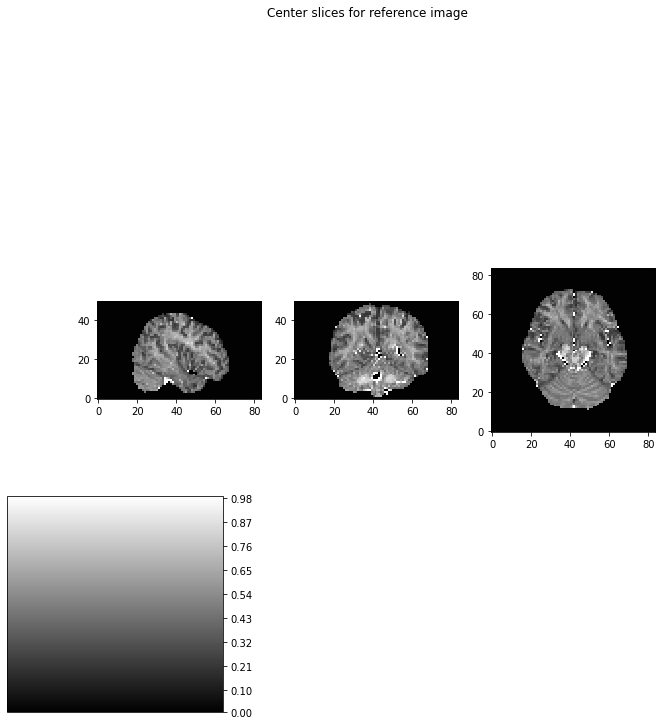

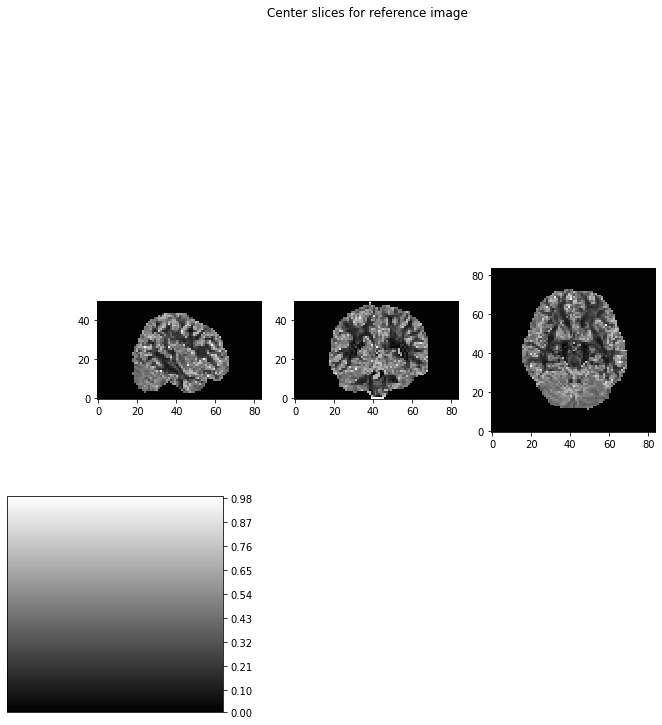

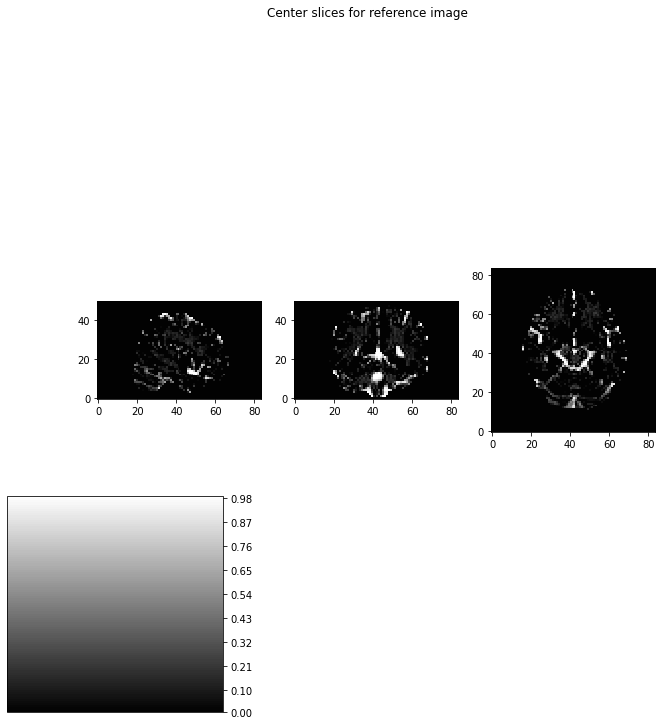

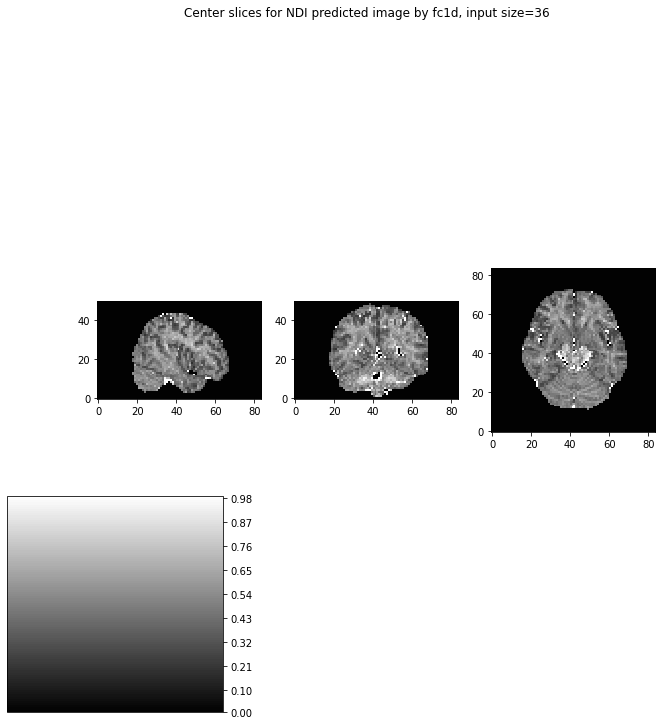

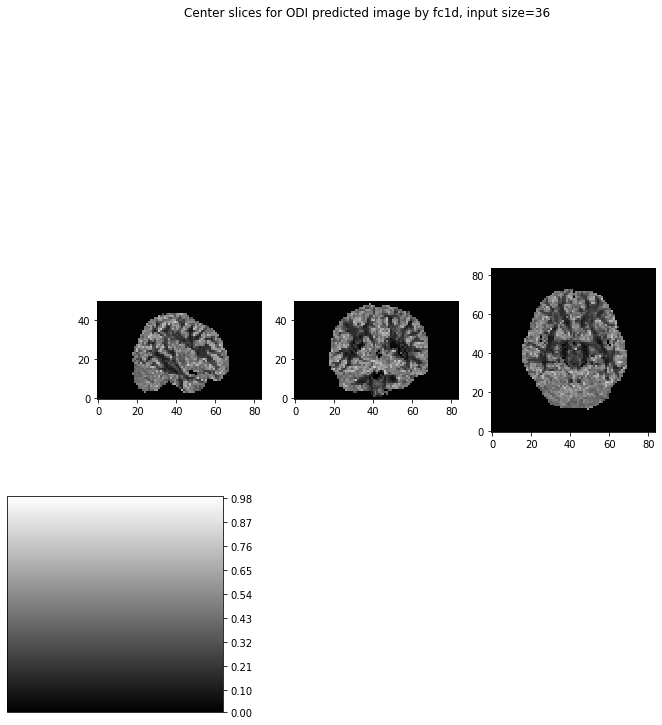

...

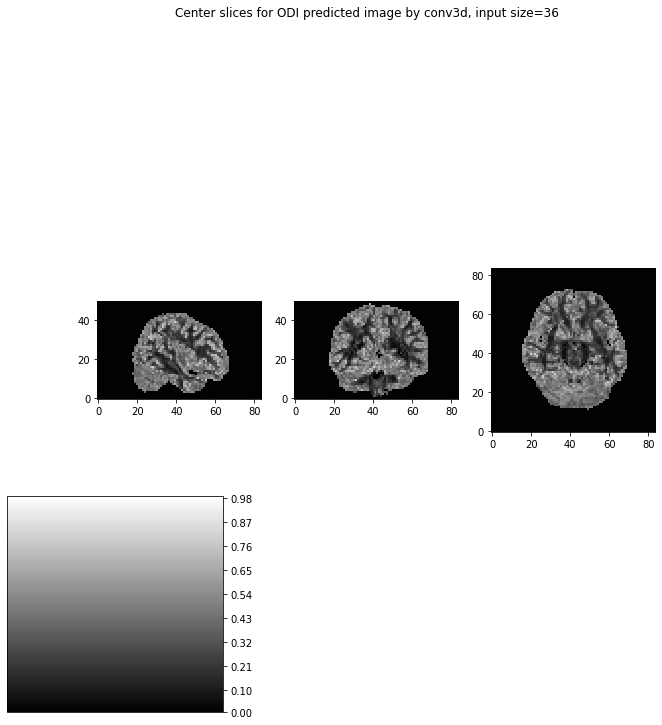

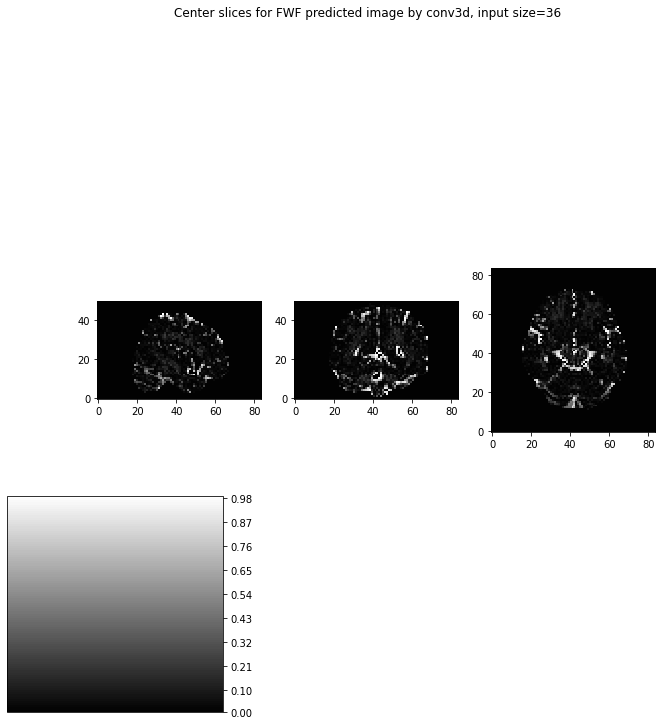

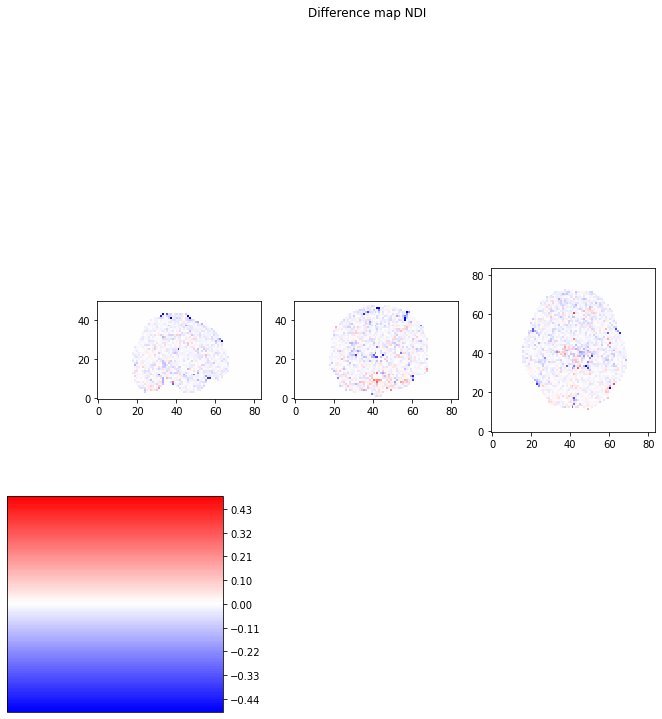

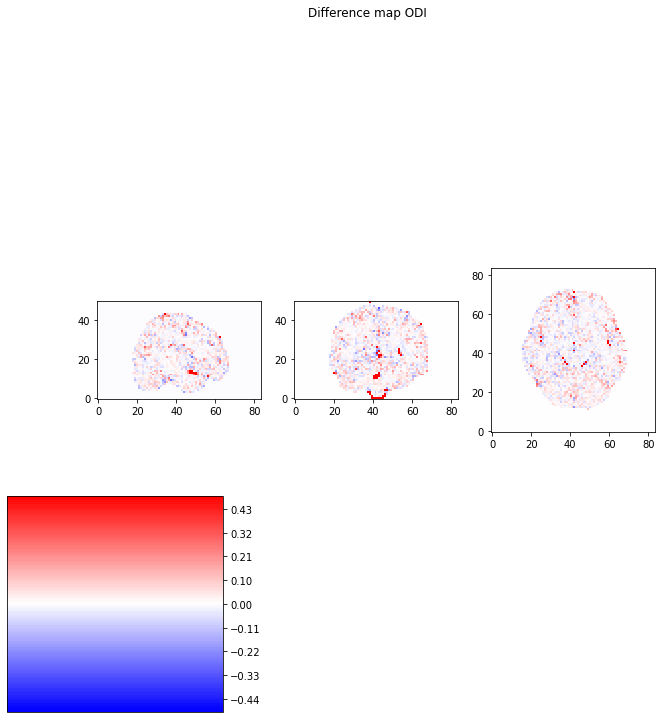

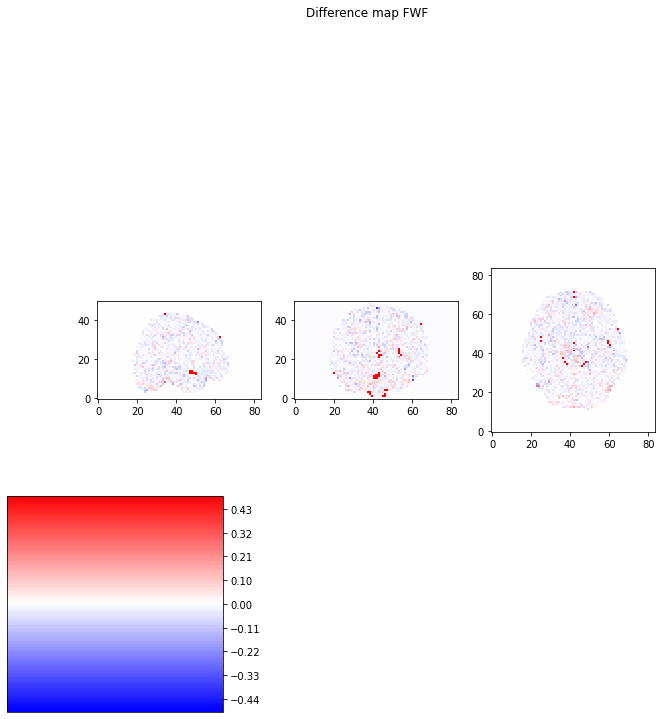

In [48]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 46

In [49]:
dwi = 46

46
Model: "functional_145"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_49 (InputLayer)        [(None, 46)]              0         
_________________________________________________________________
dense_40 (Dense)             (None, 150)               7050      
_________________________________________________________________
dense_41 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_42 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_43 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_48 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-11 17:46:56.291065: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:46:56.291147: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:46:56.573969: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:46:56.590927: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:46:56.591182: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:46:56.592495: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_46_56
2022-04-11 17:46:56.593020: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_46_56/vw.trace.json.gz
2022-04-11 17:46:56.593086: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:46:56.594103: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

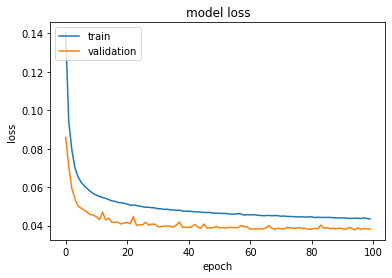

46-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 46)
Model: "functional_149"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_50 (InputLayer)        [(None, 46)]              0         
_________________________________________________________________
dense_44 (Dense)             (None, 150)               7050      
_________________________________________________________________
dense_45 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_46 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_47 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_49 (Dropout)         (None, 150)               0         
_________________________________________________

In [52]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

46
Model: "functional_139"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_47 (InputLayer)        [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_46 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_64 (Conv2D)           (None, 1, 1, 3)     

2022-04-11 17:45:30.661625: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:45:30.661732: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:45:31.047306: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:45:31.066884: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:45:31.067135: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:45:31.069205: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_45_31
2022-04-11 17:45:31.069730: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_45_31/vw.trace.json.gz
2022-04-11 17:45:31.069803: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:45:31.070830: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

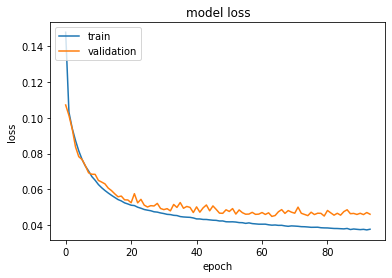

46-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 46)
Model: "functional_143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_48 (InputLayer)        [(None, 84, 84, 46)]      0         
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 82, 82, 150)       62250     
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_47 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [51]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

46
Model: "functional_163"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_55 (InputLayer)        [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_140 (Conv3D)          (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_141 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_142 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_143 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_54 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_144 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-11 17:52:29.807745: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:52:29.807851: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:52:30.312866: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:52:30.333188: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:52:30.333486: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:52:30.334836: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_52_30
2022-04-11 17:52:30.335372: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_52_30/vw.trace.json.gz
2022-04-11 17:52:30.335450: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:52:30.336489: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

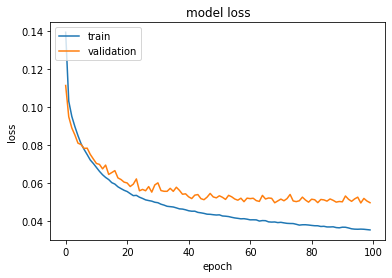

46-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_167"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_56 (InputLayer)        [(None, 84, 84, 50, 46)]  0         
_________________________________________________________________
conv3d_145 (Conv3D)          (None, 82, 82, 48, 150)   186450    
_________________________________________________________________
conv3d_146 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_147 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_148 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_55 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________

In [55]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
46input size the ssim score for ndi is: 0.9794825006721248
46input size the ssim score for odi is: 0.9577476936303722
46input size the ssim score for fwf is: 0.9499939205926385
3
conv2d
46input size the ssim score for ndi is: 0.979142839582723
46input size the ssim score for odi is: 0.9573308868667674
46input size the ssim score for fwf is: 0.9548754807852562
3
conv3d
46input size the ssim score for ndi is: 0.980603057338973
46input size the ssim score for odi is: 0.9558917069269053
46input size the ssim score for fwf is: 0.9572425145821909


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


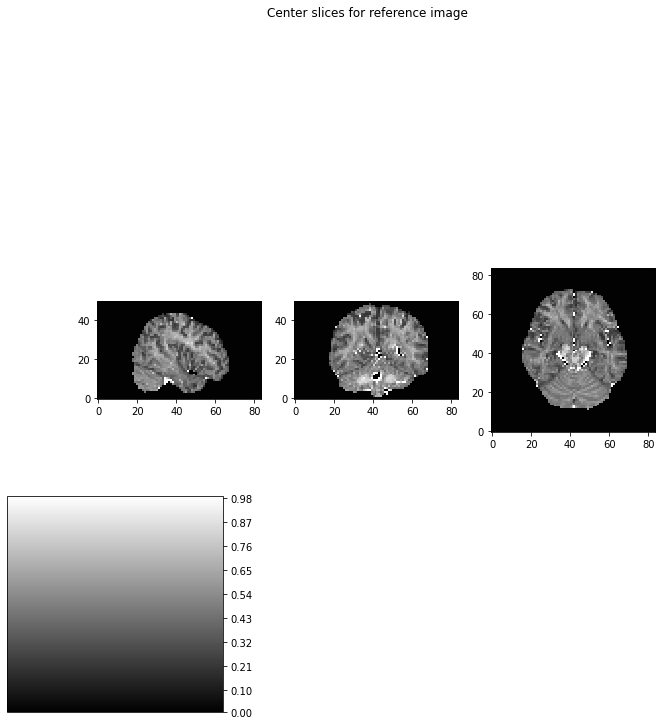

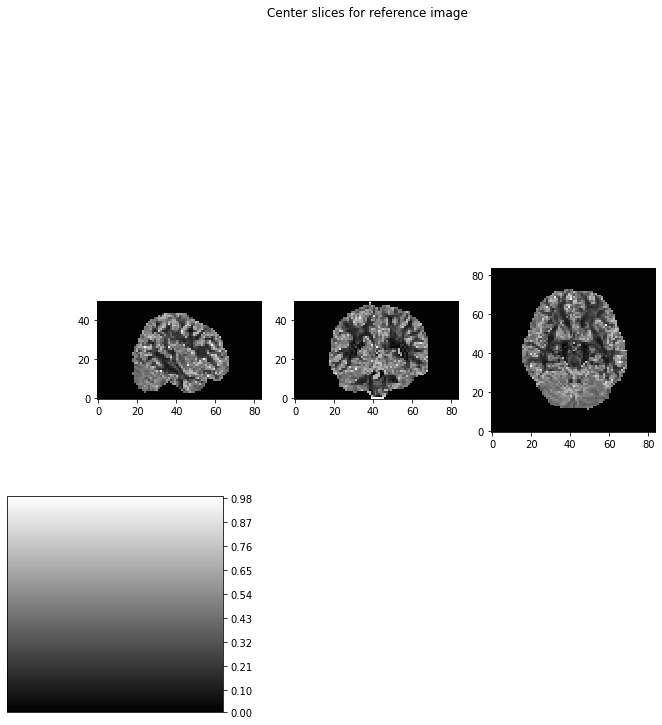

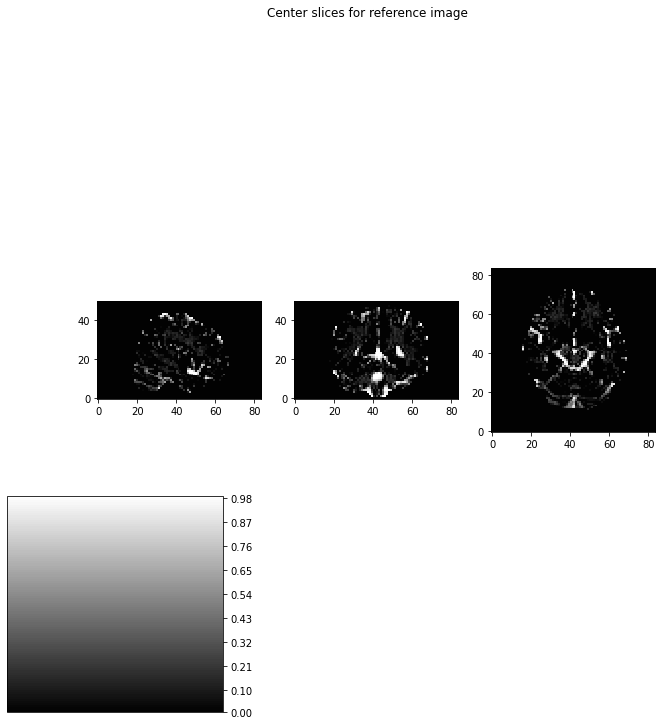

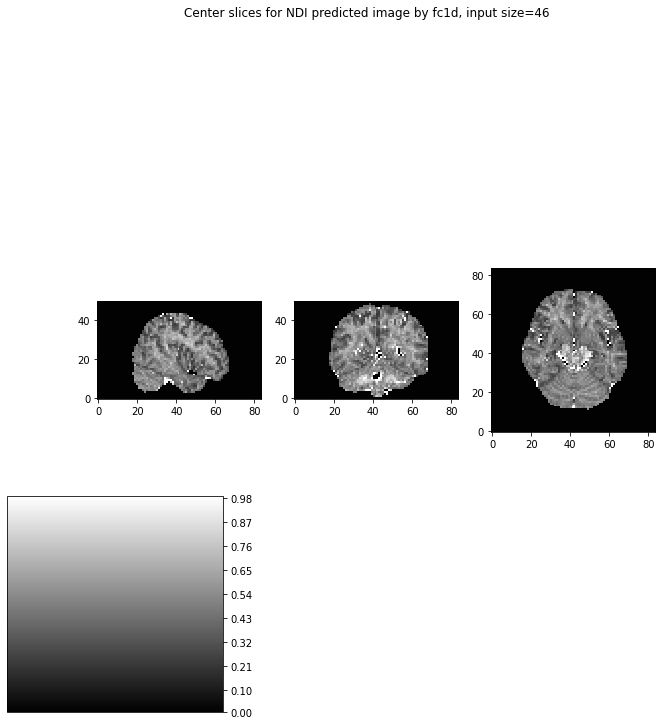

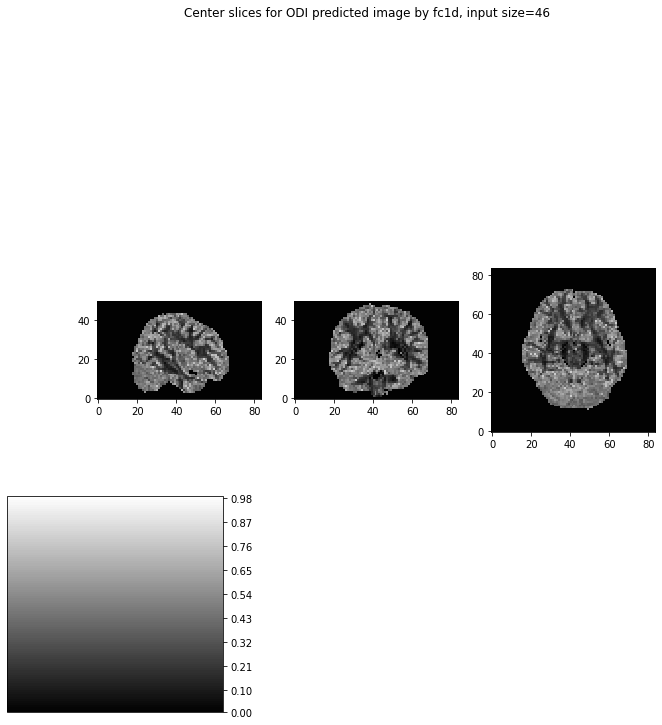

...

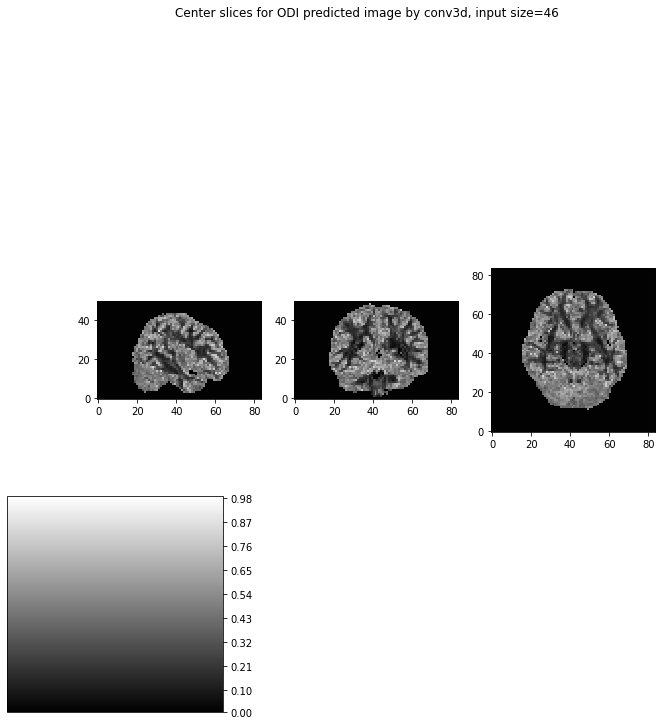

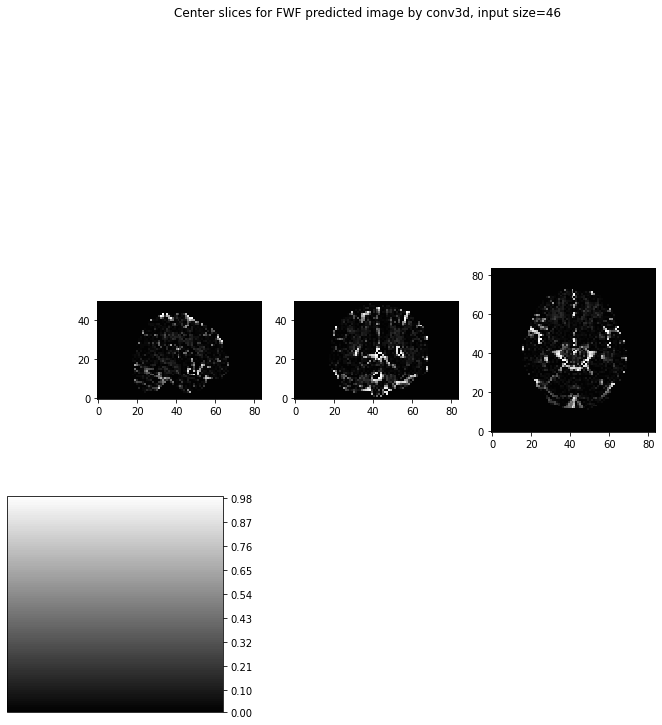

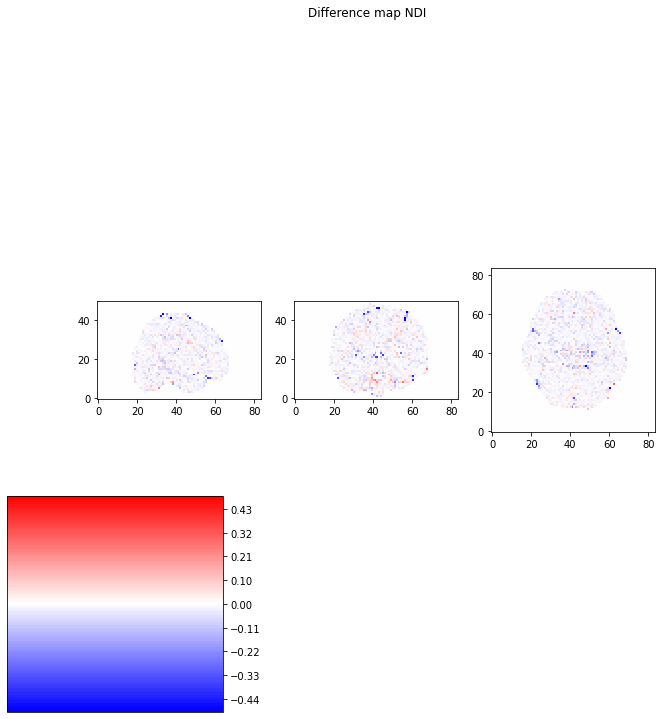

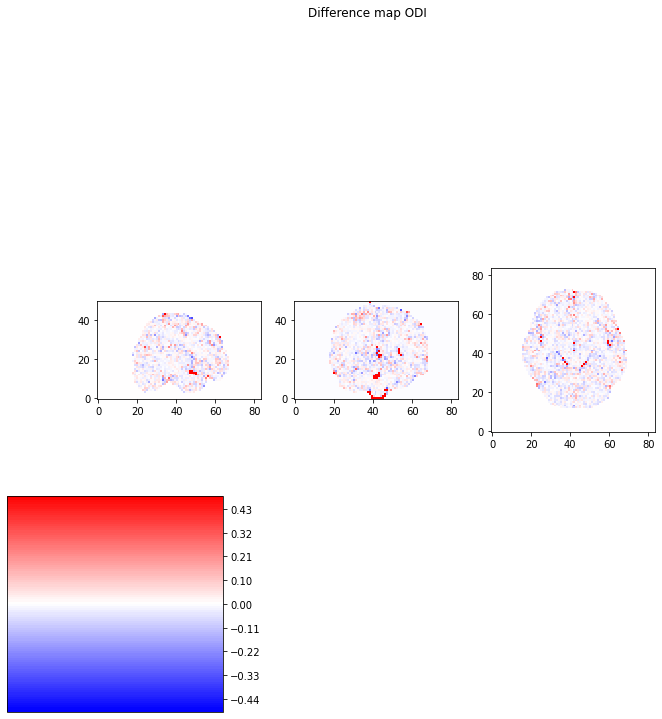

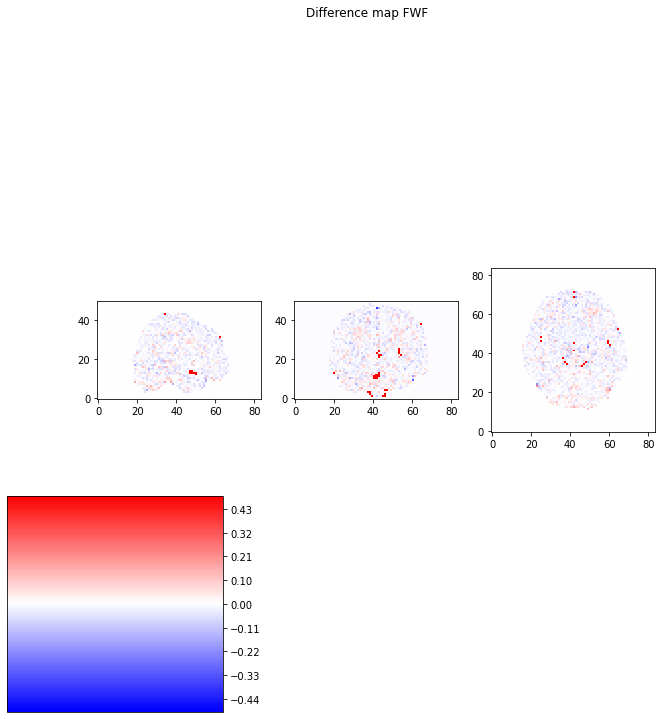

In [56]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 56

In [95]:
dwi = 56

56
Model: "functional_289"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_97 (InputLayer)        [(None, 56)]              0         
_________________________________________________________________
dense_128 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_129 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_130 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_131 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_96 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 22:18:52.104434: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:18:52.104540: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:18:52.518376: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:18:52.542824: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:18:52.543125: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:18:52.544464: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_18_52
2022-04-09 22:18:52.544977: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_18_52/vw.trace.json.gz
2022-04-09 22:18:52.545051: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:18:52.546067: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

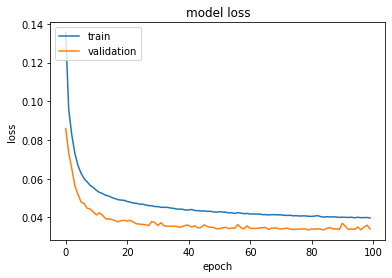

56-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 56)
Model: "functional_293"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_98 (InputLayer)        [(None, 56)]              0         
_________________________________________________________________
dense_132 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_133 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_134 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_135 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_97 (Dropout)         (None, 150)               0         
_________________________________________________

In [96]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

56
Model: "functional_295"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_99 (InputLayer)        [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_160 (Conv2D)          (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_161 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_162 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_163 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_98 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_164 (Conv2D)          (None, 1, 1, 3)     

2022-04-09 22:19:41.721461: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:19:41.721543: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:19:42.248640: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:19:42.272725: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:19:42.272993: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:19:42.274329: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_19_42
2022-04-09 22:19:42.274856: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_19_42/vw.trace.json.gz
2022-04-09 22:19:42.274933: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:19:42.275979: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

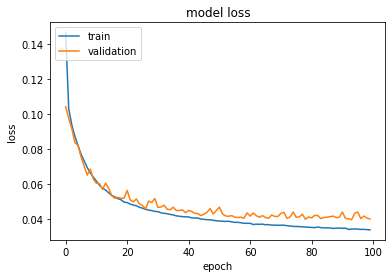

56-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 56)
Model: "functional_299"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_100 (InputLayer)       [(None, 84, 84, 56)]      0         
_________________________________________________________________
conv2d_165 (Conv2D)          (None, 82, 82, 150)       75750     
_________________________________________________________________
conv2d_166 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_167 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_168 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_99 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________

In [97]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

56
Model: "functional_301"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_101 (InputLayer)       [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_160 (Conv3D)          (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_161 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_162 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_163 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_100 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_164 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-09 22:21:15.063056: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:21:15.063238: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:21:15.702520: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:21:15.723393: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:21:15.723665: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:21:15.728406: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_21_15
2022-04-09 22:21:15.728921: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_21_15/vw.trace.json.gz
2022-04-09 22:21:15.728991: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:21:15.730009: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

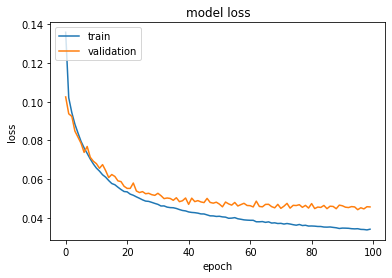

56-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_305"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_102 (InputLayer)       [(None, 84, 84, 50, 56)]  0         
_________________________________________________________________
conv3d_165 (Conv3D)          (None, 82, 82, 48, 150)   226950    
_________________________________________________________________
conv3d_166 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_167 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_168 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_101 (Dropout)        (None, 82, 82, 48, 150)   0         
_______________________________________________

In [98]:
# 3D 
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
56input size the ssim score for ndi is: 0.982162985932685
56input size the ssim score for odi is: 0.9594572588527774
56input size the ssim score for fwf is: 0.950664617490961
3
conv2d
56input size the ssim score for ndi is: 0.9824682316028158
56input size the ssim score for odi is: 0.9587349427452517
56input size the ssim score for fwf is: 0.9497042061164284
3
conv3d
56input size the ssim score for ndi is: 0.9822476267589129
56input size the ssim score for odi is: 0.9576139620343344
56input size the ssim score for fwf is: 0.962663389460113


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


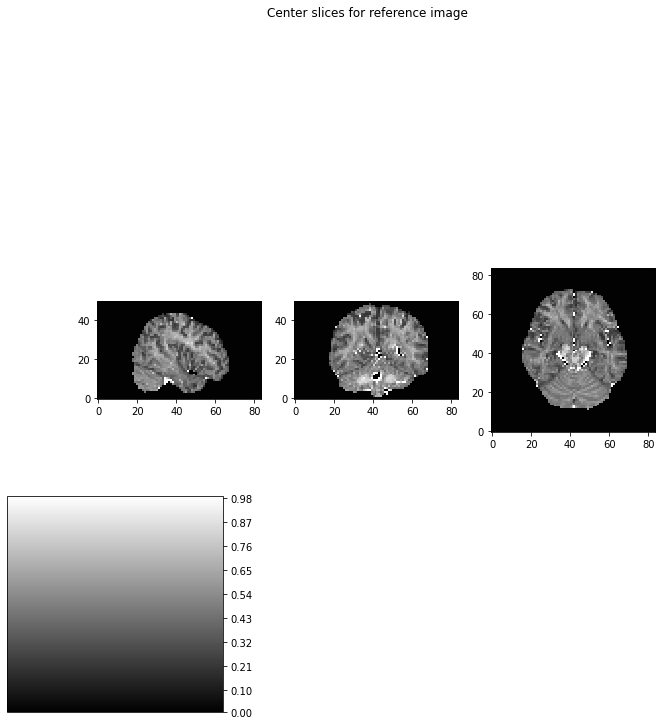

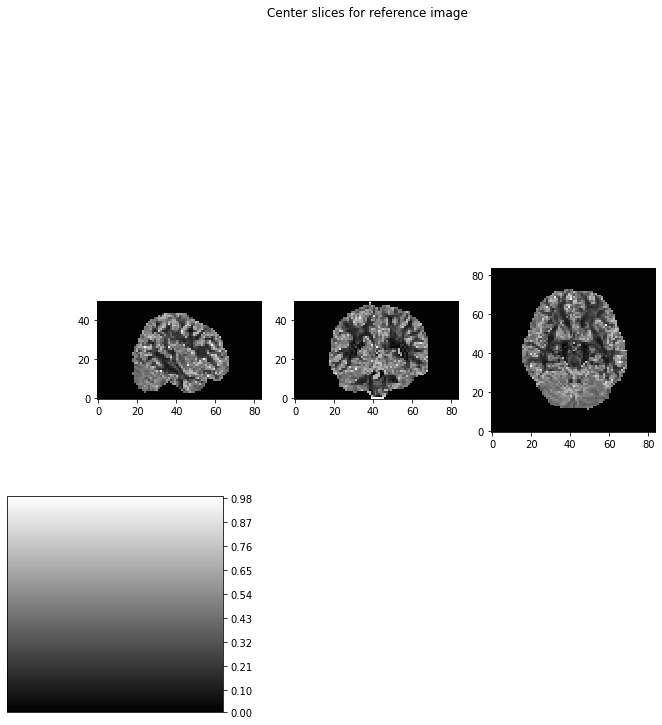

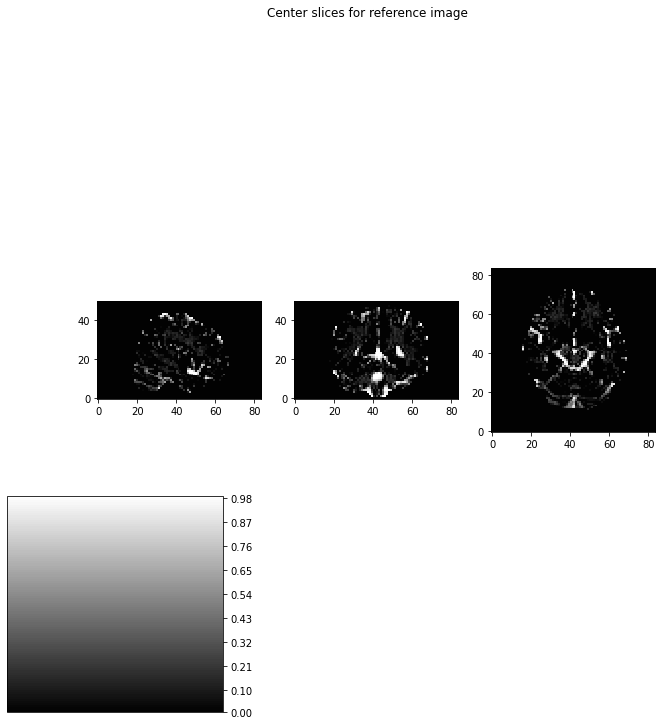

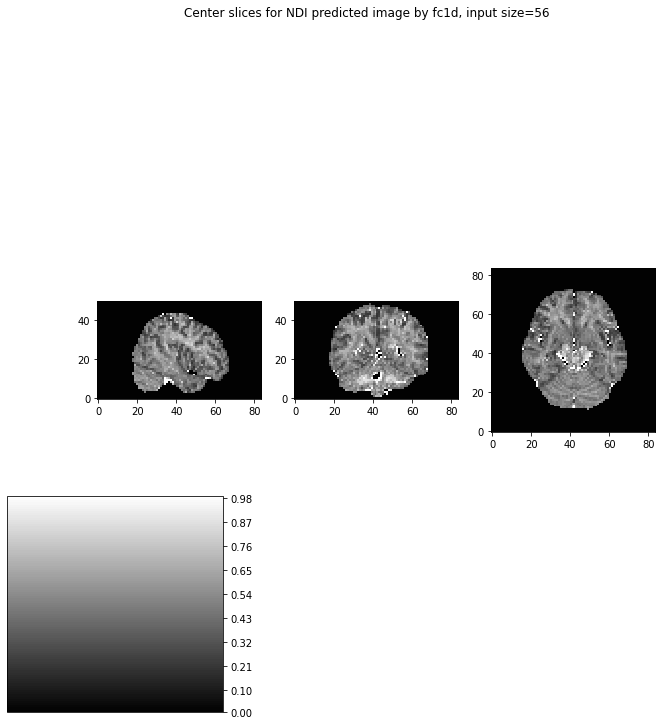

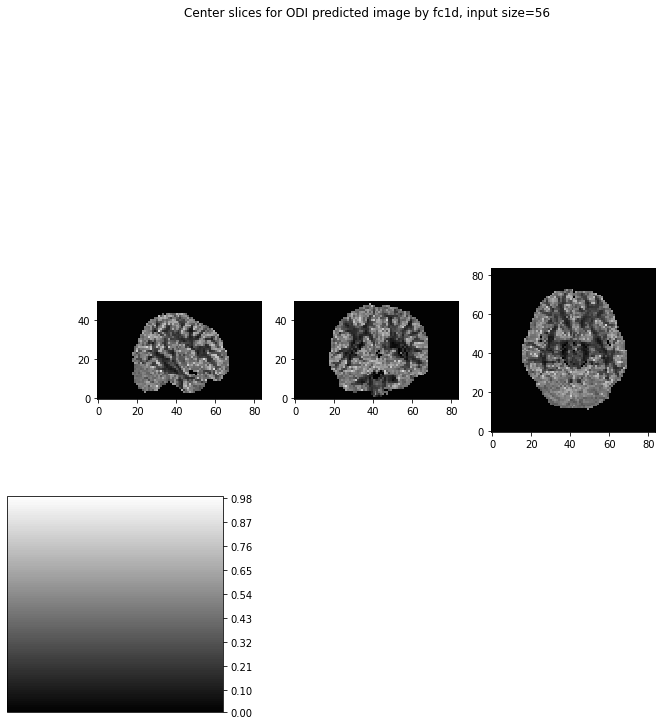

...

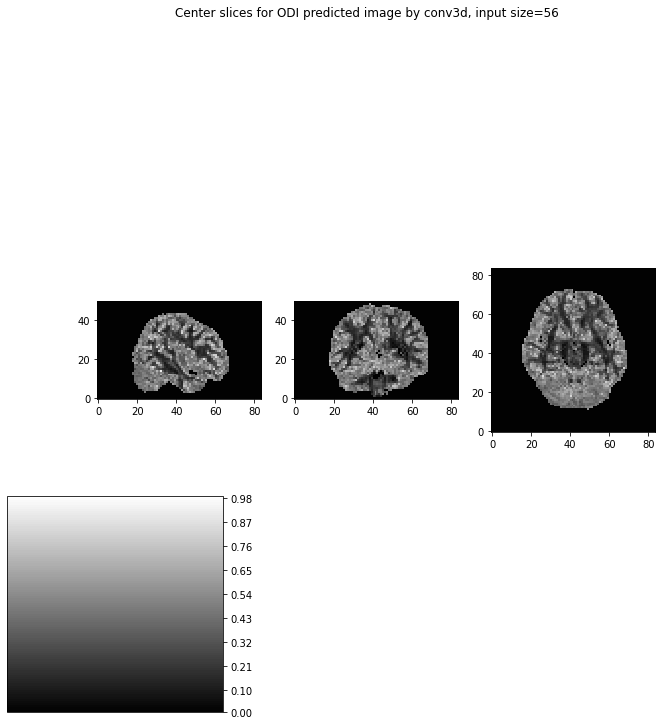

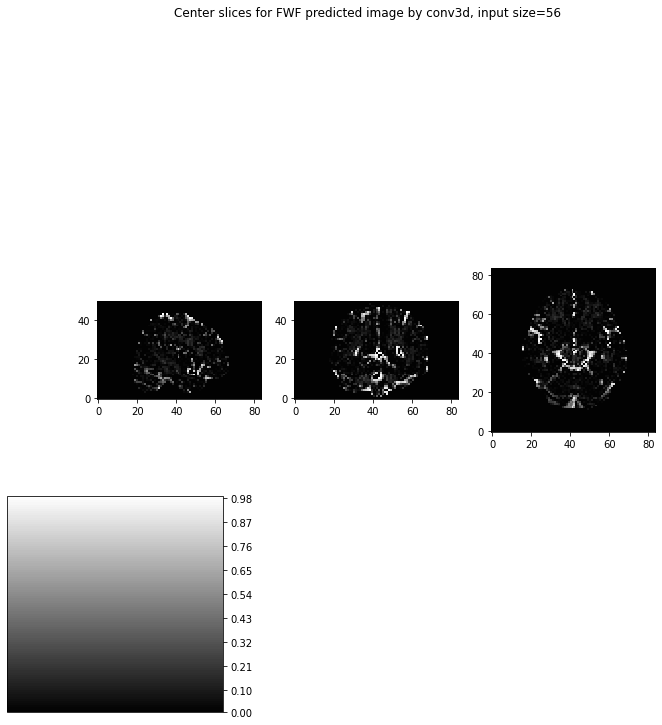

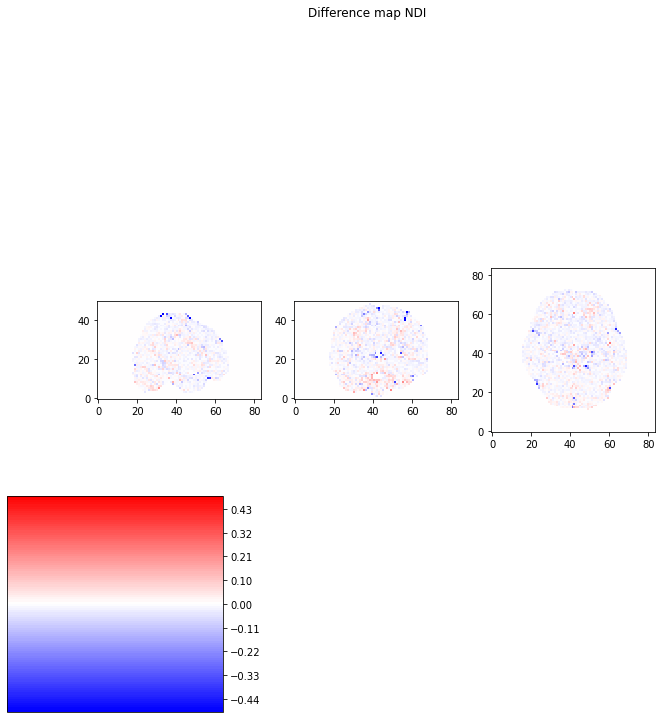

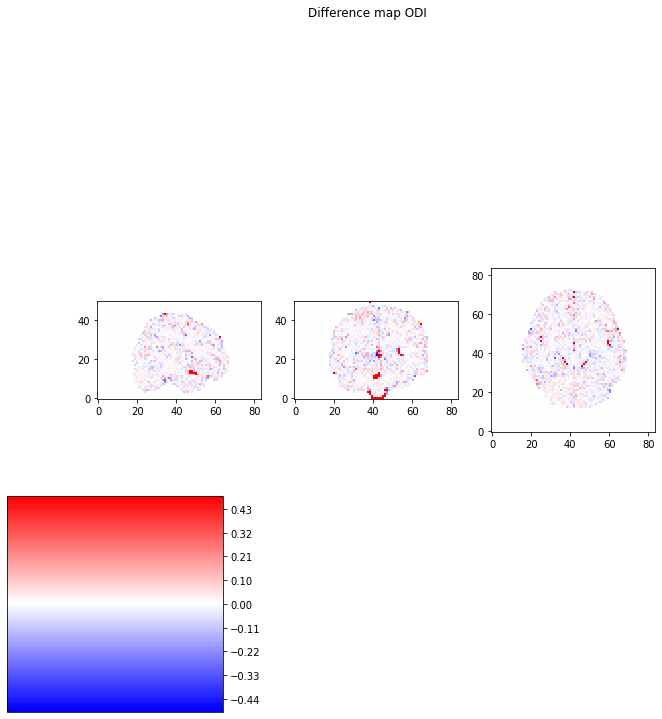

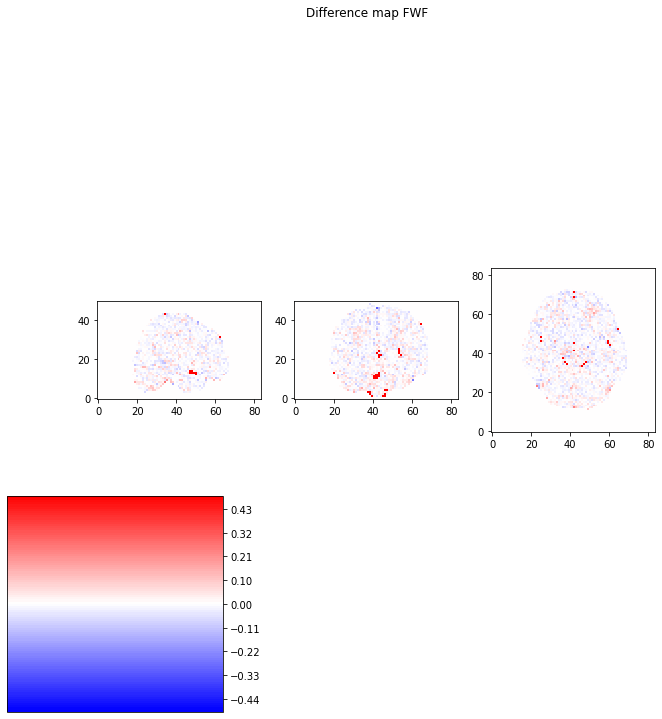

In [99]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 66

In [57]:
dwi = 66

66
Model: "functional_307"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_103 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_136 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_137 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_138 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_139 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_102 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 22:23:28.294373: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:23:28.294445: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:23:28.712025: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:23:28.734954: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:23:28.735284: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:23:28.736699: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_23_28
2022-04-09 22:23:28.737221: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_23_28/vw.trace.json.gz
2022-04-09 22:23:28.737310: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:23:28.738444: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

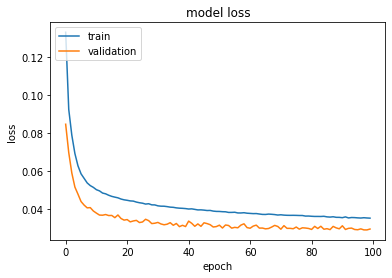

66-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 66)
Model: "functional_311"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_104 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_140 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_141 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_142 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_143 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_103 (Dropout)        (None, 150)               0         
_________________________________________________

In [101]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

66
Model: "functional_313"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_105 (InputLayer)       [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_170 (Conv2D)          (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_171 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_172 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_173 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_104 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_174 (Conv2D)          (None, 1, 1, 3)     

2022-04-09 22:24:19.799591: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:24:19.799684: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:24:20.334452: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:24:20.358442: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:24:20.358722: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:24:20.360107: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_24_20
2022-04-09 22:24:20.360669: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_24_20/vw.trace.json.gz
2022-04-09 22:24:20.360749: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:24:20.361841: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

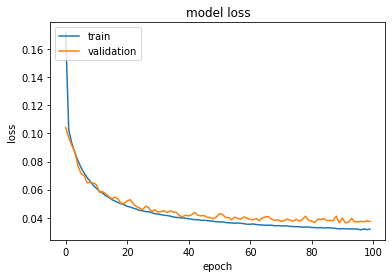

66-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 66)
Model: "functional_317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_106 (InputLayer)       [(None, 84, 84, 66)]      0         
_________________________________________________________________
conv2d_175 (Conv2D)          (None, 82, 82, 150)       89250     
_________________________________________________________________
conv2d_176 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_177 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_178 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_105 (Dropout)        (None, 82, 82, 150)       0         
_______________________________________________

In [102]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

66
Model: "functional_169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_57 (InputLayer)        [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_150 (Conv3D)          (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_151 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_152 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_153 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_56 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_154 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-11 17:54:49.975862: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 1295100576 exceeds 10% of free system memory.


(90846, 3, 3, 3, 66)
(90846, 1, 1, 1, 150)
(90846, 1, 1, 1, 150)
(90846, 1, 1, 1, 150)
(90846, 1, 1, 1, 150)
(90846, 1, 1, 1, 150)
(90846, 1, 1, 1, 3)
(90846, 1, 1, 1, 3)
Training start ...


2022-04-11 17:54:50.594915: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:54:50.594999: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-11 17:54:51.217049: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-11 17:54:51.241385: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-11 17:54:51.241671: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-11 17:54:51.243053: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_11_17_54_51
2022-04-11 17:54:51.243605: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_11_17_54_51/vw.trace.json.gz
2022-04-11 17:54:51.243685: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-11 17:54:51.244767: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

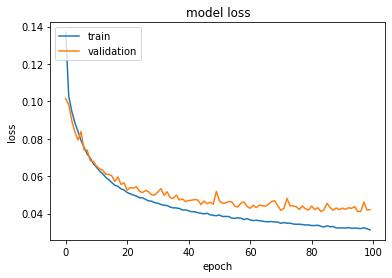

66-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_173"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_58 (InputLayer)        [(None, 84, 84, 50, 66)]  0         
_________________________________________________________________
conv3d_155 (Conv3D)          (None, 82, 82, 48, 150)   267450    
_________________________________________________________________
conv3d_156 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_157 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_158 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_57 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________

In [58]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
66input size the ssim score for ndi is: 0.9825658397599686
66input size the ssim score for odi is: 0.9609777387139057
66input size the ssim score for fwf is: 0.9564668223788461
3
conv2d
66input size the ssim score for ndi is: 0.9829593361012489
66input size the ssim score for odi is: 0.9593454831473748
66input size the ssim score for fwf is: 0.9587834013066255
3
conv3d
66input size the ssim score for ndi is: 0.9792944335385774
66input size the ssim score for odi is: 0.9581840308355888
66input size the ssim score for fwf is: 0.9528722798625047


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


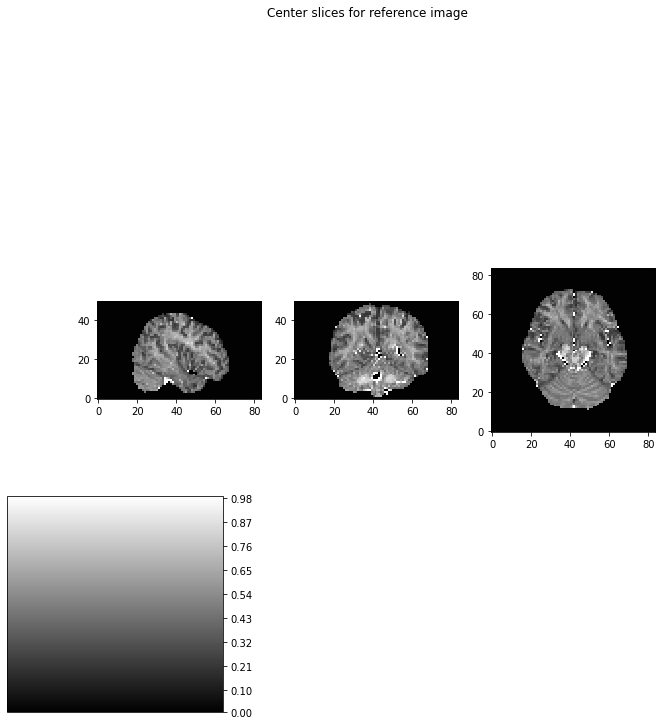

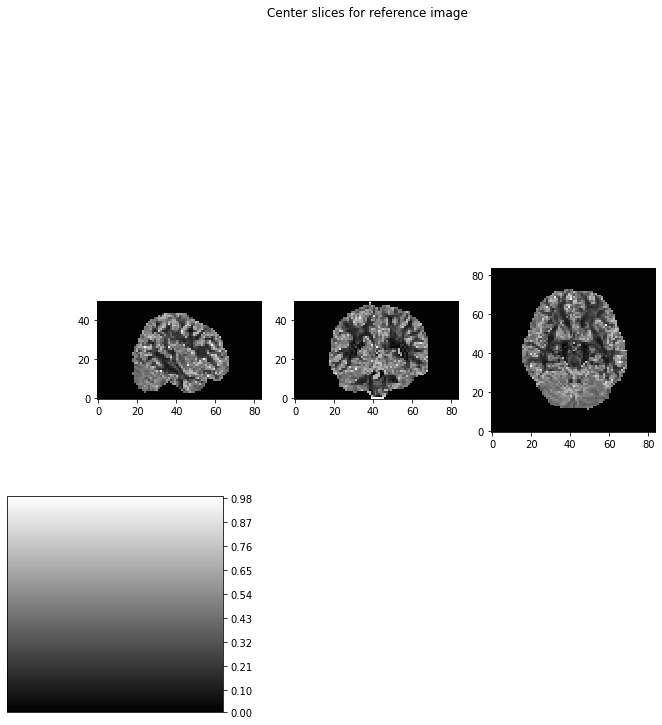

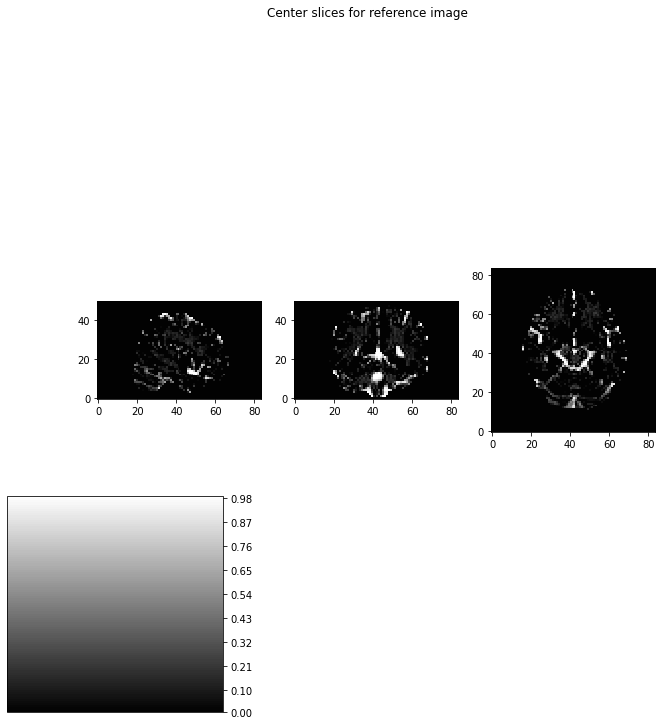

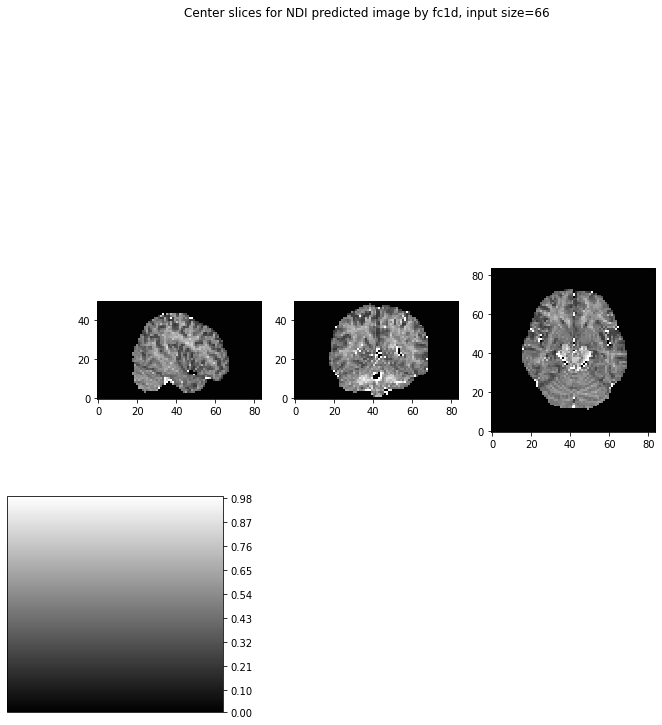

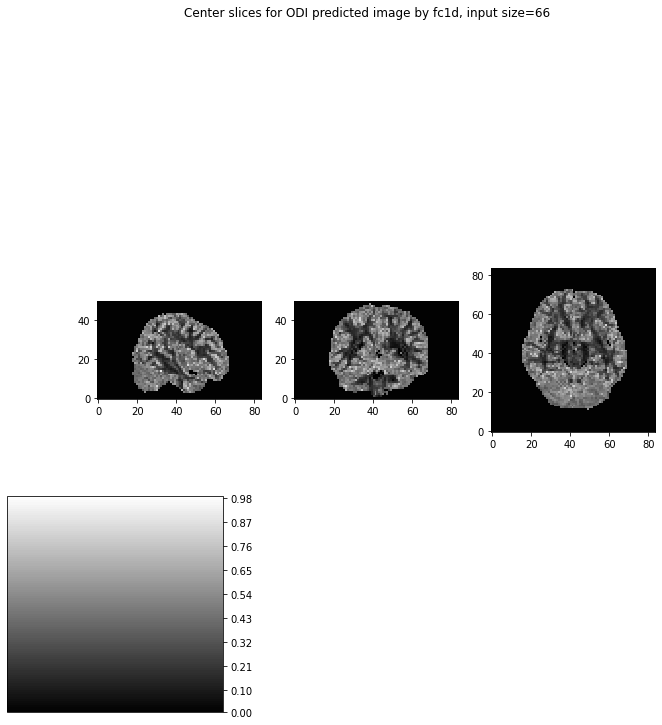

...

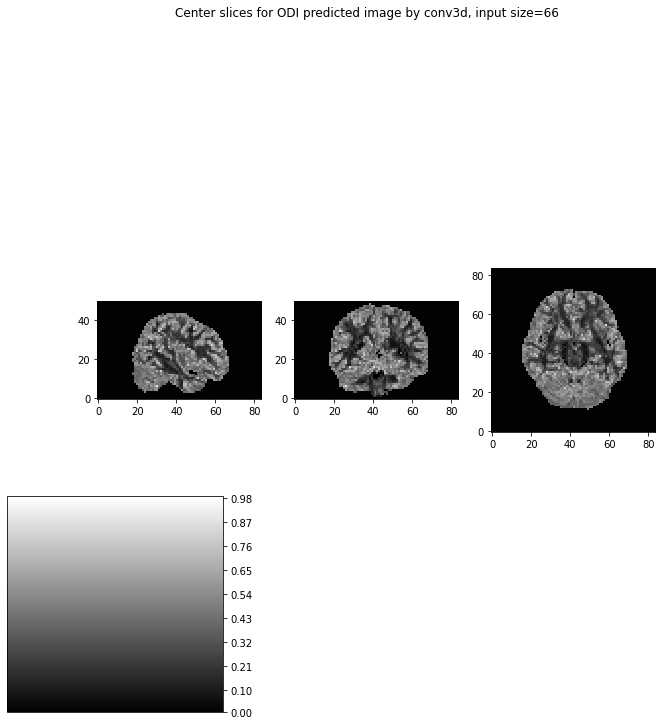

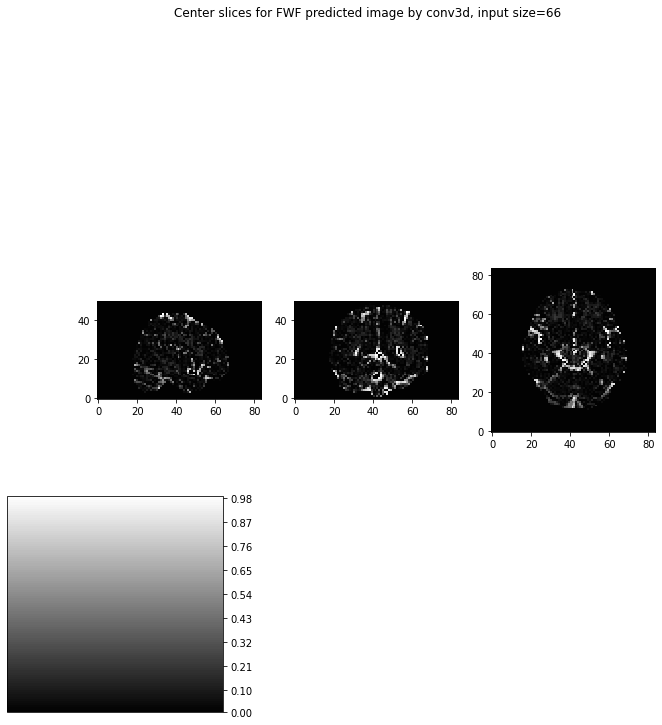

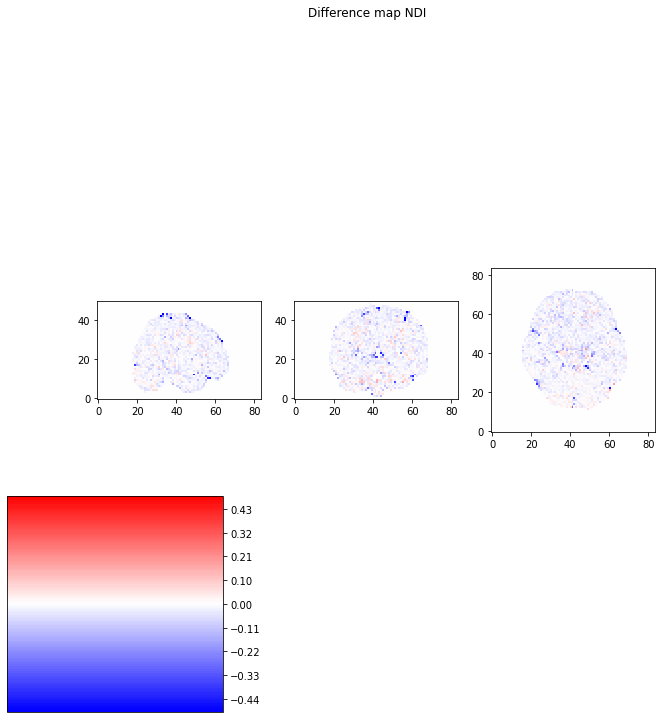

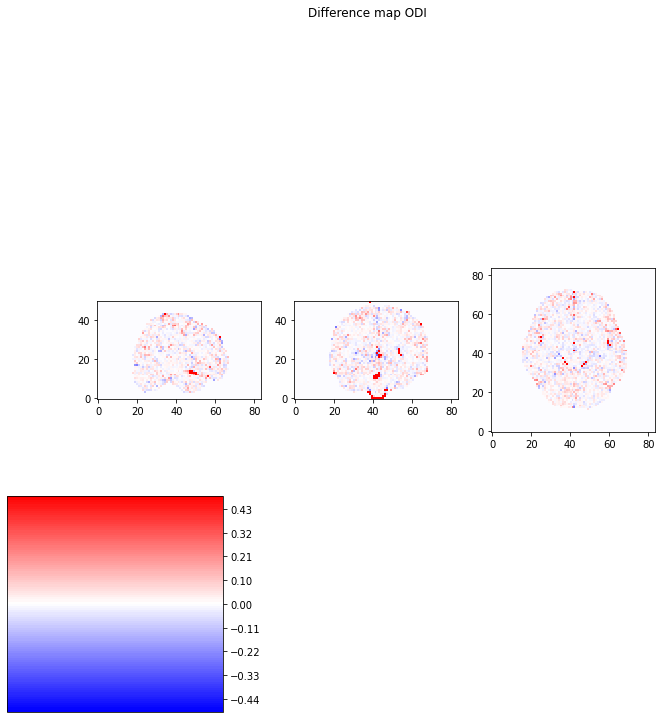

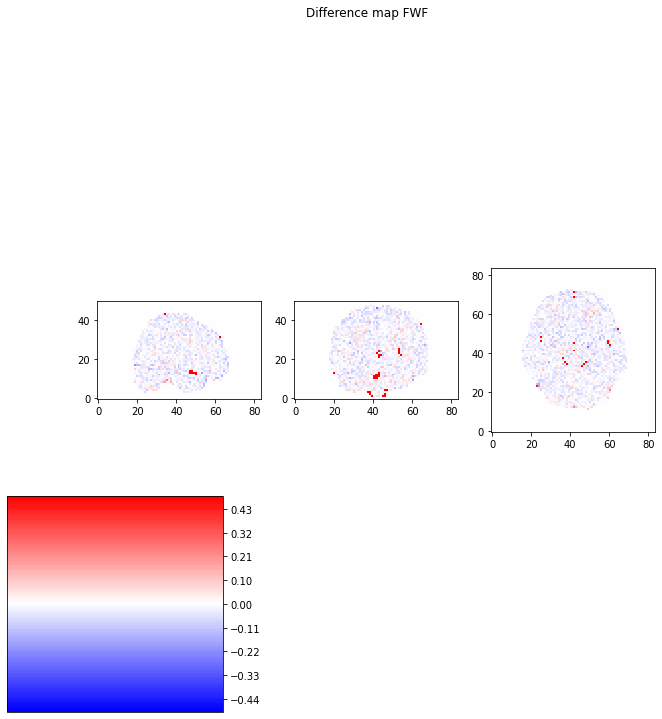

In [104]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 76

In [105]:
dwi = 76

76
Model: "functional_325"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_109 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_144 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_145 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_146 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_147 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_108 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 22:28:21.153461: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:28:21.153614: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:28:21.843908: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:28:21.871042: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:28:21.871340: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:28:21.872824: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_28_21
2022-04-09 22:28:21.873361: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_28_21/vw.trace.json.gz
2022-04-09 22:28:21.873464: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:28:21.874682: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

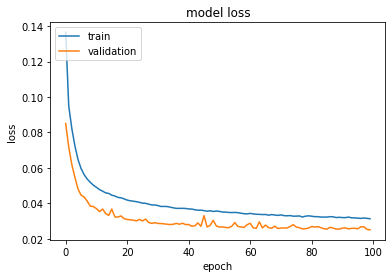

76-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 76)
Model: "functional_329"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_110 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_148 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_149 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_150 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_151 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_109 (Dropout)        (None, 150)               0         
_________________________________________________

In [106]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

76
Model: "functional_331"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_111 (InputLayer)       [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_180 (Conv2D)          (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_181 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_182 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_183 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_110 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_184 (Conv2D)          (None, 1, 1, 3)     

2022-04-09 22:29:12.625642: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:29:12.625792: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:29:13.235068: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:29:13.260938: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:29:13.261217: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:29:13.262592: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_29_13
2022-04-09 22:29:13.263118: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_29_13/vw.trace.json.gz
2022-04-09 22:29:13.263211: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:29:13.264234: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

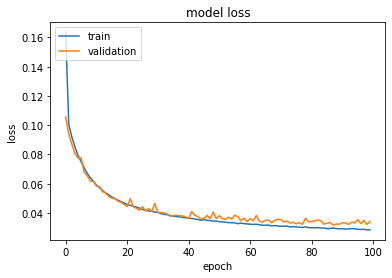

76-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 76)
Model: "functional_335"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_112 (InputLayer)       [(None, 84, 84, 76)]      0         
_________________________________________________________________
conv2d_185 (Conv2D)          (None, 82, 82, 150)       102750    
_________________________________________________________________
conv2d_186 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_187 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_188 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_111 (Dropout)        (None, 82, 82, 150)       0         
_______________________________________________

In [107]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

76
Model: "functional_337"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_113 (InputLayer)       [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_180 (Conv3D)          (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_181 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_182 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_183 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_112 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_184 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-09 22:30:53.853564: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:30:53.853658: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:30:54.629386: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:30:54.651960: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:30:54.652241: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:30:54.657551: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_30_54
2022-04-09 22:30:54.658080: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_30_54/vw.trace.json.gz
2022-04-09 22:30:54.658158: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:30:54.659243: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

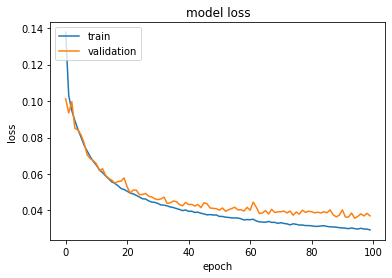

76-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_341"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_114 (InputLayer)       [(None, 84, 84, 50, 76)]  0         
_________________________________________________________________
conv3d_185 (Conv3D)          (None, 82, 82, 48, 150)   307950    
_________________________________________________________________
conv3d_186 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_187 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_188 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_113 (Dropout)        (None, 82, 82, 48, 150)   0         
_______________________________________________

In [108]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
76input size the ssim score for ndi is: 0.9829712884415449
76input size the ssim score for odi is: 0.9625281308915469
76input size the ssim score for fwf is: 0.9546138199625356
3
conv2d
76input size the ssim score for ndi is: 0.9810993416913358
76input size the ssim score for odi is: 0.9613804156938475
76input size the ssim score for fwf is: 0.9594915113467792
3
conv3d
76input size the ssim score for ndi is: 0.983789243145596
76input size the ssim score for odi is: 0.9600371863129031
76input size the ssim score for fwf is: 0.9564590548381958


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


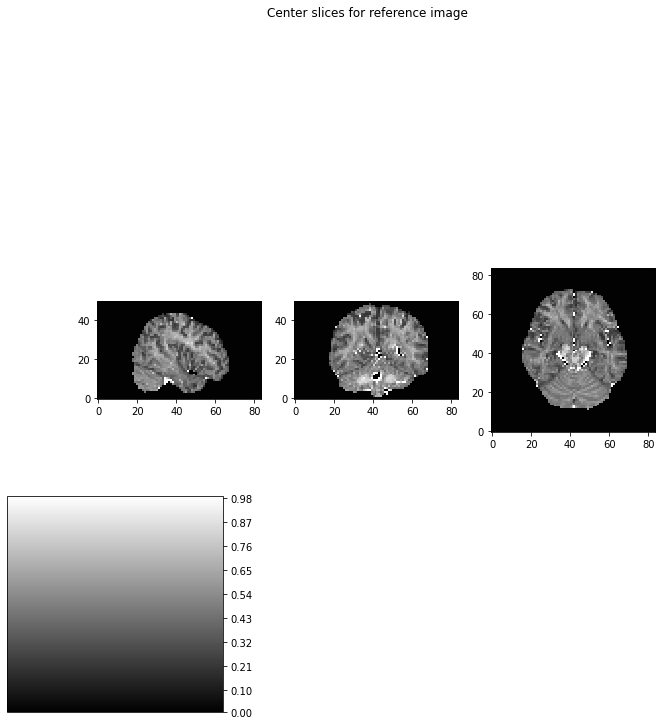

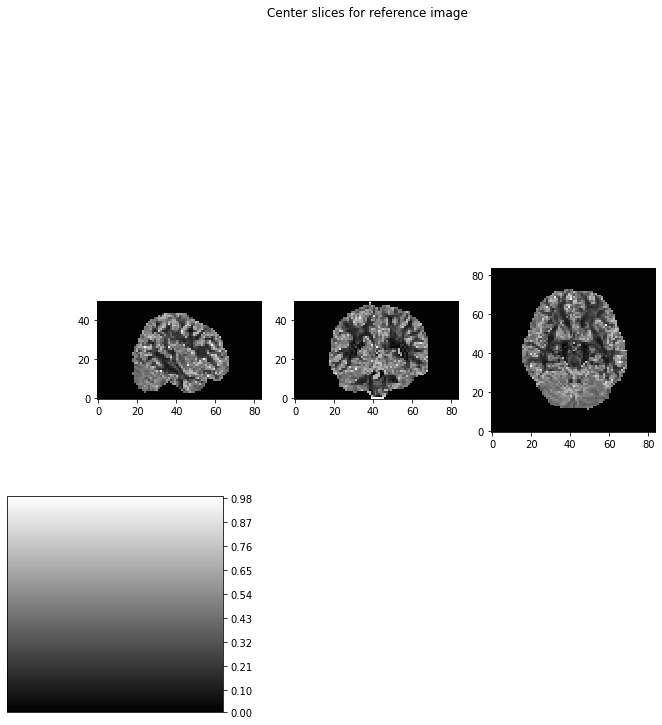

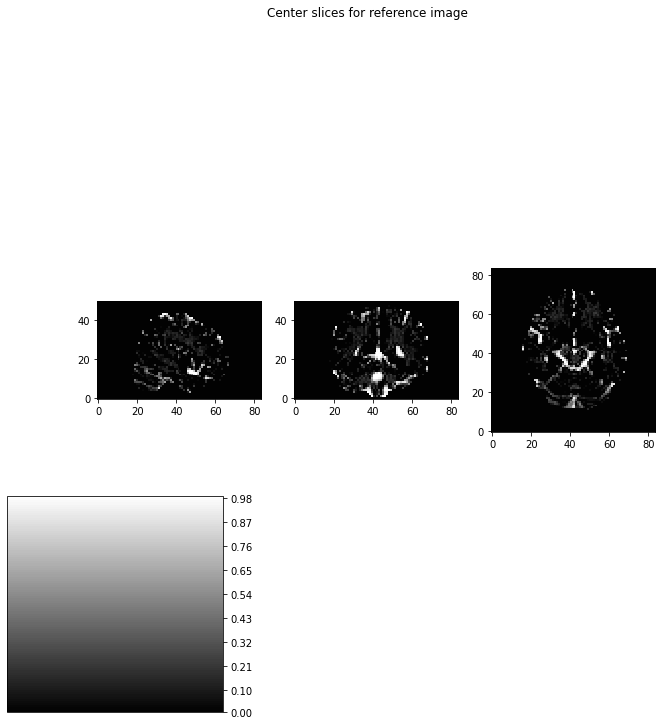

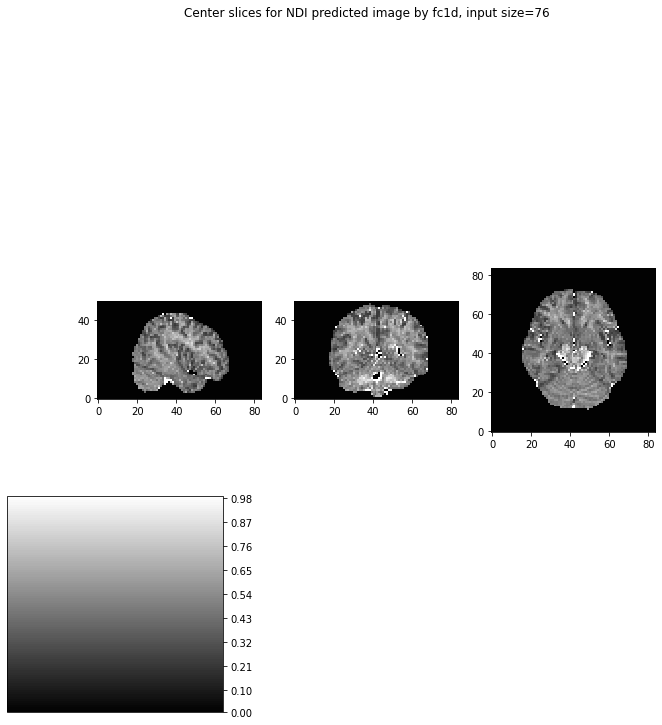

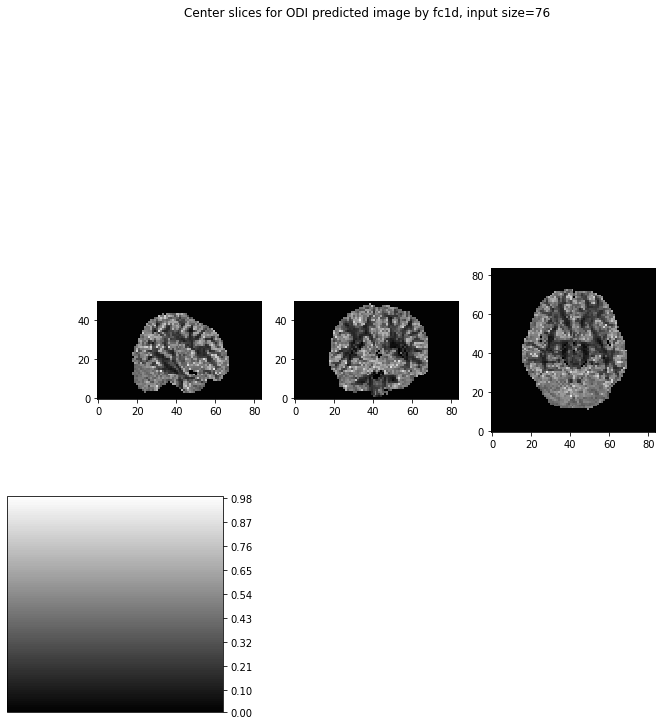

...

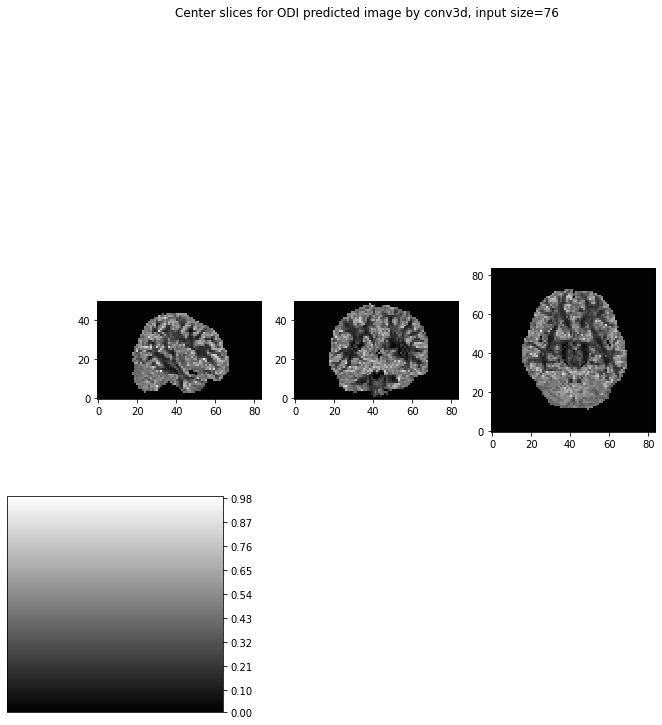

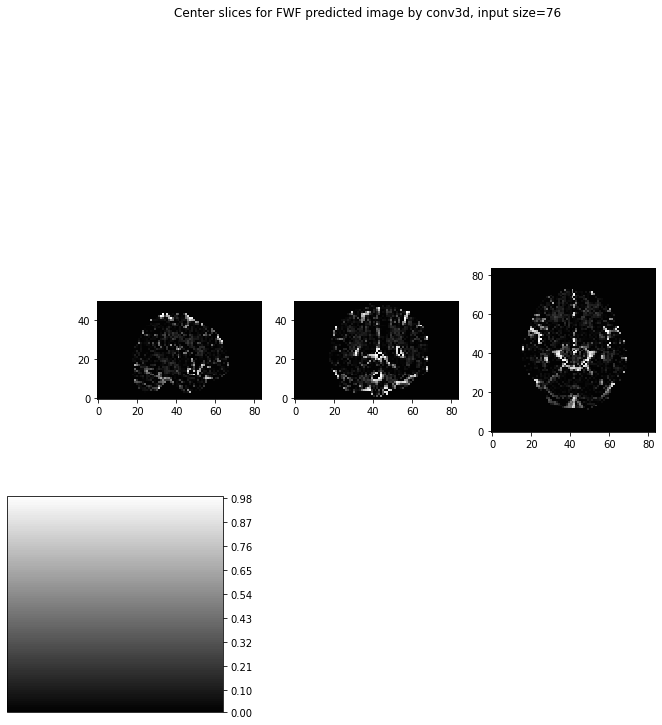

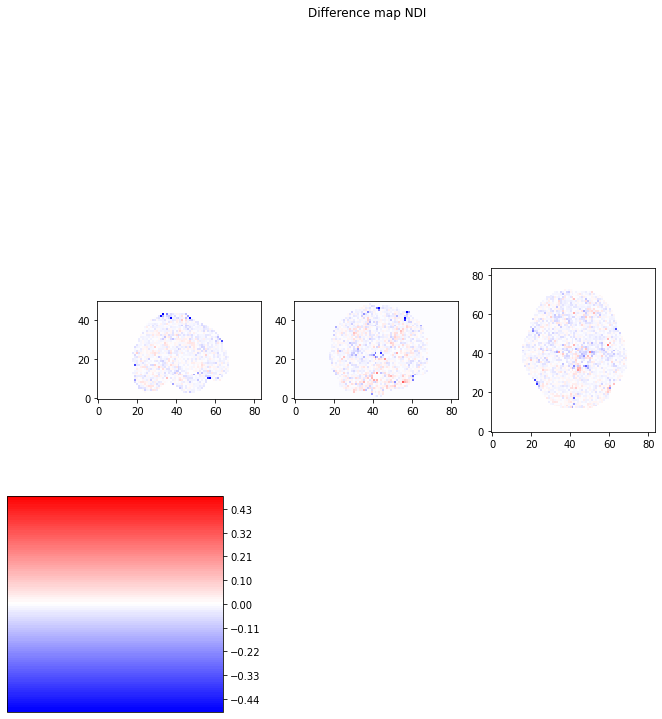

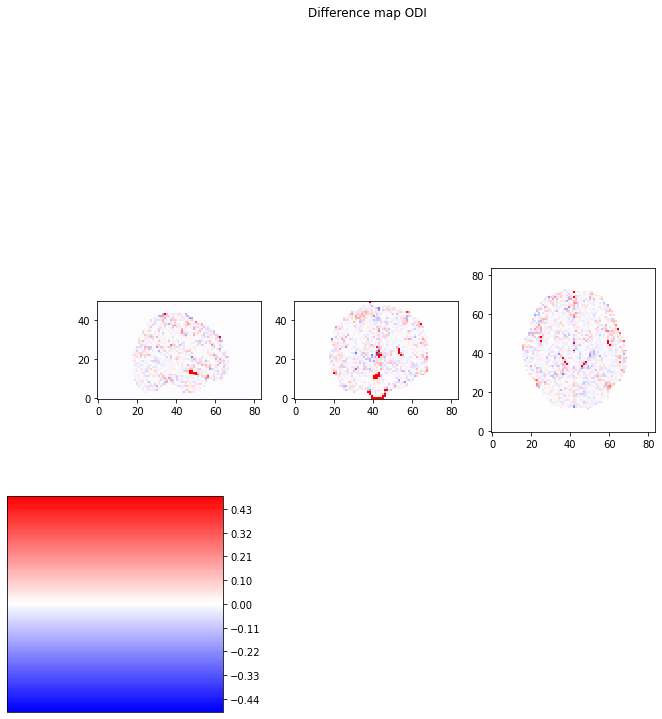

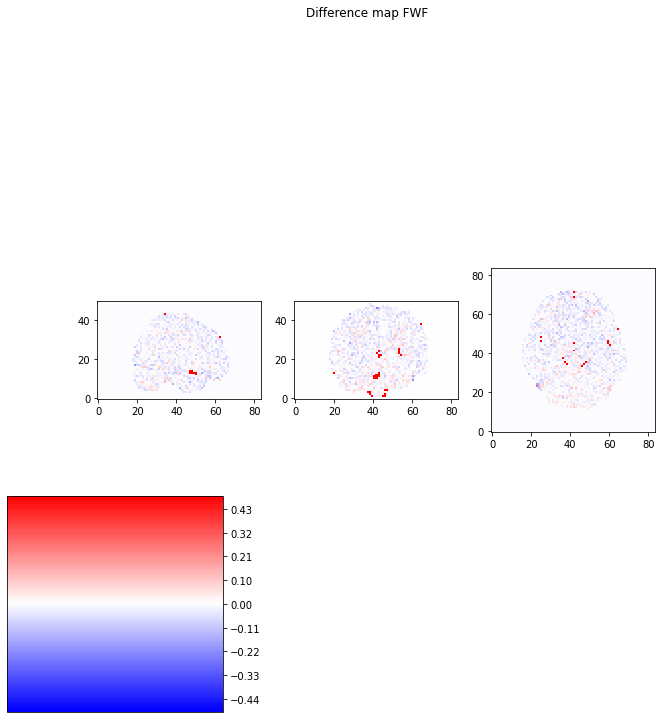

In [109]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 86

In [110]:
dwi = 86

86
Model: "functional_343"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_115 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_152 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_153 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_154 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_155 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_114 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 22:33:35.965220: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:33:35.965355: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:33:36.443169: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:33:36.465527: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:33:36.465803: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:33:36.467171: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_33_36
2022-04-09 22:33:36.467699: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_33_36/vw.trace.json.gz
2022-04-09 22:33:36.467777: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:33:36.468849: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

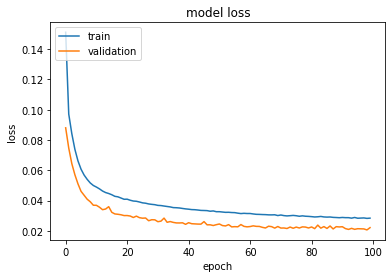

86-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 86)
Model: "functional_347"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_116 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_156 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_157 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_158 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_159 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_115 (Dropout)        (None, 150)               0         
_________________________________________________

In [111]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

86
Model: "functional_349"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_117 (InputLayer)       [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_190 (Conv2D)          (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_191 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_192 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_193 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_116 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_194 (Conv2D)          (None, 1, 1, 3)     

2022-04-09 22:34:26.963151: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:34:26.963262: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:34:27.579526: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:34:27.603423: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:34:27.603716: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:34:27.605160: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_34_27
2022-04-09 22:34:27.605674: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_34_27/vw.trace.json.gz
2022-04-09 22:34:27.605761: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:34:27.606774: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

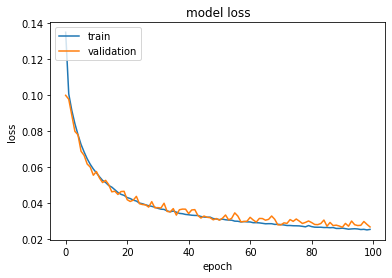

86-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 86)
Model: "functional_353"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_118 (InputLayer)       [(None, 84, 84, 86)]      0         
_________________________________________________________________
conv2d_195 (Conv2D)          (None, 82, 82, 150)       116250    
_________________________________________________________________
conv2d_196 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_197 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_198 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_117 (Dropout)        (None, 82, 82, 150)       0         
_______________________________________________

In [112]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

86
Model: "functional_355"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_119 (InputLayer)       [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_190 (Conv3D)          (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_191 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_192 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_193 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_118 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_194 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-09 22:36:08.141894: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:36:08.142017: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:36:08.923052: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:36:08.944784: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:36:08.945052: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:36:08.946420: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_36_08
2022-04-09 22:36:08.946960: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_36_08/vw.trace.json.gz
2022-04-09 22:36:08.947039: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:36:08.948093: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

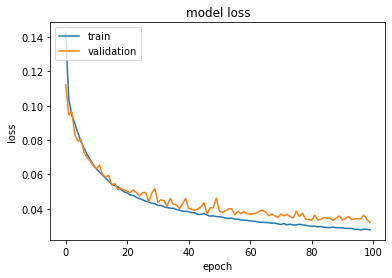

86-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_359"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_120 (InputLayer)       [(None, 84, 84, 50, 86)]  0         
_________________________________________________________________
conv3d_195 (Conv3D)          (None, 82, 82, 48, 150)   348450    
_________________________________________________________________
conv3d_196 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_197 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_198 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_119 (Dropout)        (None, 82, 82, 48, 150)   0         
_______________________________________________

In [113]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
86input size the ssim score for ndi is: 0.9817742067816735
86input size the ssim score for odi is: 0.9629396380915394
86input size the ssim score for fwf is: 0.9502795002505898
3
conv2d
86input size the ssim score for ndi is: 0.9832183758859968
86input size the ssim score for odi is: 0.9622879422166247
86input size the ssim score for fwf is: 0.9563421316030158
3
conv3d
86input size the ssim score for ndi is: 0.9833116968597307
86input size the ssim score for odi is: 0.9611522938098888
86input size the ssim score for fwf is: 0.9546508247508886


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


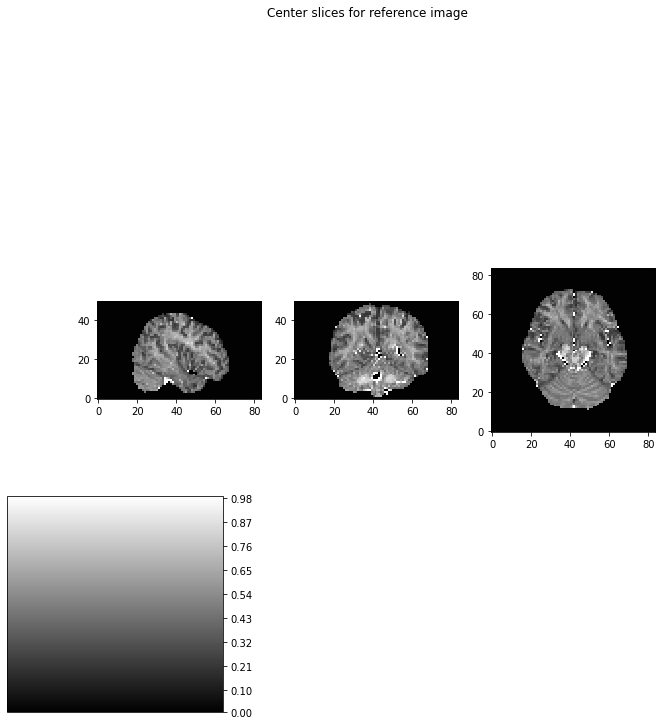

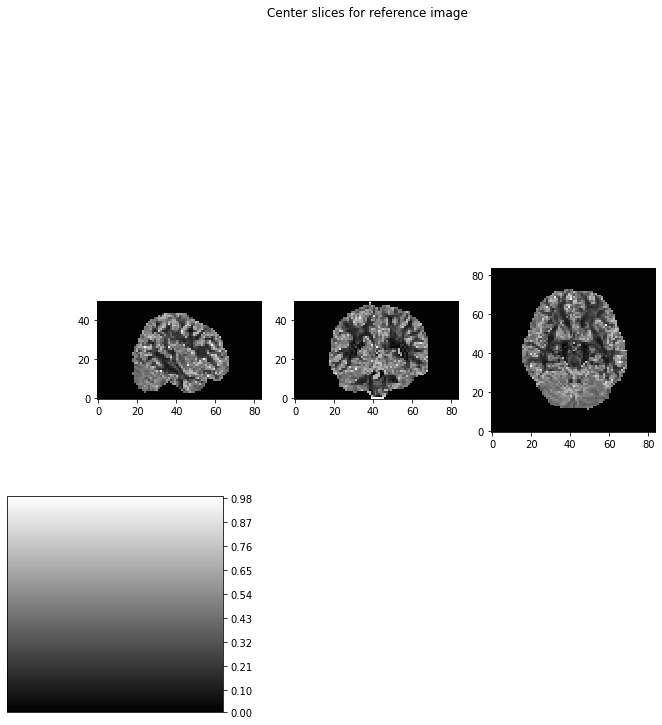

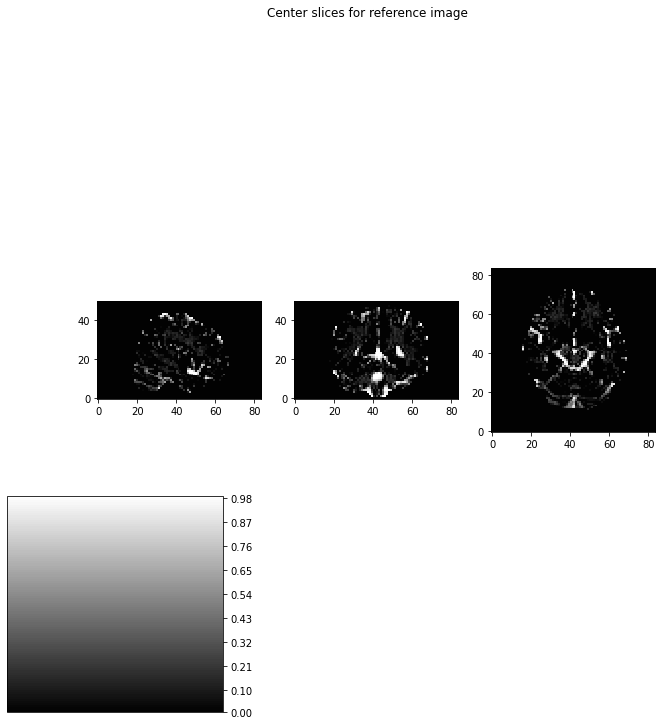

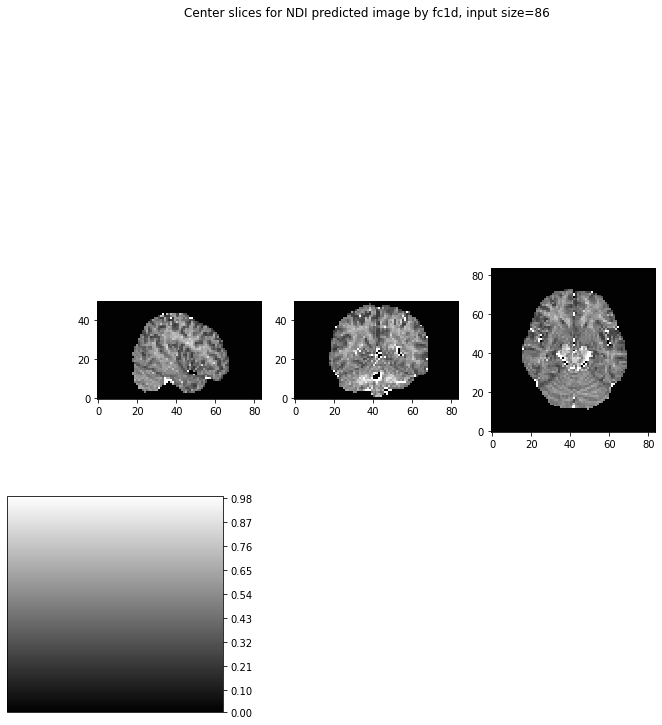

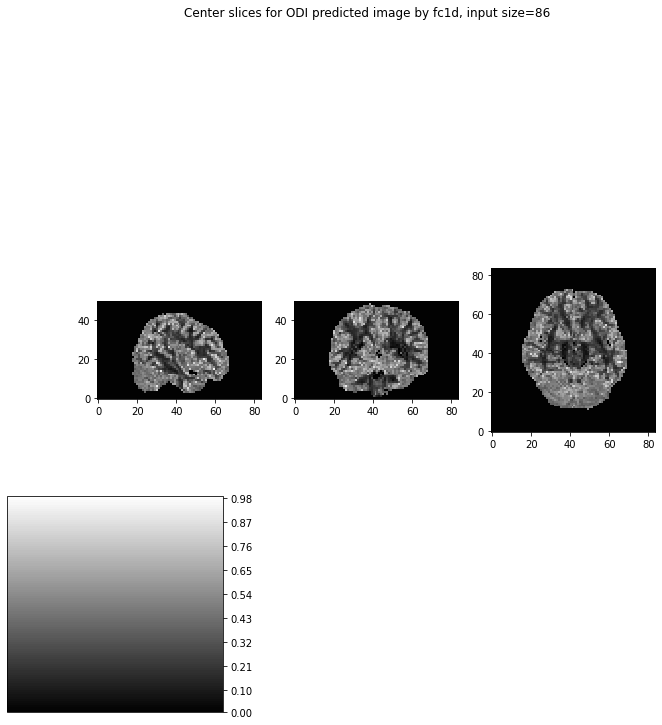

...

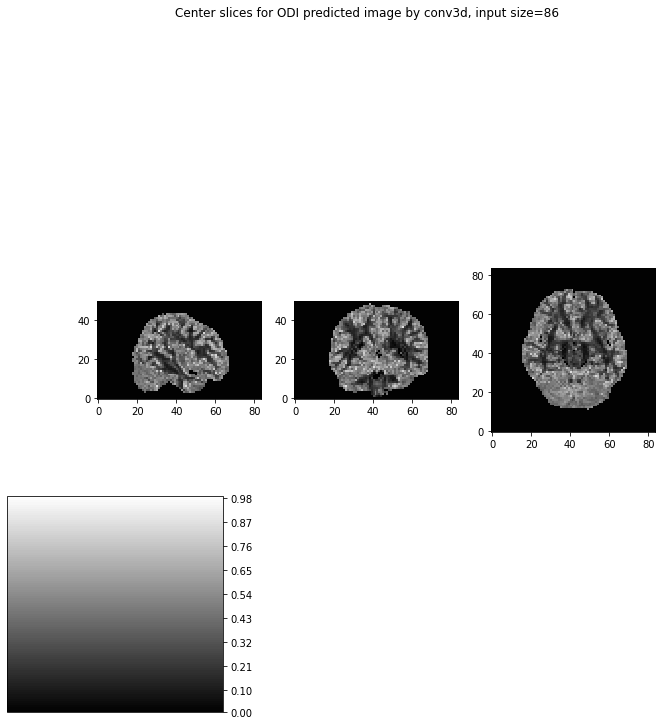

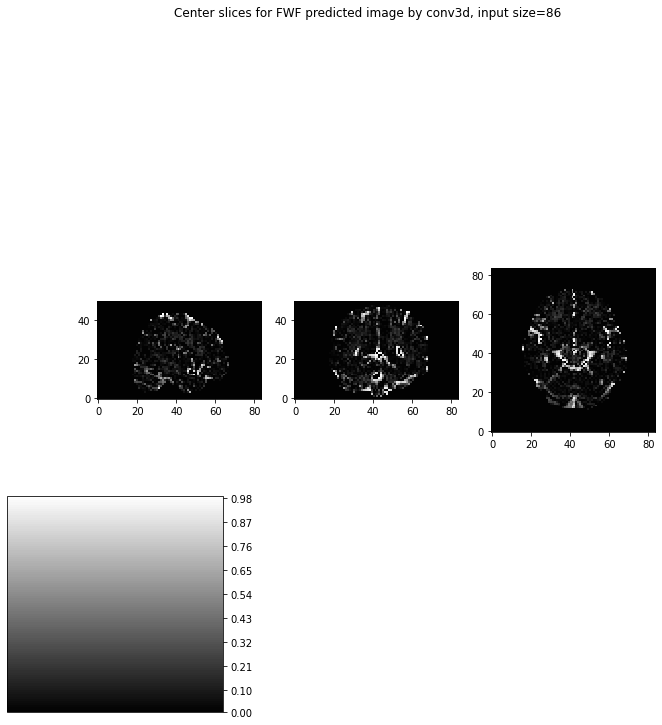

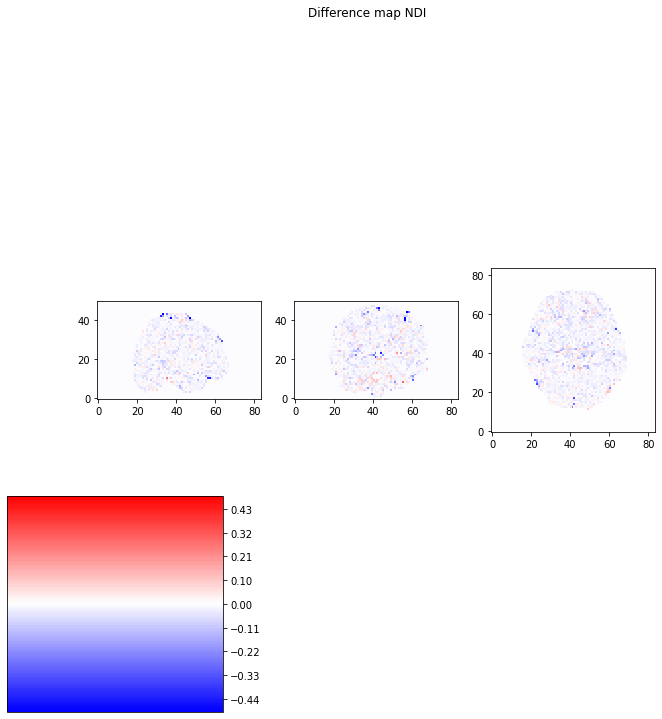

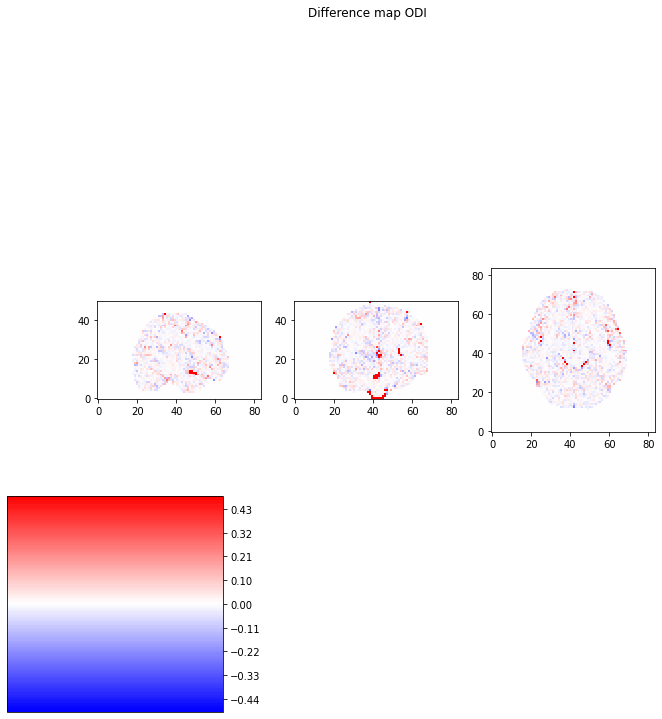

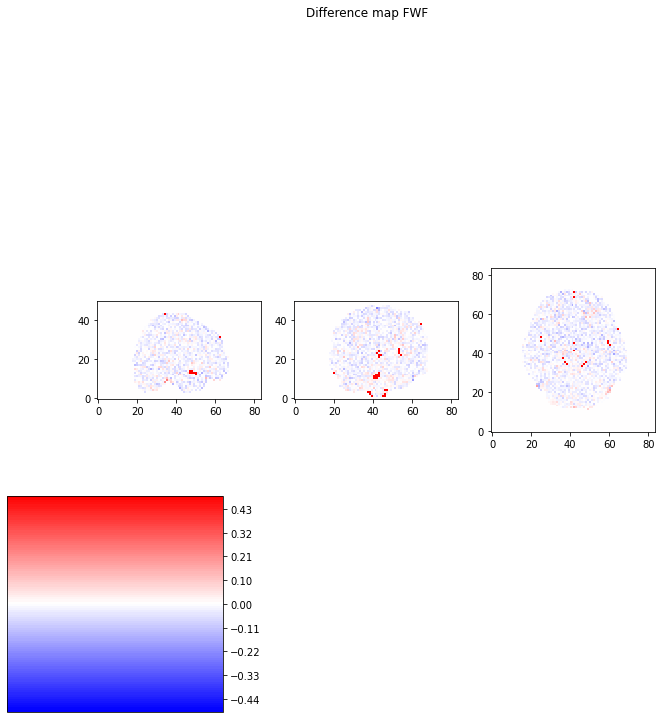

In [114]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

DWI = 96

In [115]:
dwi = 96

96
Model: "functional_361"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_121 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_160 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_161 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_162 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_163 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_120 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)           

2022-04-09 22:39:07.584284: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:39:07.584403: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:39:08.053966: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:39:08.076986: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:39:08.077297: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:39:08.078702: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_39_08
2022-04-09 22:39:08.079250: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_39_08/vw.trace.json.gz
2022-04-09 22:39:08.079327: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:39:08.080408: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

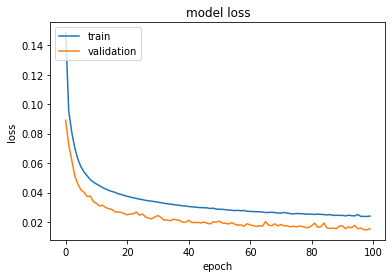

96-fc1d-patch_1-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 50, 96)
Model: "functional_365"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_122 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_164 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_165 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_166 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_167 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_121 (Dropout)        (None, 150)               0         
_________________________________________________

In [116]:
# ANN
train_cmd = "--train_subjects "+train_subject+" --model fc1d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model fc1d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

96
Model: "functional_367"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_123 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_200 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_201 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_202 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_203 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_122 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_204 (Conv2D)          (None, 1, 1, 3)     

2022-04-09 22:39:58.956145: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:39:58.956305: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:39:59.596976: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:39:59.620749: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:39:59.621023: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:39:59.622373: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_39_59
2022-04-09 22:39:59.622900: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_39_59/vw.trace.json.gz
2022-04-09 22:39:59.622978: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:39:59.624041: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

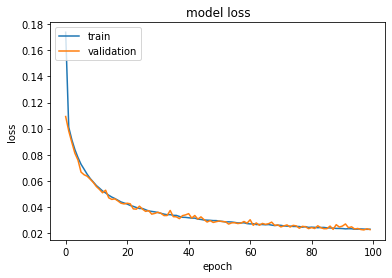

96-conv2d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 96)
Model: "functional_371"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_124 (InputLayer)       [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_205 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_206 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_207 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_208 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_123 (Dropout)        (None, 82, 82, 150)       0         
_______________________________________________

In [117]:
# 2D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv2d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv2d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

96
Model: "functional_373"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_125 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_200 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_201 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_202 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_203 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_124 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_204 (Conv3D)          (None, 1, 1, 1, 3)  

2022-04-09 22:41:45.706576: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:41:45.706714: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-04-09 22:41:46.561232: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-04-09 22:41:46.584138: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-04-09 22:41:46.584434: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-04-09 22:41:46.589697: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_04_09_22_41_46
2022-04-09 22:41:46.590263: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_04_09_22_41_46/vw.trace.json.gz
2022-04-09 22:41:46.590338: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-04-09 22:41:46.591394: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

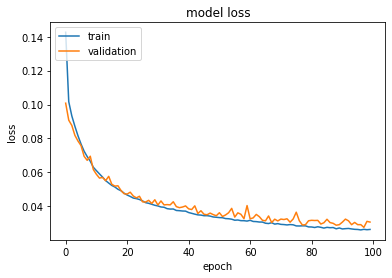

96-conv3d-patch_3-base_1-layer_4-label_NDIODIFWFsynthetic
(84, 84, 50)
Model: "functional_377"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_126 (InputLayer)       [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_205 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_206 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_207 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_208 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_125 (Dropout)        (None, 82, 82, 48, 150)   0         
_______________________________________________

In [118]:
# 3D CNN
train_cmd = "--train_subjects "+train_subject+" --model conv3d --layer 4 --train --label_type A --DWI " + str(dwi)
plot_loss(train_cmd)
for test_subject in test_subjects:
    cmd = '--test_subjects '+test_subject+' --model conv3d --layer 4 --label_type A --DWI ' + str(dwi)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

1
fc1d
96input size the ssim score for ndi is: 0.9837409621681414
96input size the ssim score for odi is: 0.9637991687450664
96input size the ssim score for fwf is: 0.9532839619034947
3
conv2d
96input size the ssim score for ndi is: 0.9841325691743616
96input size the ssim score for odi is: 0.9631083242622721
96input size the ssim score for fwf is: 0.958585027029847
3
conv3d
96input size the ssim score for ndi is: 0.9818078548445822
96input size the ssim score for odi is: 0.961780439358123
96input size the ssim score for fwf is: 0.9589164319926335


/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


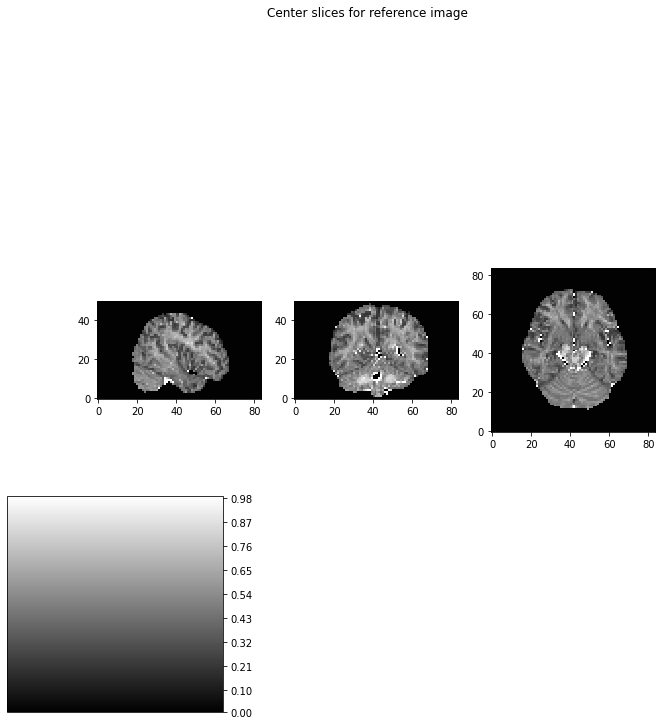

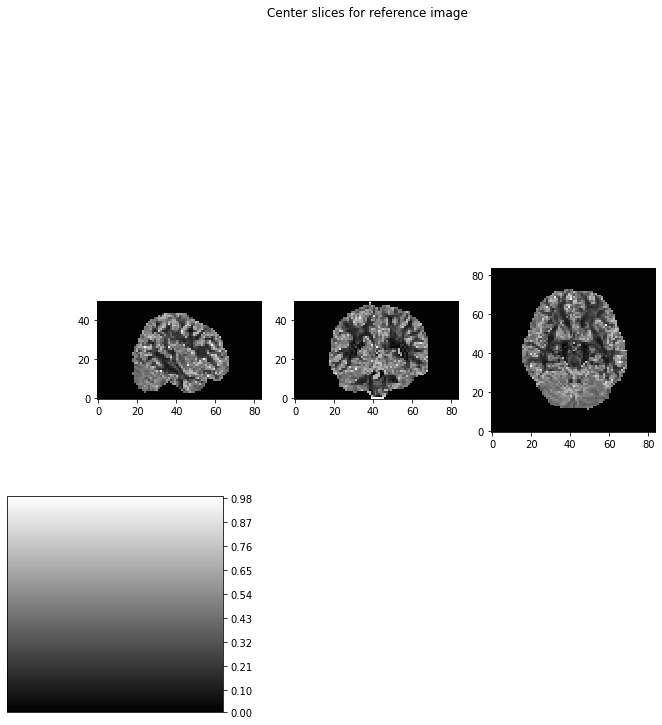

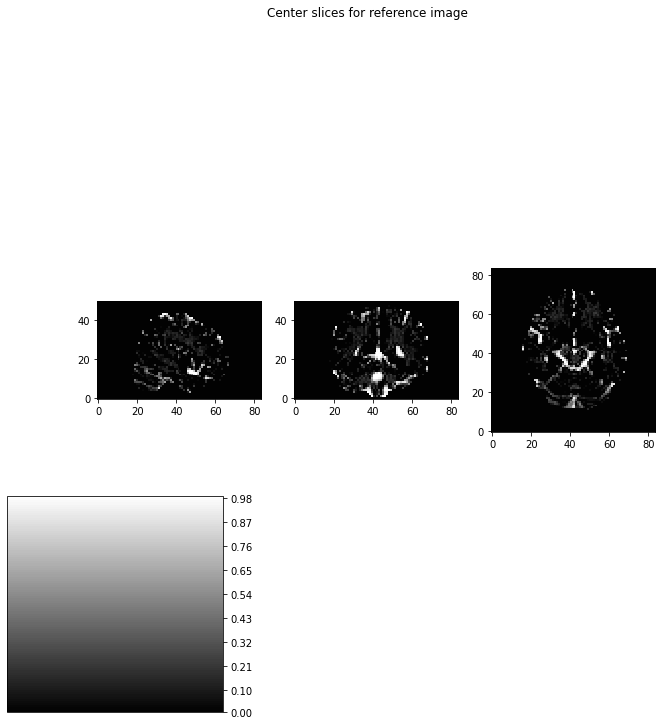

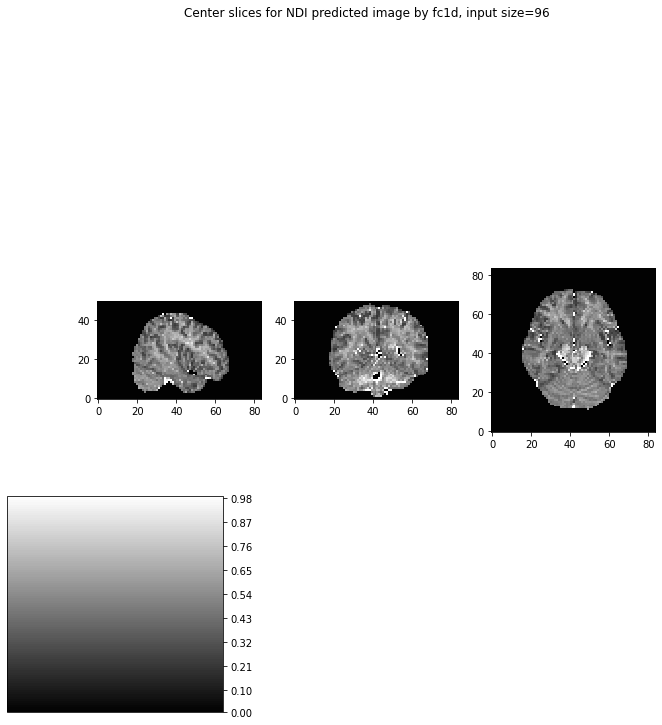

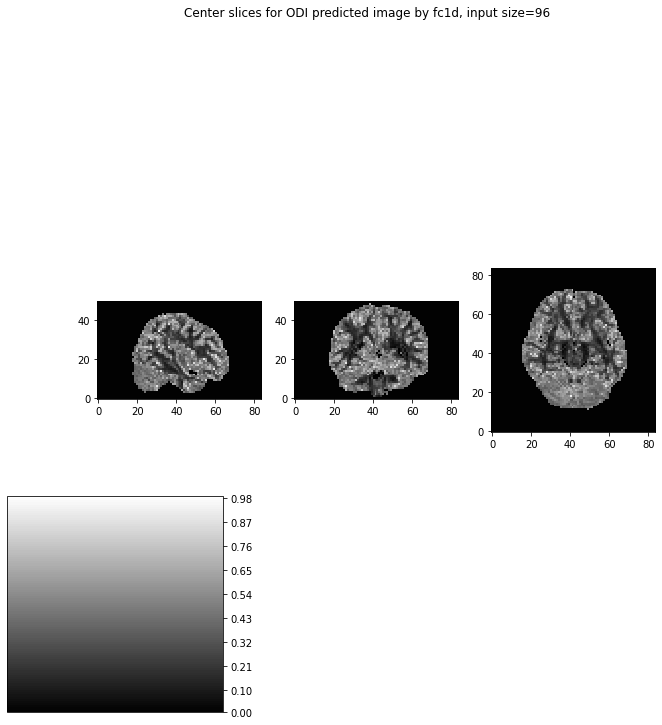

...

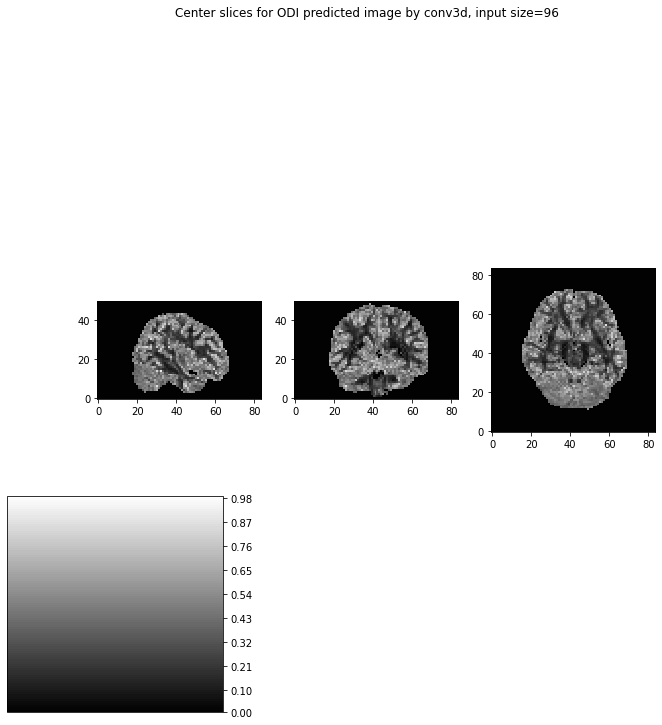

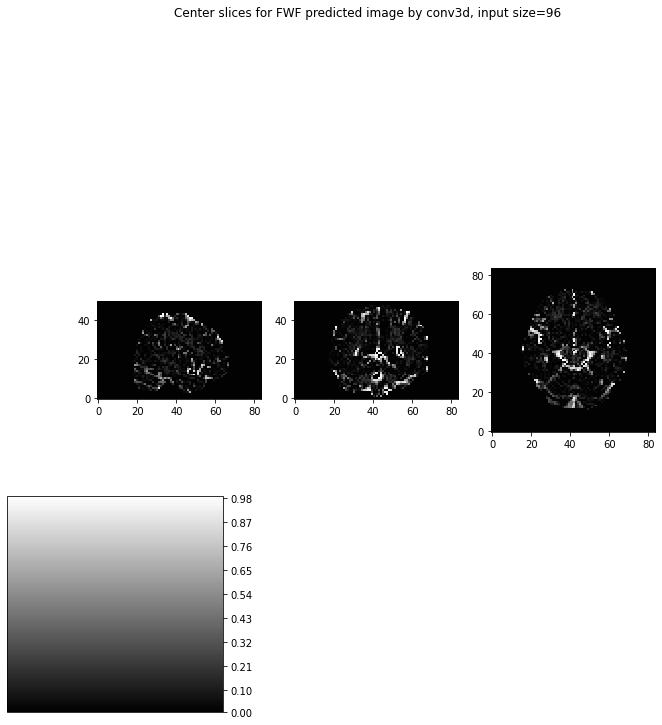

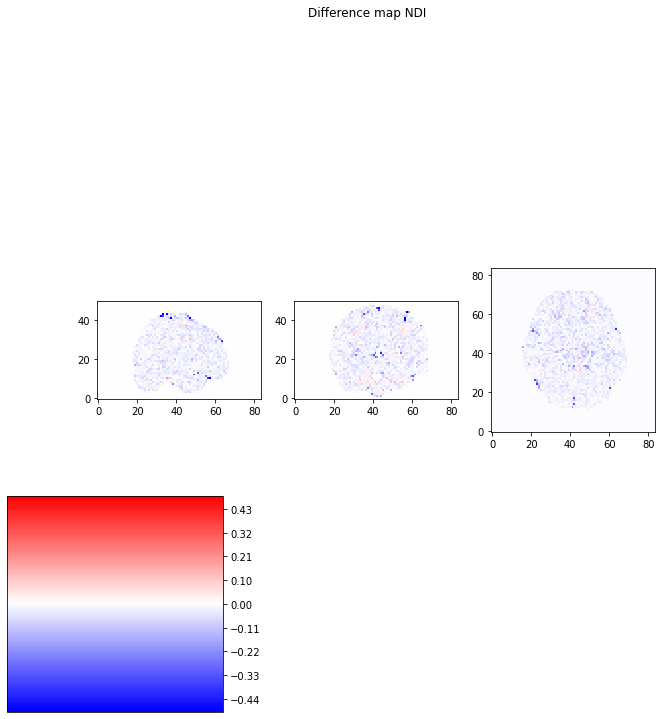

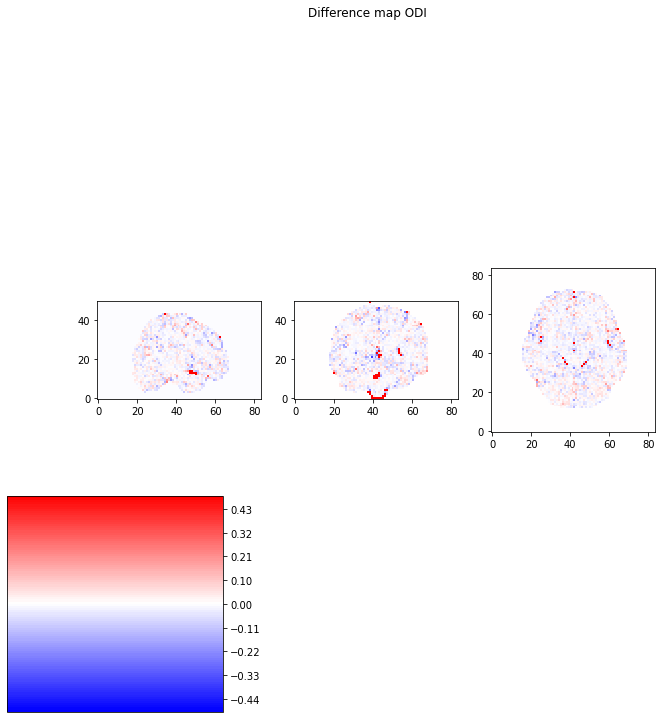

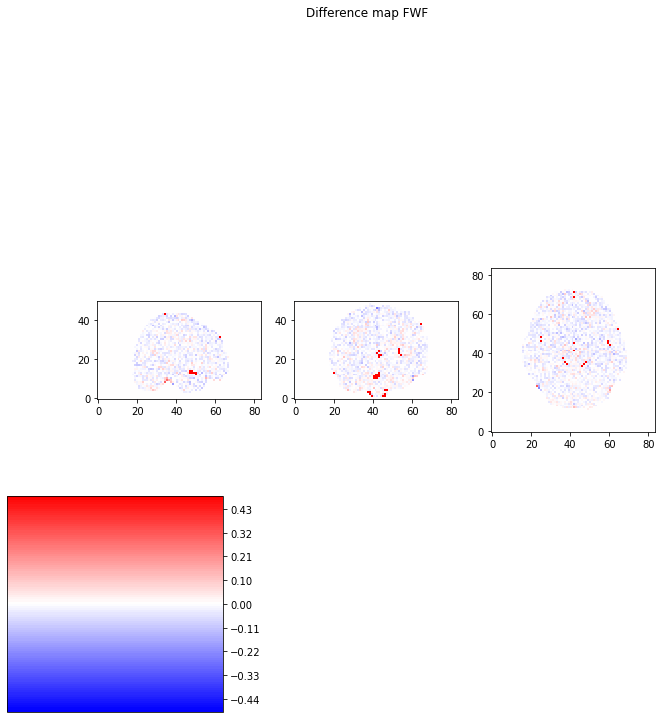

In [119]:
visualise0(s01_NDI_img_data)
visualise0(s01_ODI_img_data)
visualise0(s01_FWF_img_data)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'fc1d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv2d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)
visualise4(s01_NDI_img_data, s01_ODI_img_data, s01_FWF_img_data, dwi, 's01_still', 'conv3d', 4, s01_NDI_affine, s01_ODI_affine, s01_FWF_affine)

Analyse Difference maps

In [120]:
ann_4_ndi_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-fc1d-patch_1-base_1-layer_4-label_NDI_difference.nii'
ann_4_odi_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-fc1d-patch_1-base_1-layer_4-label_ODI_difference.nii'
ann_4_fwf_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-fc1d-patch_1-base_1-layer_4-label_FWF_difference.nii'
ann_4_ndi_diff = nib.load(ann_4_ndi_diff_path).get_fdata()
ann_4_odi_diff = nib.load(ann_4_odi_diff_path).get_fdata()
ann_4_fwf_diff = nib.load(ann_4_fwf_diff_path).get_fdata()
# count the number voxels higher than the reference standards
threshold = 0.05
reshaped_ndi = ann_4_ndi_diff.flatten()
print(reshaped_ndi.shape)
high_ndi = 0
for e in reshaped_ndi:
    if abs(e) > threshold:
        high_ndi += 1
print(high_ndi)

reshaped_odi = ann_4_odi_diff.flatten()
high_odi = 0
for e in reshaped_odi:
    if abs(e) > threshold:
        high_odi += 1
print(high_odi)

reshaped_fwf = ann_4_fwf_diff.flatten()
high_fwf = 0
for e in reshaped_fwf:
    if abs(e) > threshold:
        high_fwf += 1
print(high_fwf)

s01_voxels = 81882
s02_voxels = 91401

print('% of high ndi: ' + str((high_ndi/s02_voxels)*100))
print('% of high odi: ' + str((high_odi/s02_voxels)*100))
print('% of high fwf: ' + str((high_fwf/s02_voxels)*100))


FileNotFoundError: No such file or no access: '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-fc1d-patch_1-base_1-layer_4-label_NDI_difference.nii'

In [ ]:
cnn2d_4_ndi_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-conv2d-patch_3-base_1-layer_4-label_NDI_difference.nii'
cnn2d_4_odi_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-conv2d-patch_3-base_1-layer_4-label_ODI_difference.nii'
cnn2d_4_fwf_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-conv2d-patch_3-base_1-layer_4-label_FWF_difference.nii'
cnn2d_4_ndi_diff = nib.load(cnn2d_4_ndi_diff_path).get_fdata()
cnn2d_4_odi_diff = nib.load(cnn2d_4_odi_diff_path).get_fdata()
cnn2d_4_fwf_diff = nib.load(cnn2d_4_fwf_diff_path).get_fdata()
# count the number voxels higher than the reference standards
threshold = 0.05
reshaped_ndi = cnn2d_4_ndi_diff.flatten()
print(reshaped_ndi.shape)
high_ndi = 0
for e in reshaped_ndi:
    if abs(e) > threshold:
        high_ndi += 1
print(high_ndi)

reshaped_odi = cnn2d_4_odi_diff.flatten()
high_odi = 0
for e in reshaped_odi:
    if abs(e) > threshold:
        high_odi += 1
print(high_odi)

reshaped_fwf = cnn2d_4_fwf_diff.flatten()
high_fwf = 0
for e in reshaped_fwf:
    if abs(e) > threshold:
        high_fwf += 1
print(high_fwf)

s01_voxels = 81882
s02_voxels = 91401

print('% of high ndi: ' + str((high_ndi/s02_voxels)*100))
print('% of high odi: ' + str((high_odi/s02_voxels)*100))
print('% of high fwf: ' + str((high_fwf/s02_voxels)*100))


In [ ]:
cnn3d_4_ndi_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-conv2d-patch_3-base_1-layer_4-label_NDI_difference.nii'
cnn3d_4_odi_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-conv2d-patch_3-base_1-layer_4-label_ODI_difference.nii'
cnn3d_4_fwf_diff_path = '/home/vw/Desktop/IndividualProject/MedICSS2021_/Net/nii/s02_still-4-conv2d-patch_3-base_1-layer_4-label_FWF_difference.nii'
cnn3d_4_ndi_diff = nib.load(cnn3d_4_ndi_diff_path).get_fdata()
cnn3d_4_odi_diff = nib.load(cnn3d_4_odi_diff_path).get_fdata()
cnn3d_4_fwf_diff = nib.load(cnn3d_4_fwf_diff_path).get_fdata()
# count the number voxels higher than the reference standards
threshold = 0.05
reshaped_ndi = cnn3d_4_ndi_diff.flatten()
print(reshaped_ndi.shape)
high_ndi = 0
for e in reshaped_ndi:
    if abs(e) > threshold:
        high_ndi += 1
print(high_ndi)

reshaped_odi = cnn3d_4_odi_diff.flatten()
high_odi = 0
for e in reshaped_odi:
    if abs(e) > threshold:
        high_odi += 1
print(high_odi)

reshaped_fwf = cnn3d_4_fwf_diff.flatten()
high_fwf = 0
for e in reshaped_fwf:
    if abs(e) > threshold:
        high_fwf += 1
print(high_fwf)

s01_voxels = 81882
s02_voxels = 91401

print('% of high ndi: ' + str((high_ndi/s02_voxels)*100))
print('% of high odi: ' + str((high_odi/s02_voxels)*100))
print('% of high fwf: ' + str((high_fwf/s02_voxels)*100))